
Notebook to make the Macrophage Supg fig1 heatmap.
Idea is to test R JupyterNotebooks tech and feasibility as FAIR sharing 
backbone in github and the cloud.

# Packages

In [1]:
library(tidyverse)
library(Seurat)
library(ComplexHeatmap)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.1.7     ✔ dplyr   1.0.9
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching SeuratObject

Attaching sp

Loading required package: grid

ComplexHeatmap version 2.12.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.

The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This mess

# Data prep

Load in datasets

In [2]:
crctmeWT <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeWT.rds")
crctmeA <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeA.rds")
crctmeAK <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeAK.rds")
crctmeAKP <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeAKP.rds")
tmecontrols <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/tmecontrols.rds")
for (i in 1:length(crctmeWT)) {
  print(crctmeWT[[i]]@project.name)
  print(unique(crctmeWT[[i]]@active.ident))
}
for (i in 1:length(crctmeA)) {
  print(crctmeA[[i]]@project.name)
  print(unique(crctmeA[[i]]@active.ident))
}
for (i in 1:length(crctmeAK)) {
  print(crctmeAK[[i]]@project.name)
  print(unique(crctmeAK[[i]]@active.ident))
}
for (i in 1:length(crctmeAKP)) {
  print(crctmeAKP[[i]]@project.name)
  print(unique(crctmeAKP[[i]]@active.ident))
}
for (i in 1:length(tmecontrols)) {
  print(tmecontrols[[i]]@project.name)
  print(unique(tmecontrols[[i]]@active.ident))
}

[1] "cocultWTFib"
 [1] fCd34      fCd34frz   eAbs       eStemE     fCd34cyc   fThy1     
 [7] fCd34myo   eStem/AbsP eBasal     eSec       fLowQ     
11 Levels: fThy1 fCd34frz fCd34myo fCd34 eStemE eStem/AbsP fCd34cyc ... fLowQ
[1] "cocultWTMac"
[1] mC1    eStem2 mHmox  eAbs   eSec   eAbsP  eStem1
Levels: mHmox eAbs mC1 eStem2 eAbsP eStem1 eSec
[1] "cocultWTMacFib"
 [1] eStem    mC1      eAbs/Sec mHmox    fCd34-3  fCd34cyc eBasal   fCd34-2 
 [9] fCd34-1  fCd34-4  fThy1    mMid     mS100   
13 Levels: mC1 eStem eAbs/Sec fCd34-1 mMid mHmox fCd34-2 fCd34cyc ... fCd34-4
[1] "cocultAFib"
[1] fCd34-1  fCd34myo eStem    eStemOE  eBasal   fThy1    fCd34-2  eAbsP   
[9] eSec    
Levels: fCd34-1 eStem fThy1 fCd34myo eStemOE fCd34-2 eBasal eAbsP eSec
[1] "cocultAMac"
[1] eAbs/Sec  mMid1     mMid2     eStem     mC1       eStemOE   eStemArtf
[8] mHmox     mMid3    
Levels: mC1 eStem eAbs/Sec mHmox mMid1 mMid2 eStemOE eStemArtf mMid3
[1] "cocultAMacFib"
[1] fCd34-2       eStemOE       mHmox         e

wE USED mito_content <3 $nCount_RNA<86000 & nCount_RNA>1800 & nFeature_RNA>1200

In [6]:
INTmac_list <- c()
for (i in c(2,3)) { #Obejcts with macs are first and third entries
  INTmac_list <- append(INTmac_list, 
                        c(
                        subset(crctmeWT[[i]], idents = levels(
                          crctmeWT[[i]]@active.ident)[startsWith(
                                levels(crctmeWT[[i]]@active.ident), "m")]),
                        subset(crctmeA[[i]], idents = levels(
                          crctmeA[[i]]@active.ident)[startsWith(
                                levels(crctmeA[[i]]@active.ident), "m")]),
                        subset(crctmeAK[[i]], idents = levels(
                          crctmeAK[[i]]@active.ident)[startsWith(
                                levels(crctmeAK[[i]]@active.ident), "m")]),
                        subset(crctmeAKP[[i]], idents = levels(
                          crctmeAKP[[i]]@active.ident)[startsWith(
                                levels(crctmeAKP[[i]]@active.ident), "m")]),
                        subset(tmecontrols[[i]], idents = levels(
                          tmecontrols[[i]]@active.ident)[startsWith(
                                levels(tmecontrols[[i]]@active.ident), "m")])
                        )
                        )
}
length(INTmac_list)

[1] 10

In [7]:
for (i in 1:length(INTmac_list)) {
    print(unique(INTmac_list[[i]]@active.ident))
    names(INTmac_list)[i] <- INTmac_list[[i]]@project.name
}
INTmac_list

[1] mC1   mHmox
Levels: mHmox mC1
[1] mMid1 mMid2 mC1   mHmox mMid3
Levels: mC1 mHmox mMid1 mMid2 mMid3
[1] mC1   mMid  mHmox
Levels: mC1 mMid mHmox
[1] mC1   mMid1 mHmox mMid2
Levels: mC1 mMid1 mHmox mMid2
[1] mMid1     mC1histoc mHmox     mC1inf    mMid3     mMid2     mS100    
Levels: mC1histoc mHmox mC1inf mMid1 mMid2 mMid3 mS100
[1] mC1   mHmox mMid  mS100
Levels: mC1 mMid mHmox mS100
[1] mHmox mC1  
Levels: mHmox mC1
[1] mHmox   mC1     mfArtf  mS100-2 mS100-1
Levels: mC1 mHmox mfArtf mS100-1 mS100-2
[1] mHmox mC1   mMid  mS100
Levels: mHmox mC1 mMid mS100
[1] mS100 mC1-2 mC1-1 mMid  mHmox
Levels: mC1-1 mC1-2 mHmox mMid mS100


$cocultWTMac
An object of class Seurat 
35568 features across 1107 samples within 2 assays 
Active assay: SCT (17294 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$cocultAMac
An object of class Seurat 
36612 features across 1656 samples within 2 assays 
Active assay: SCT (17793 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$cocultAKMac
An object of class Seurat 
35874 features across 1537 samples within 2 assays 
Active assay: SCT (17309 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$cocultAKPMac_REPLICATE
An object of class Seurat 
38819 features across 1677 samples within 2 assays 
Active assay: SCT (18218 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$monoMac
An object of class Seurat 
29693 feat

## QC/Filtering

Filtering stuff

[1] "cocultWTMac"
[1] "cocultAMac"


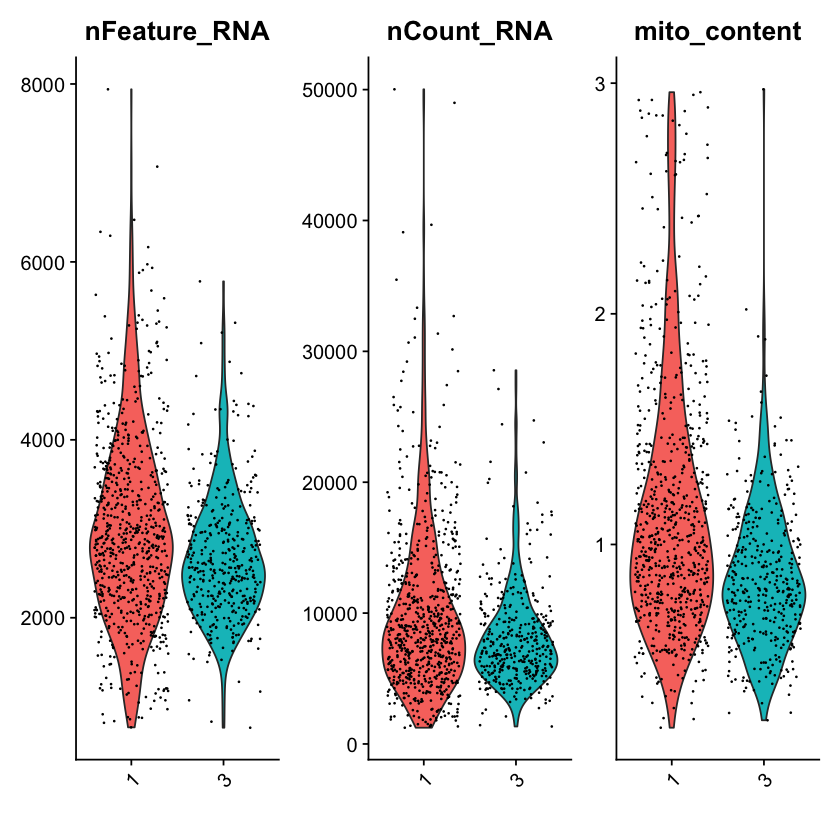

[1] "cocultAKMac"


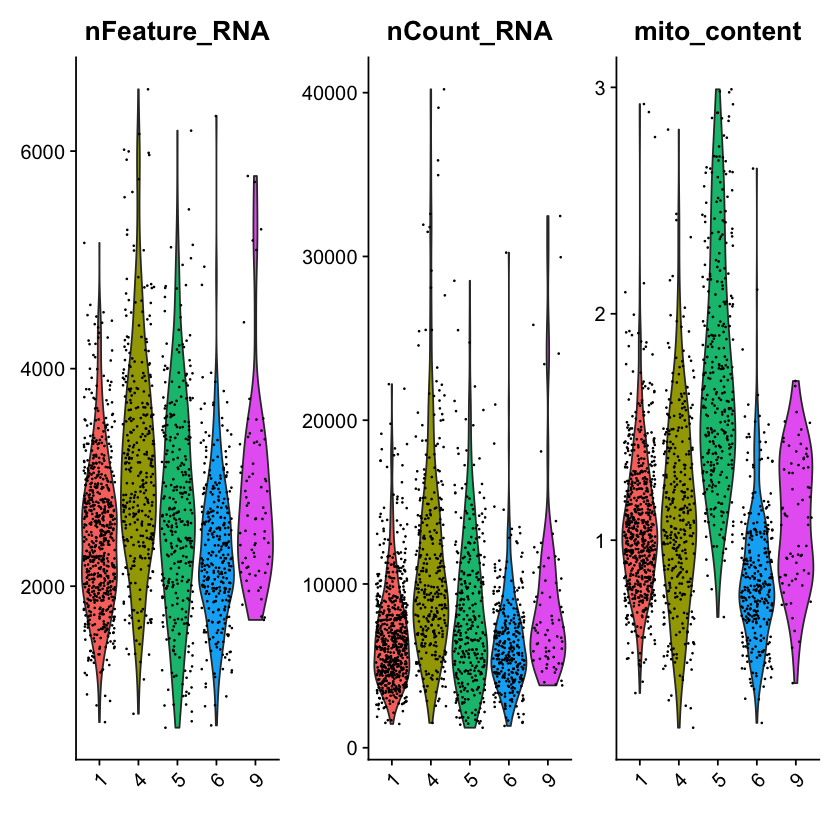

[1] "cocultAKPMac_REPLICATE"


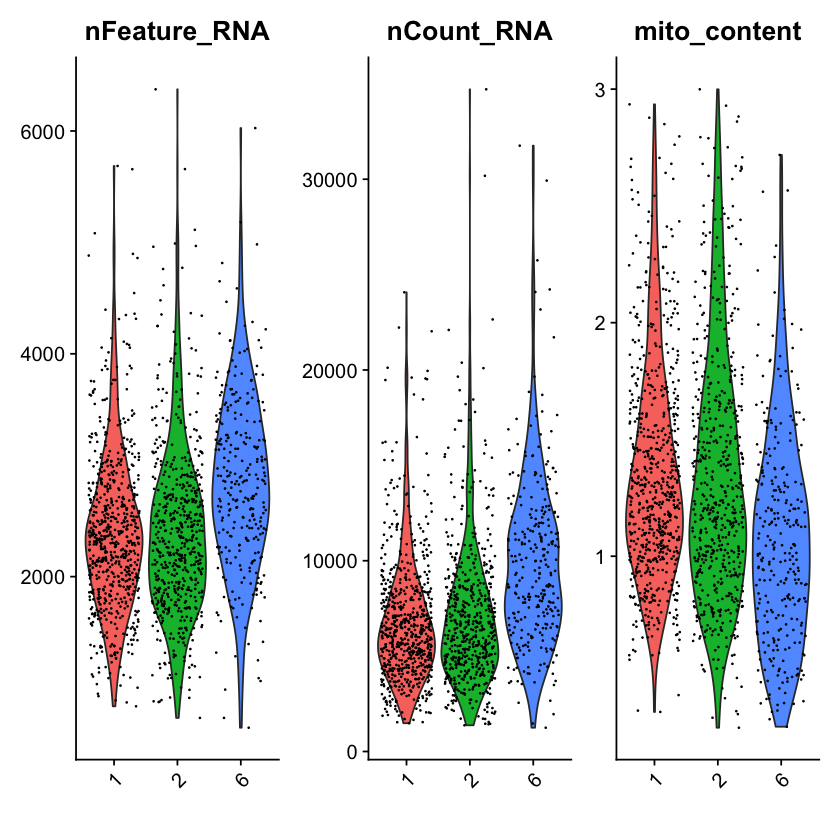

[1] "monoMac"


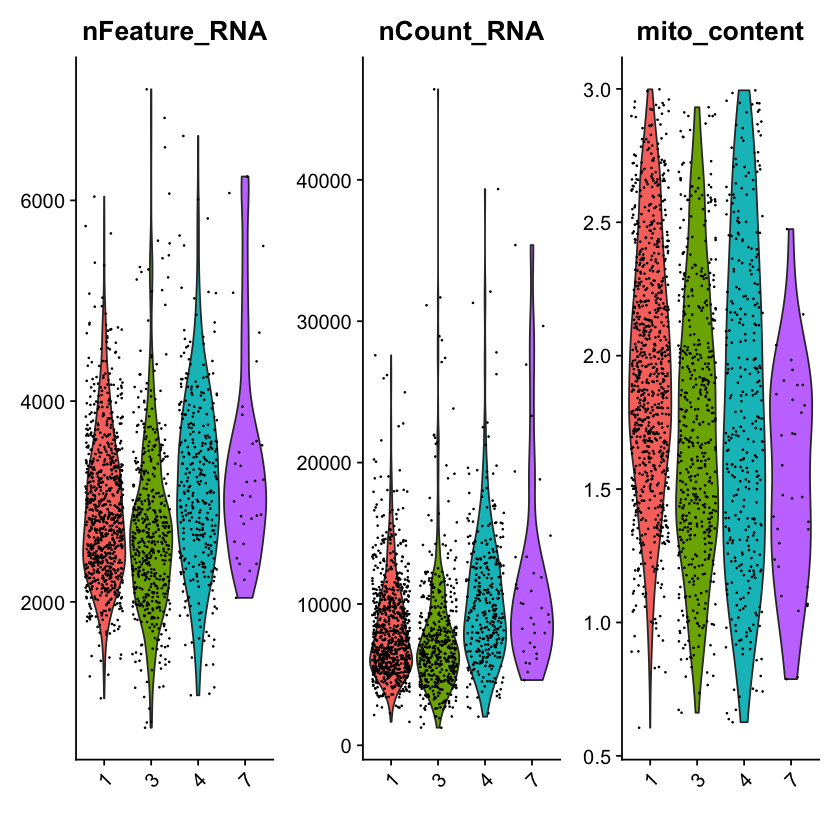

[1] "cocultWTMacFib"


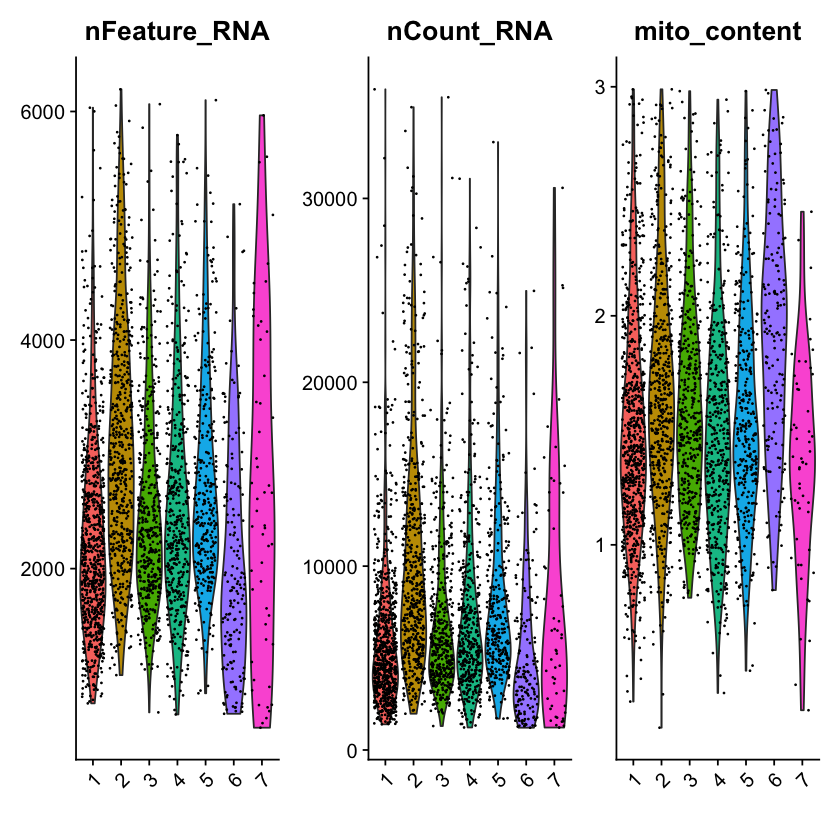

[1] "cocultAMacFib"


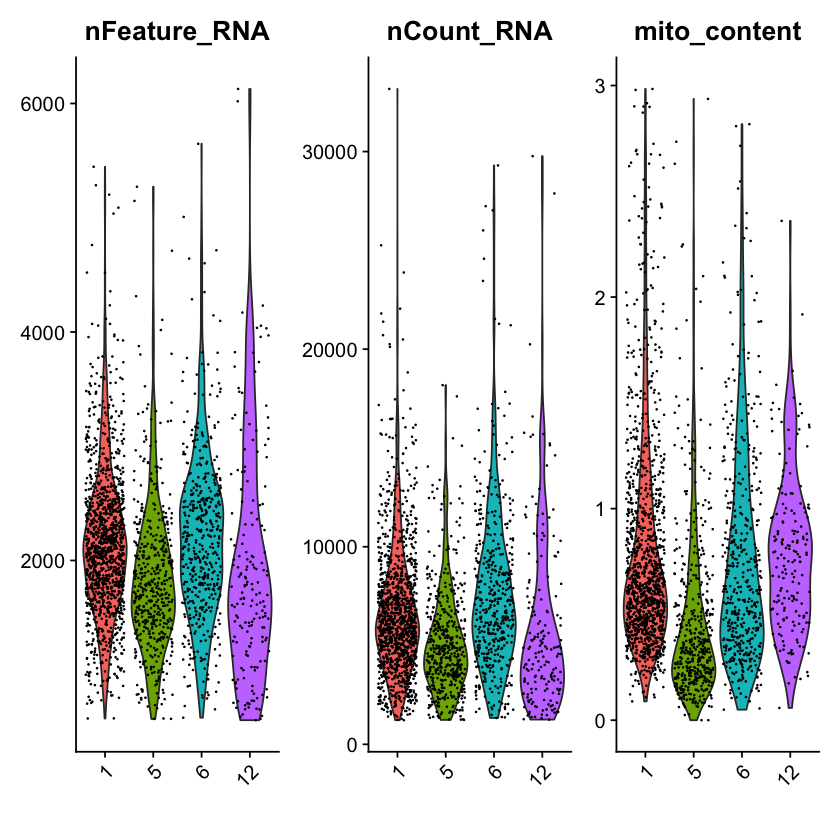

[1] "cocultAKMacFib"


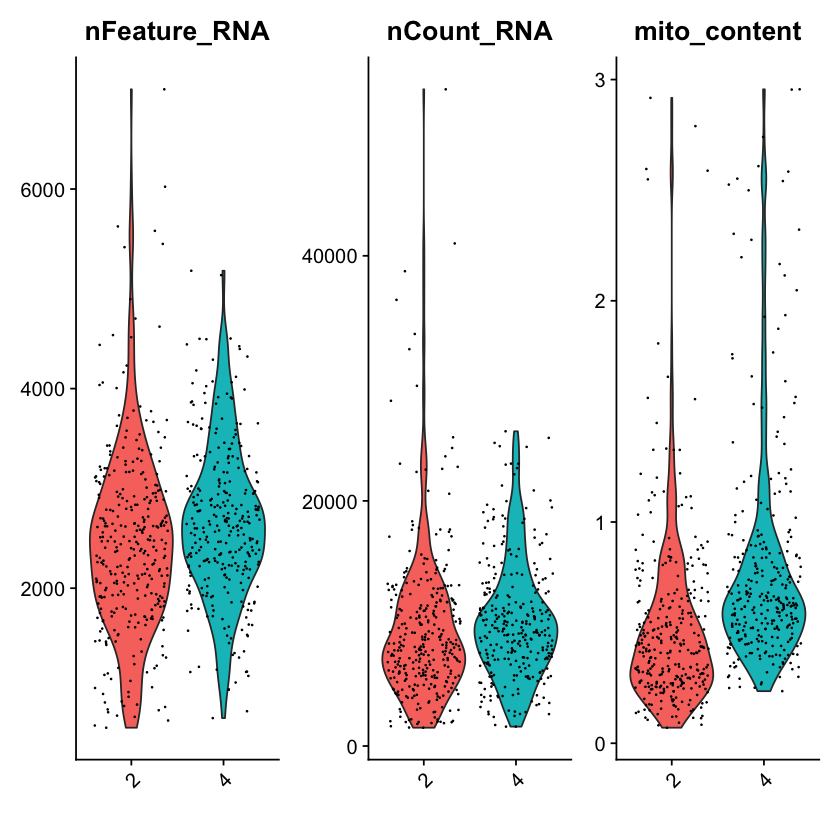

[1] "cocultAKPMacFib"


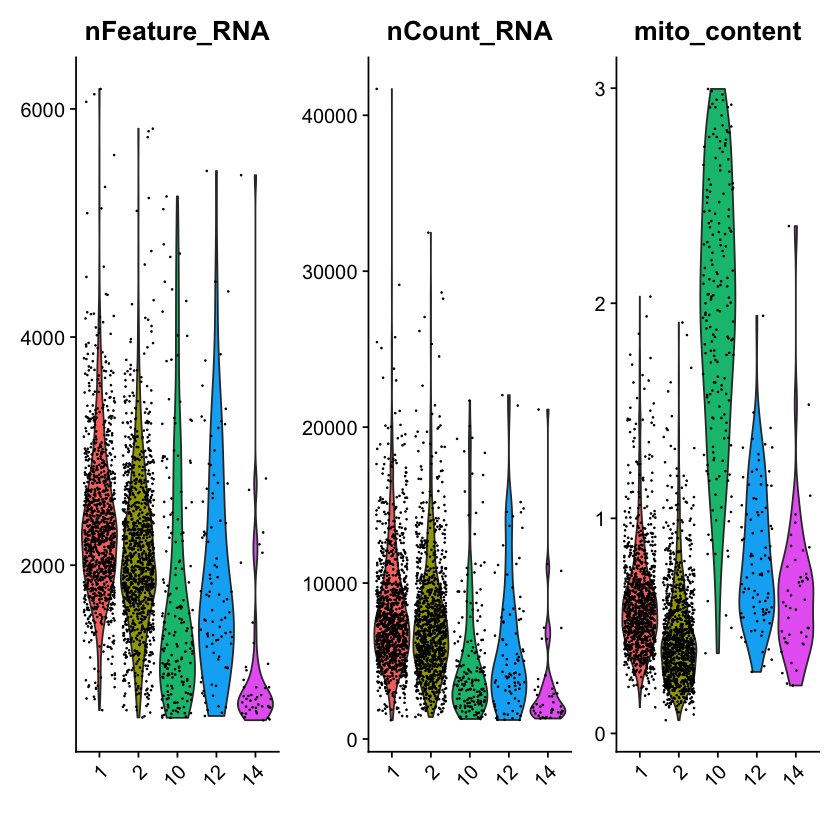

[1] "cocultMacFib"


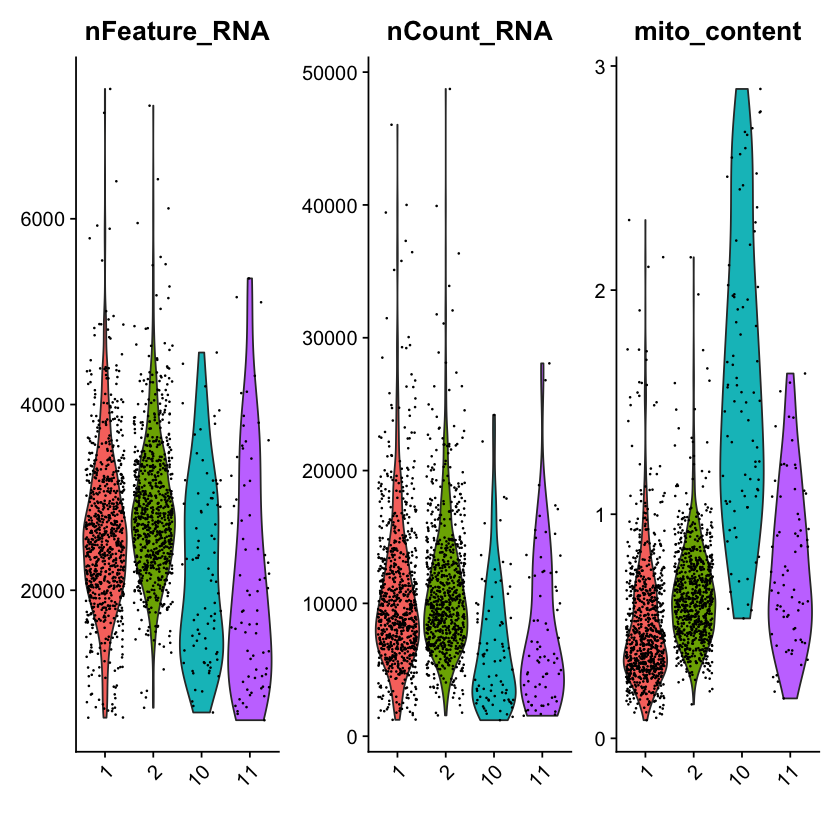

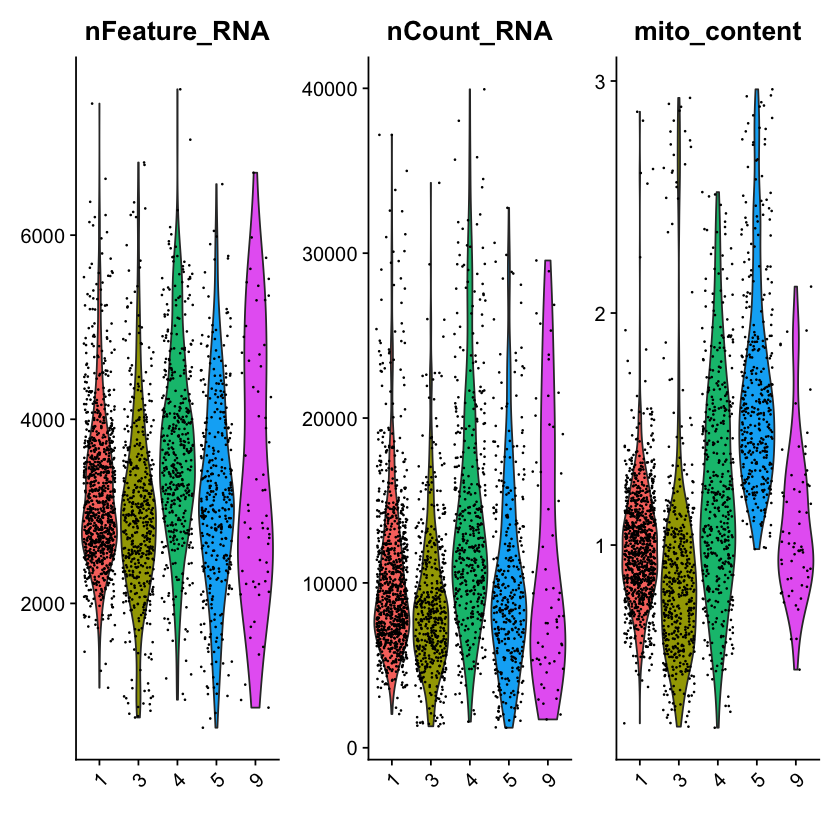

In [8]:
for (i in 1:length(INTmac_list)) {
  print(INTmac_list[[i]]@project.name)
  print(VlnPlot(INTmac_list[[i]], features = c("nFeature_RNA", "nCount_RNA",
                                                "mito_content"),
                ncol = 3, assay = "RNA", group.by = "seurat_clusters", stack = FALSE) &
        xlab(""))
  }

Warning message:
“Removed 1 rows containing missing values (geom_hline).”
Warning message:
“Removed 1 rows containing missing values (geom_hline).”


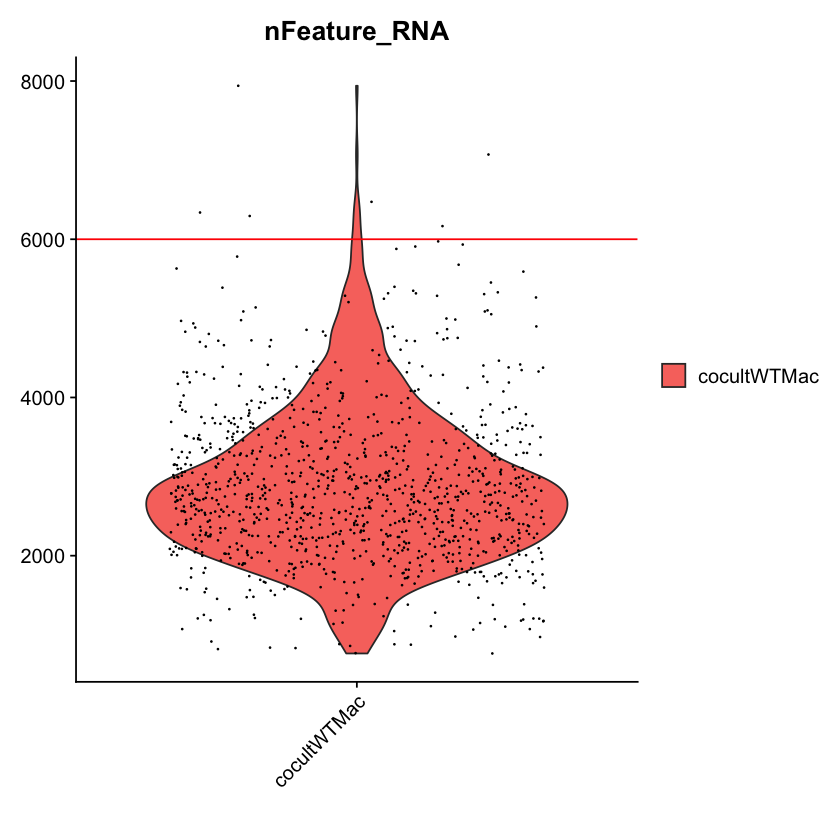

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


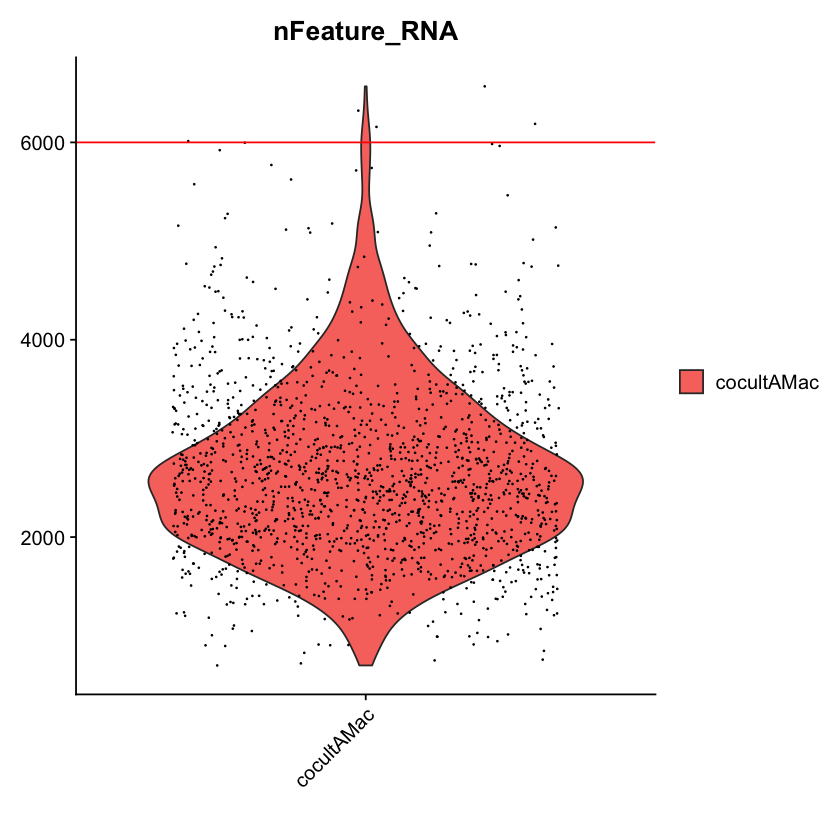

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


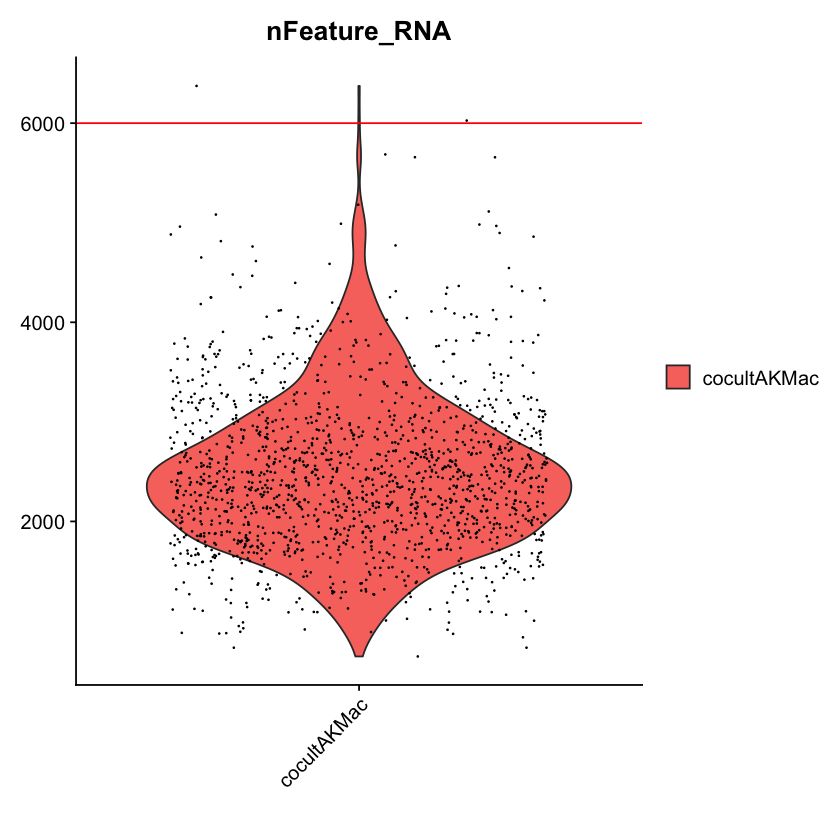

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


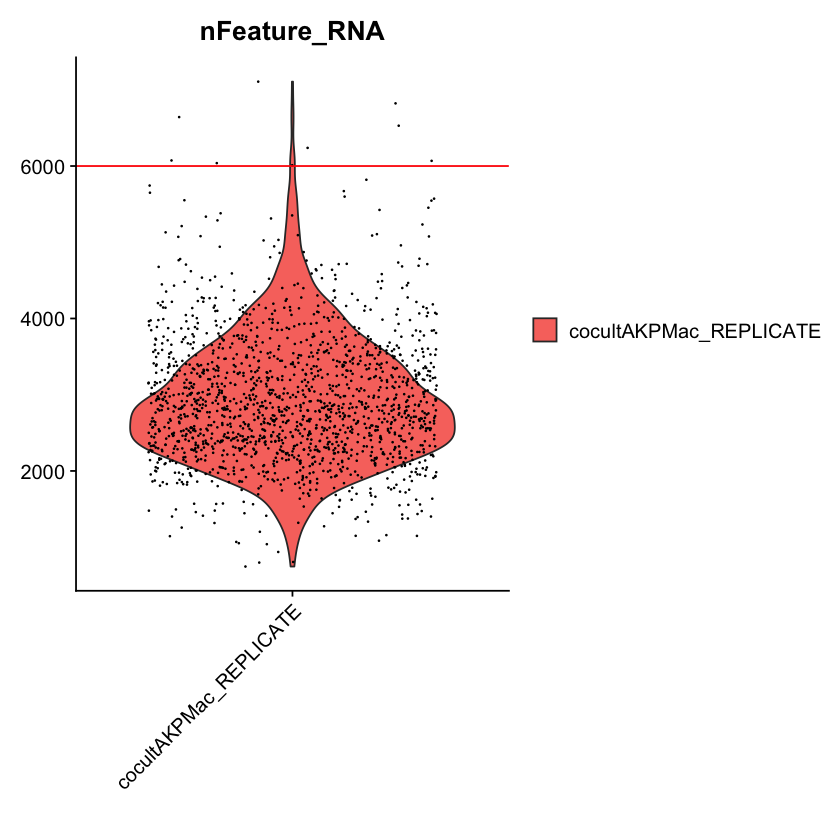

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


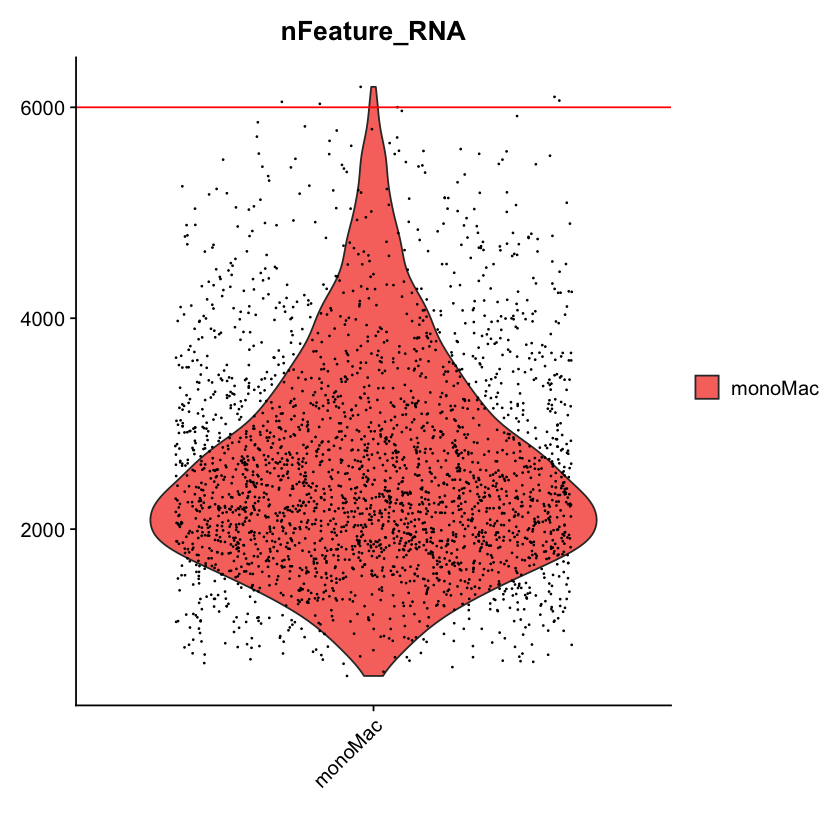

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


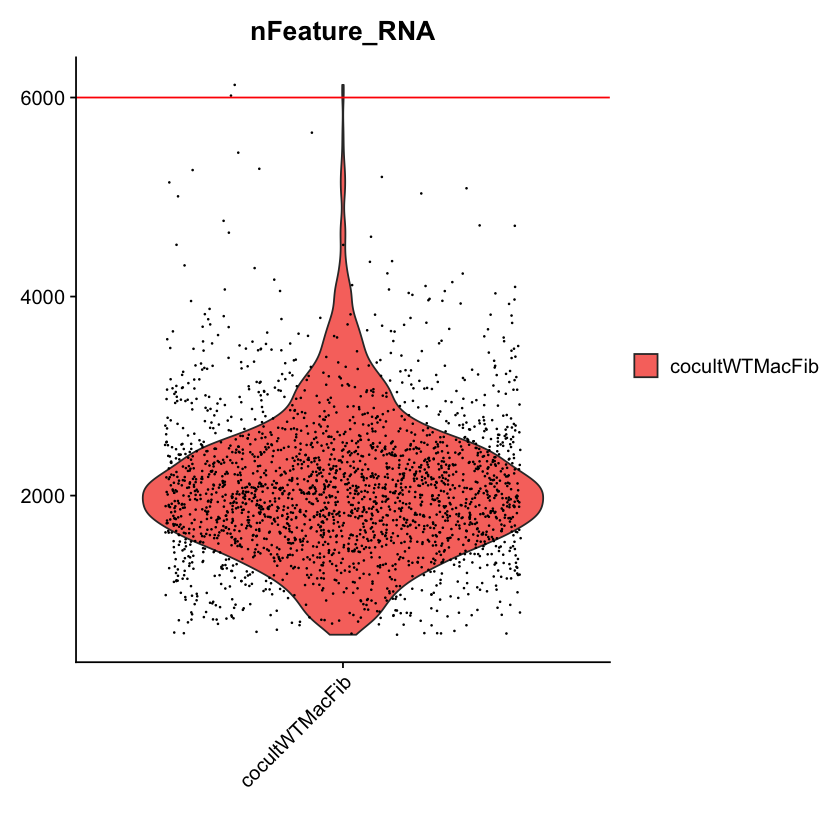

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


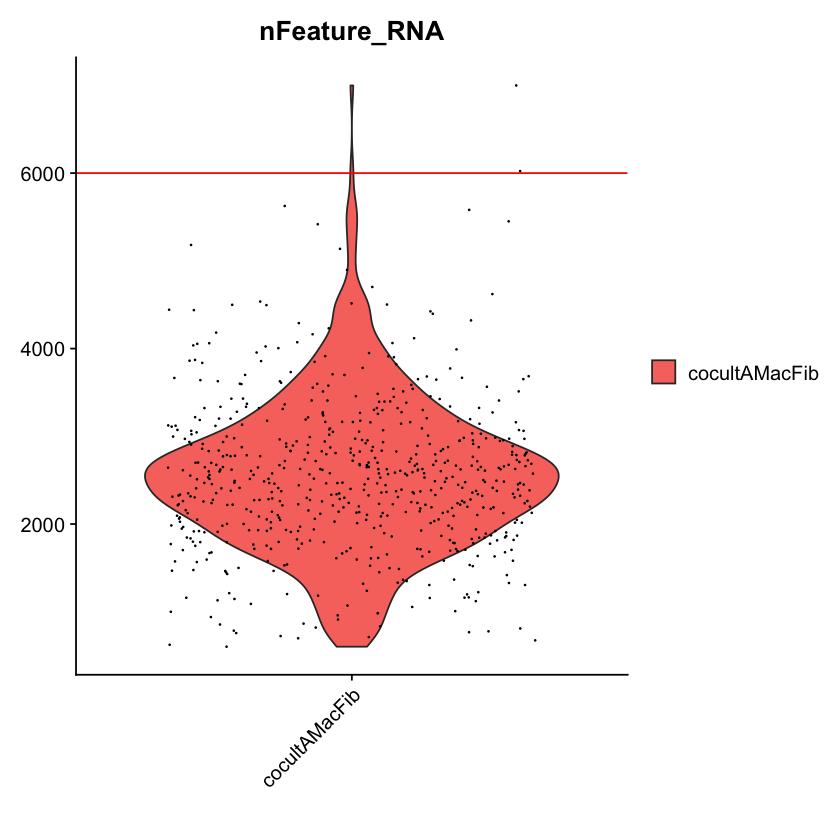

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


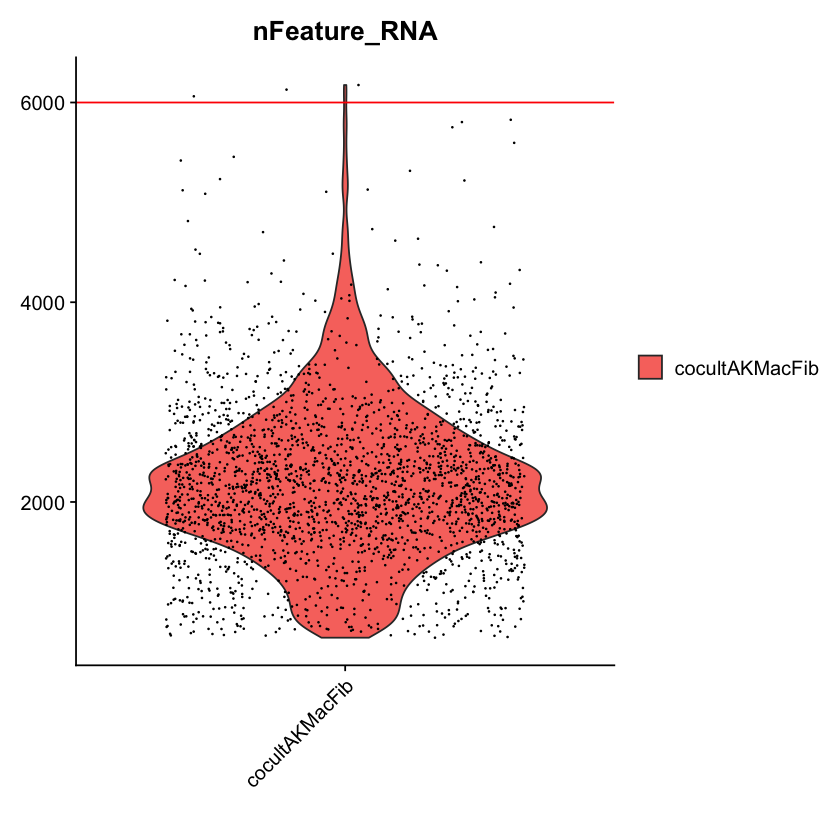

Warning message:
“Removed 1 rows containing missing values (geom_hline).”


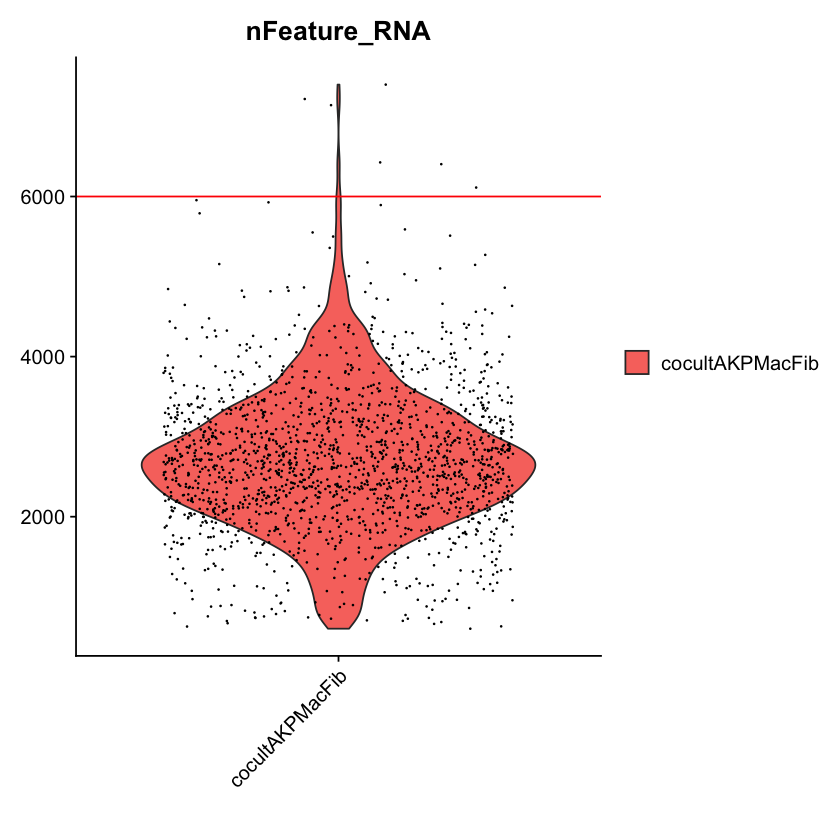

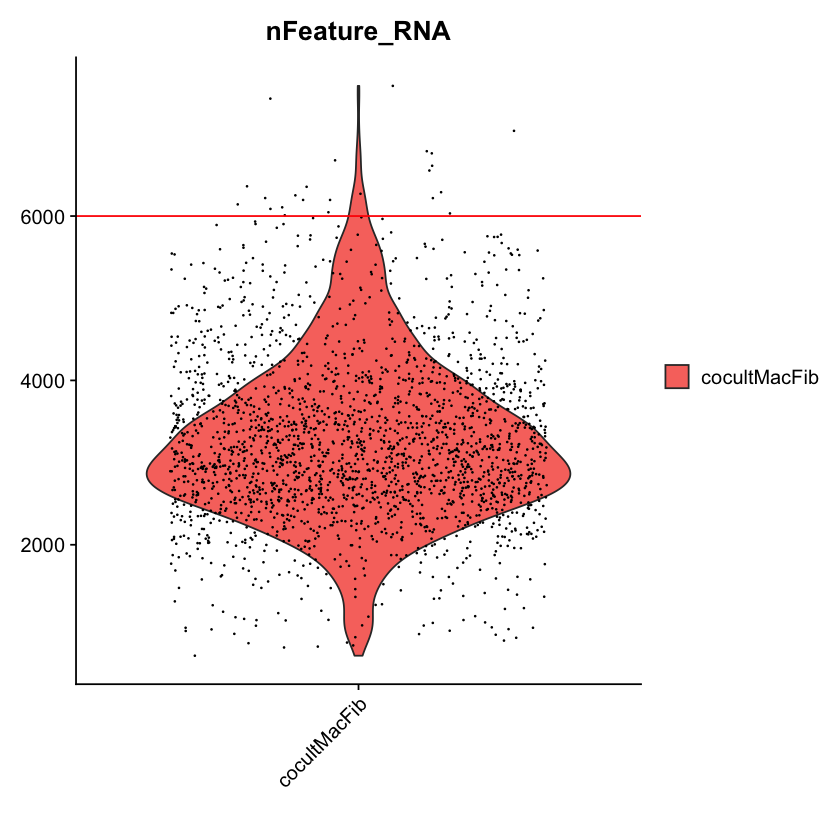

In [13]:
for (i in 1:length(INTmac_list)) {
  print(VlnPlot(INTmac_list[[i]], features = c("nFeature_RNA"),
                ncol = 1, assay = "RNA", group.by = "orig.ident", stack = FALSE) &
          xlab("") &
          geom_hline(yintercept = c(600, 6000), col="red")
        )
    # print(VlnPlot(INTfibF1_list[[i]], features = c("nCount_RNA"),
    #             ncol = 1, assay = "RNA", group.by = "orig.ident", stack = FALSE) &
    #       xlab("") &
    #       geom_hline(yintercept = 2400, col="red")
    #     )
  }

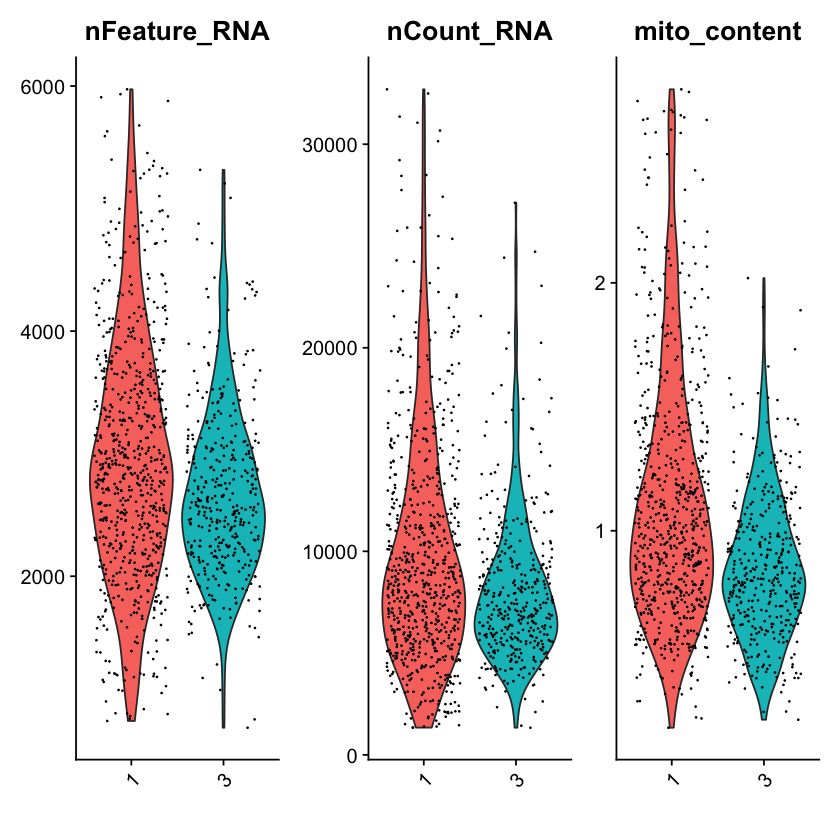

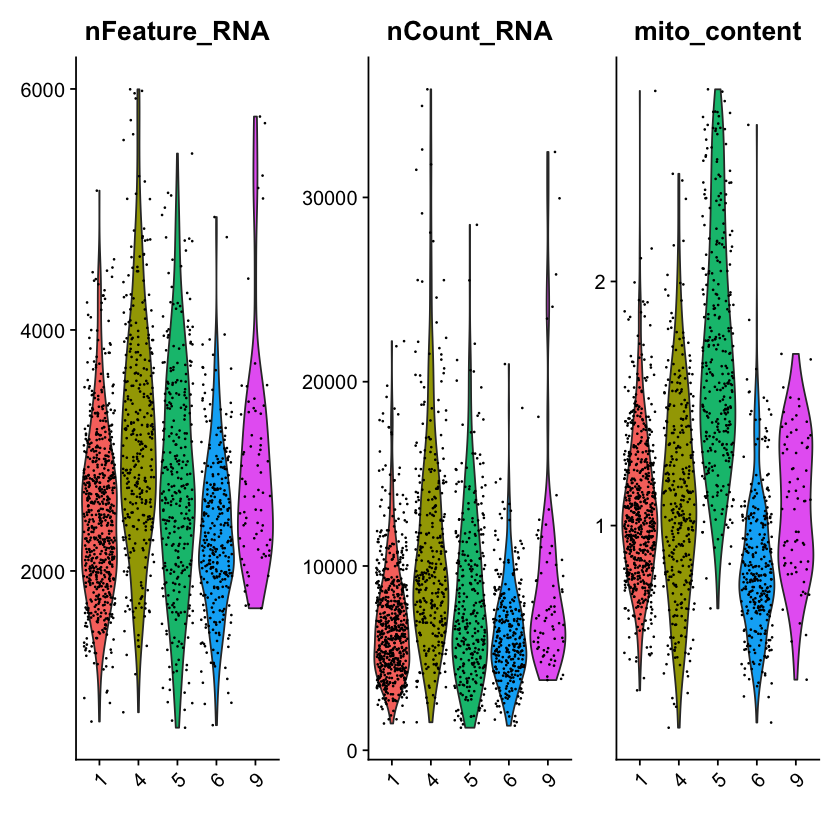

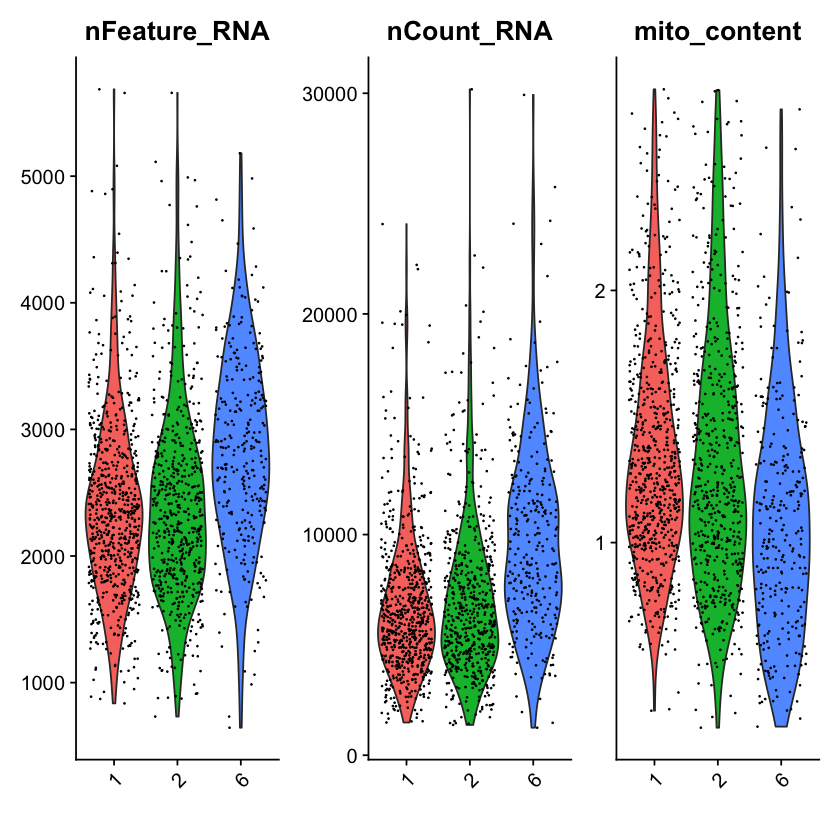

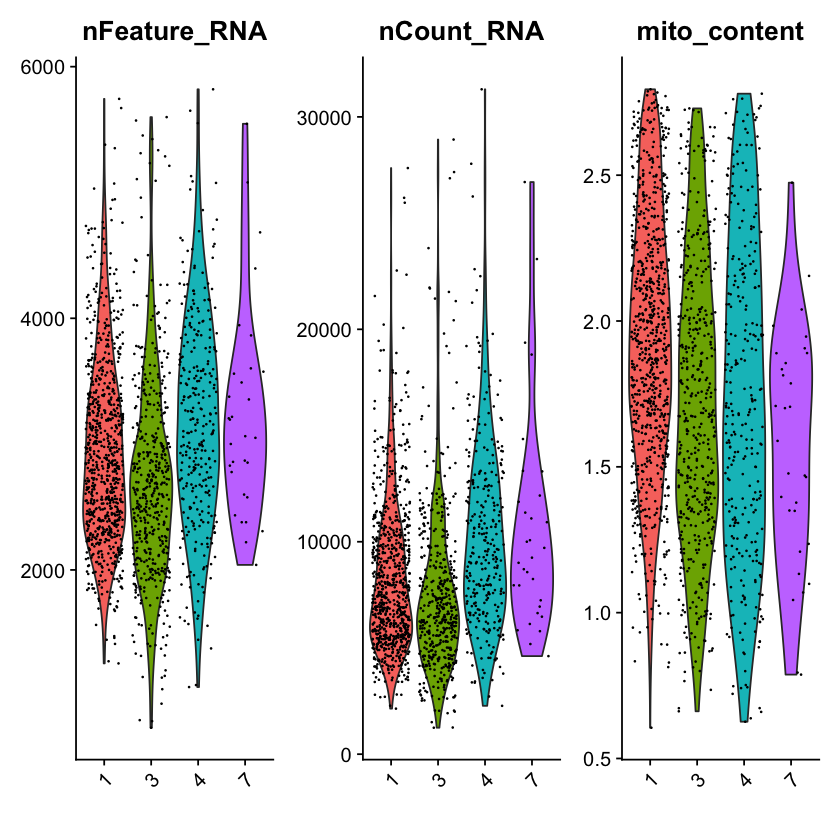

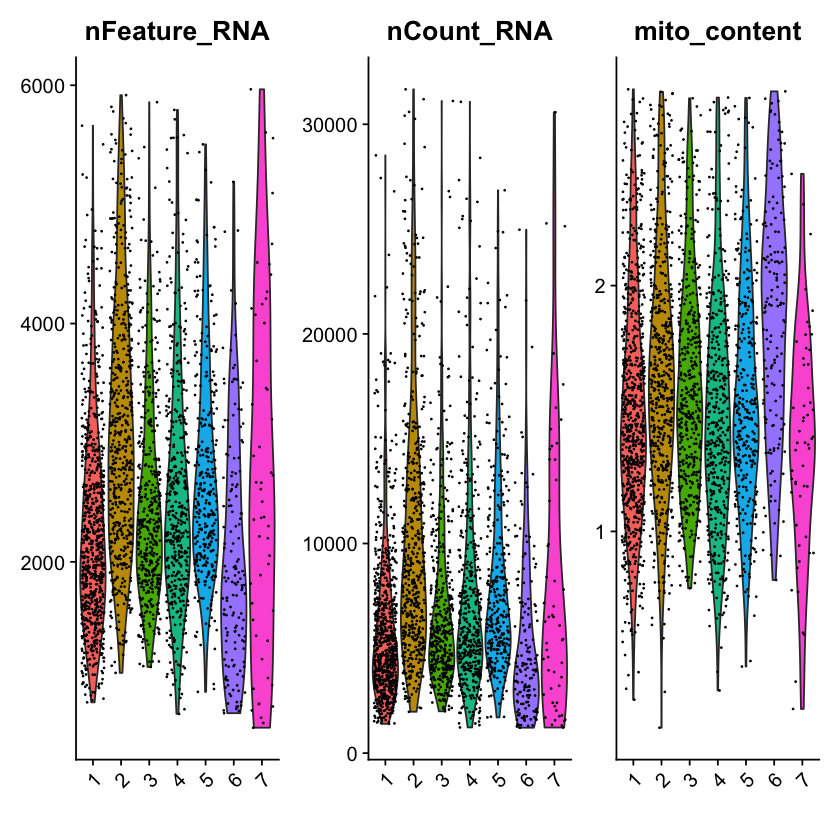

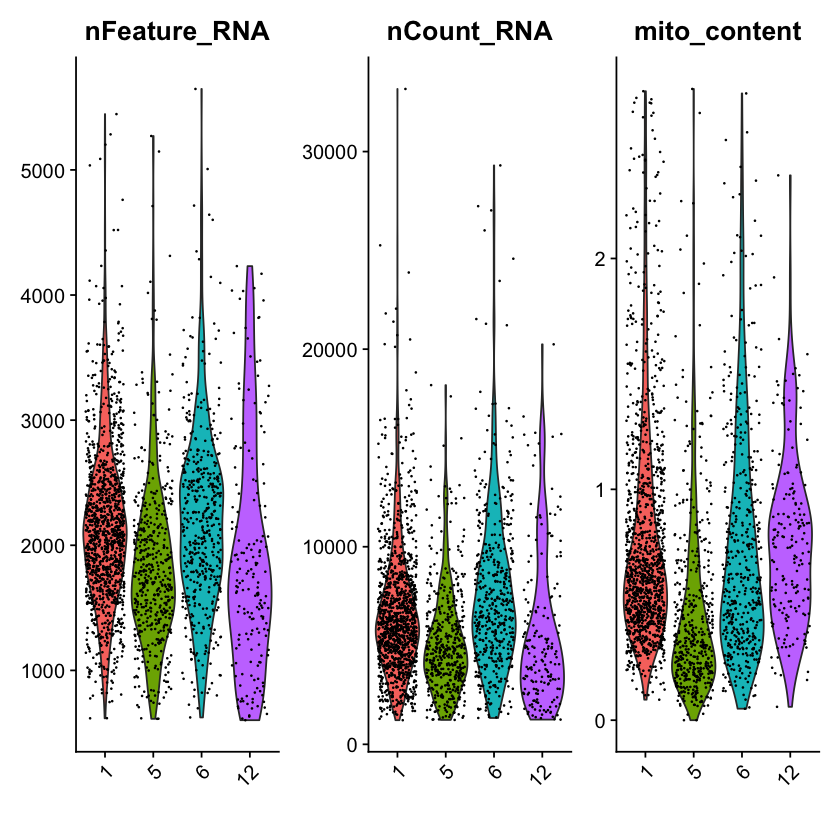

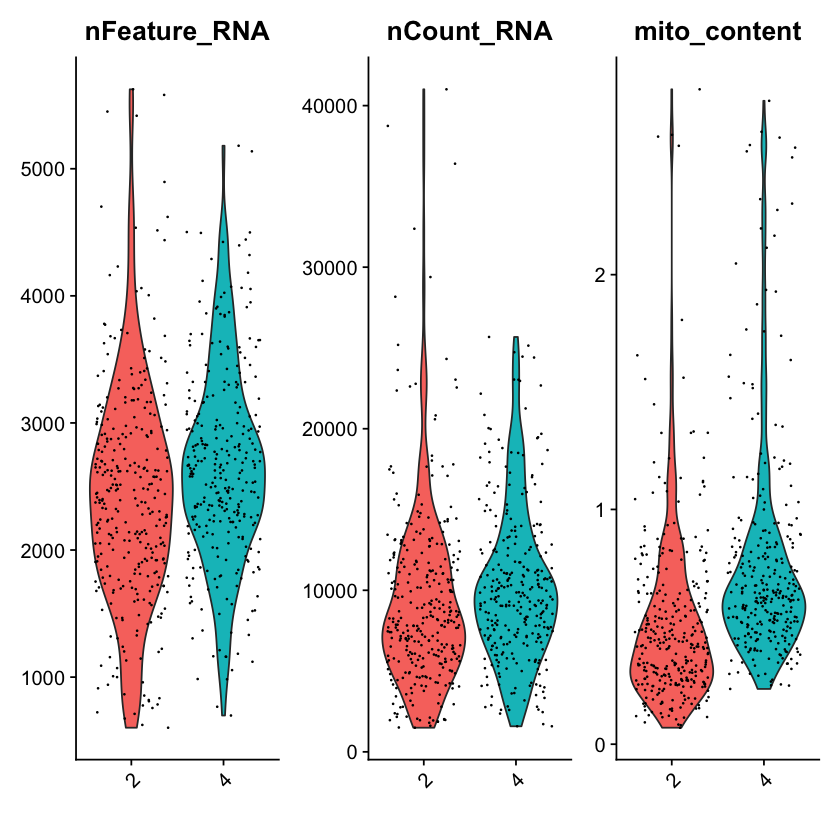

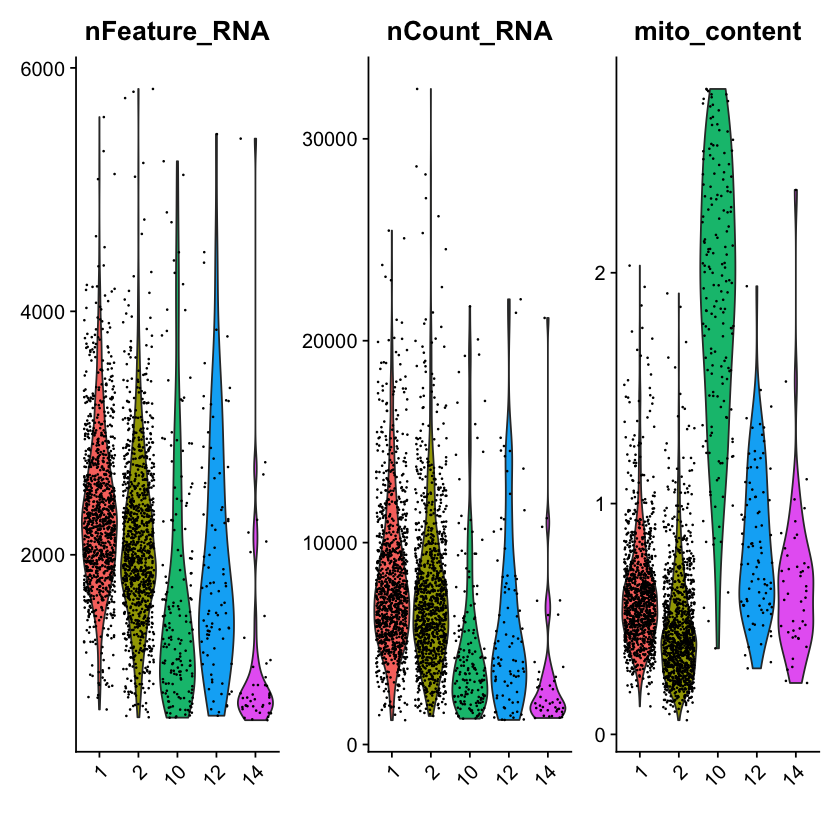

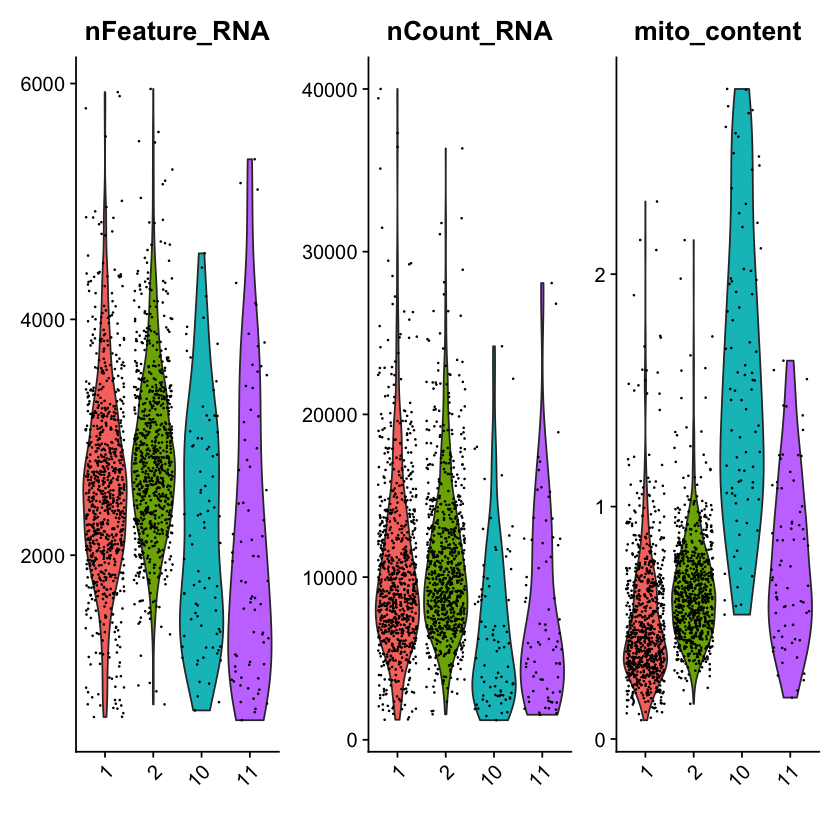

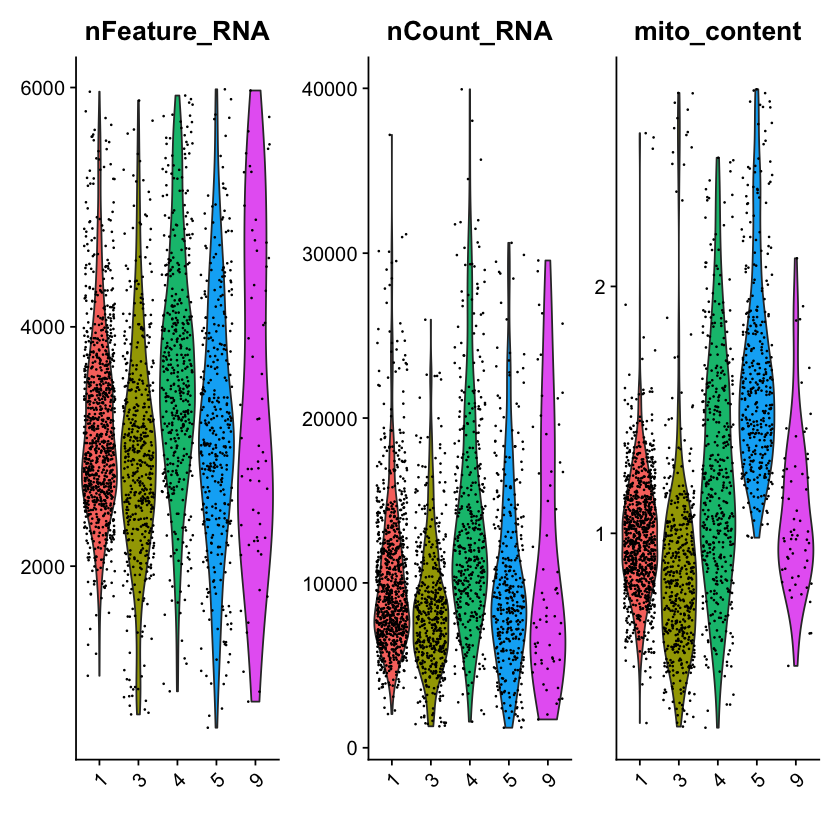

In [14]:
for (i in 1:length(INTmac_list)) {
  INTmac_list[[i]] <- subset(INTmac_list[[i]],
                              subset = mito_content<2.8 &
                                      nFeature_RNA>600 &       
                                        nFeature_RNA<6000
                            )
    print(VlnPlot(INTmac_list[[i]], features = c("nFeature_RNA", "nCount_RNA",
                                                "mito_content"),
                ncol = 3, assay = "RNA", group.by = "seurat_clusters", stack = FALSE) &
        xlab(""))
  
}

Filtering low MAC MARKER expression cells:
Use the CD45 markers and a similar approach tot hat used to filter INTepi cells with epithelial like marker expression.
Consider also looking into epithelial and fibroblas marker expression

<!-- We will use Ptprc, for 2 reasons:
* If we use them all using &AND& se filter too many cells 
    * Using |OR| is too lenient on the other hand
* Vlnplots show that expression for a big number of cells in certain clusters is 0 
for some of the other genes. This does not happen to teh same degree for Dcn and Ptn in fibro clusters and Epcam in epi clusters. -->


In [15]:
fib_markers <- c("Dcn", "Ptn")
epi_markers <- c("Epcam")
mac_markers <- c("Ptprc")

[1] "cocultWTMac"


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”


[1] "cocultAMac"


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”


[1] "cocultAKMac"


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”


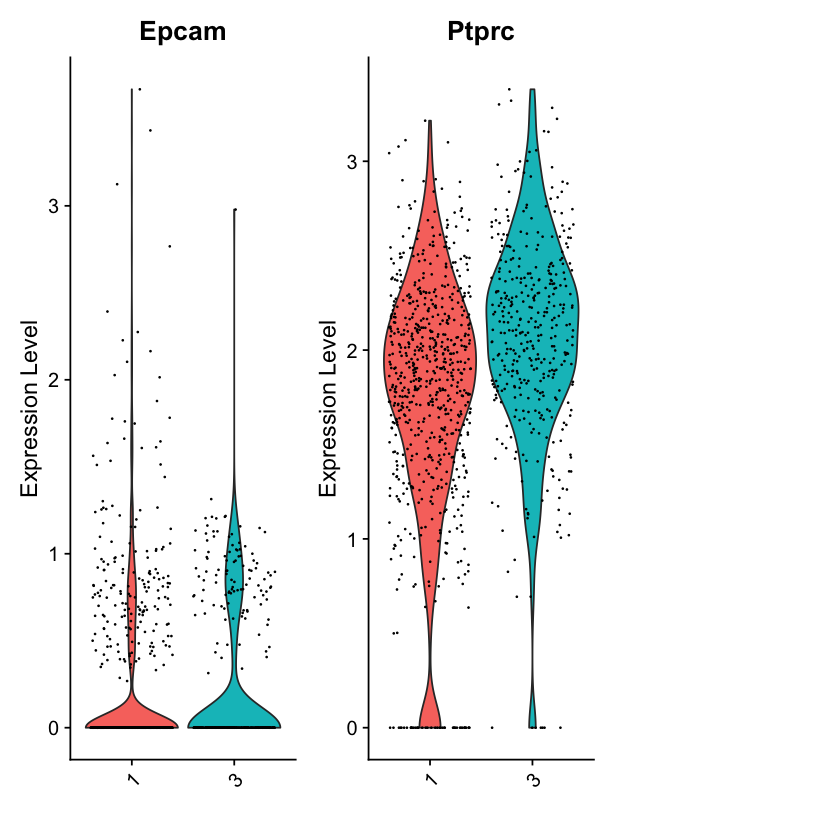

[1] "cocultAKPMac_REPLICATE"


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”


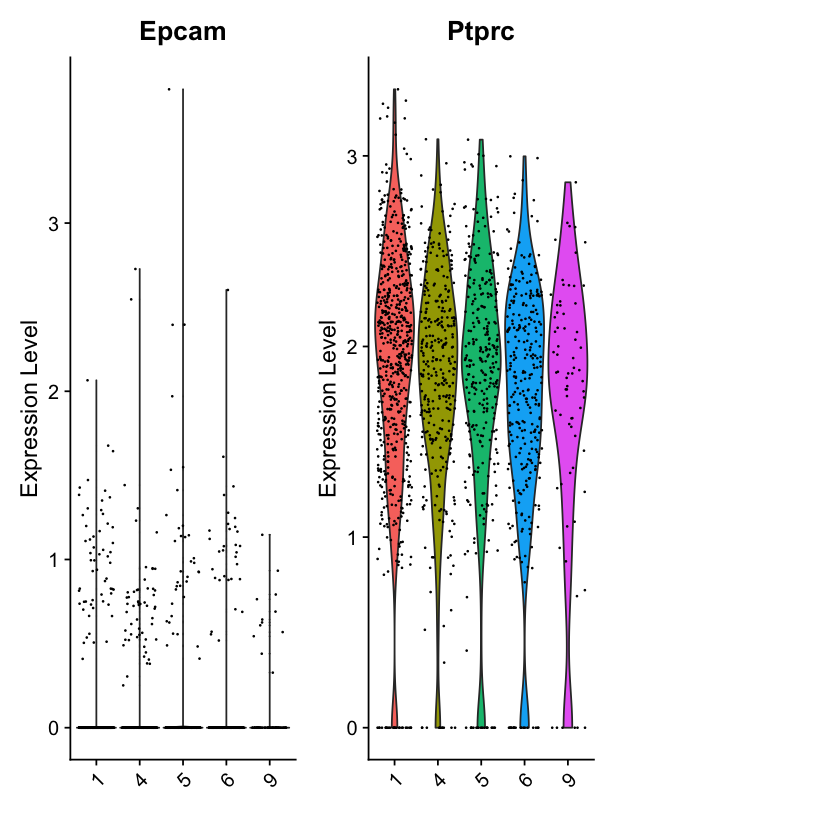

[1] "monoMac"


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn, Epcam”


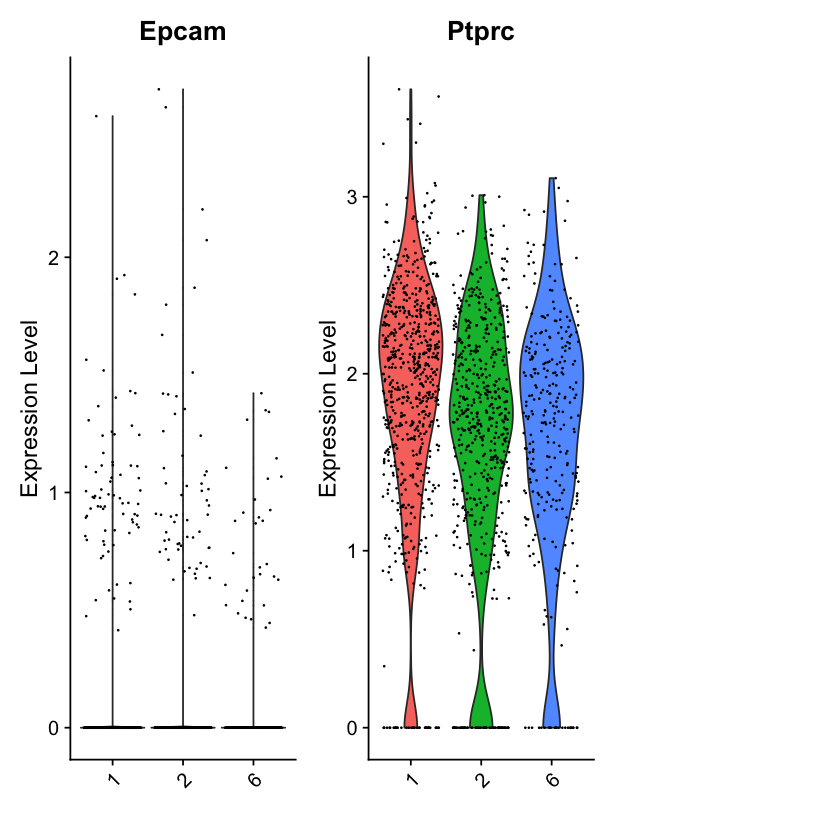

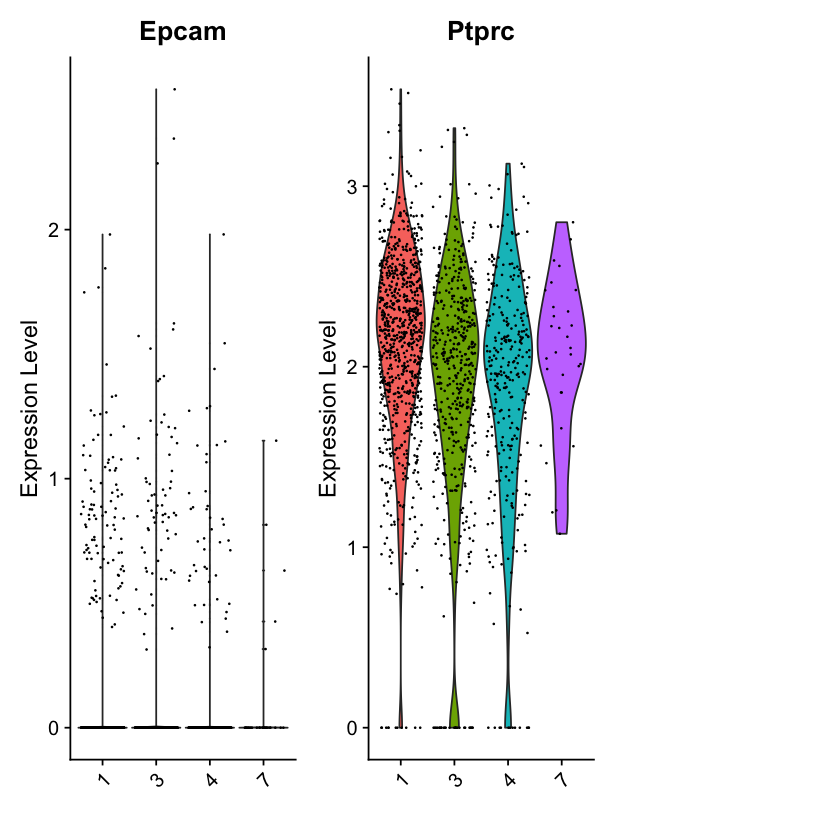

[1] "cocultWTMacFib"


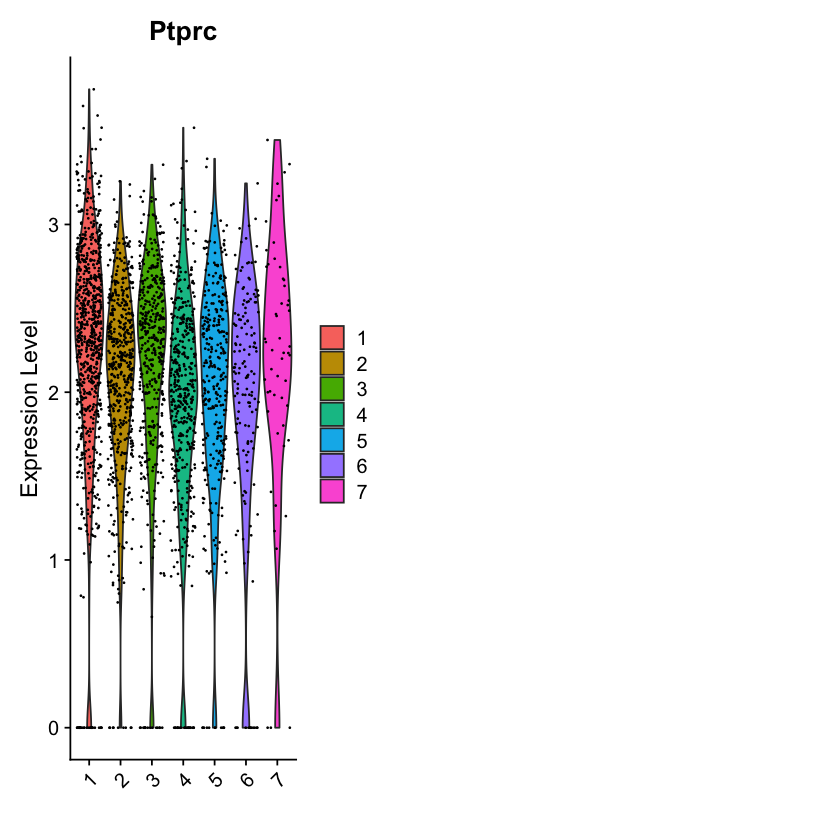

[1] "cocultAMacFib"


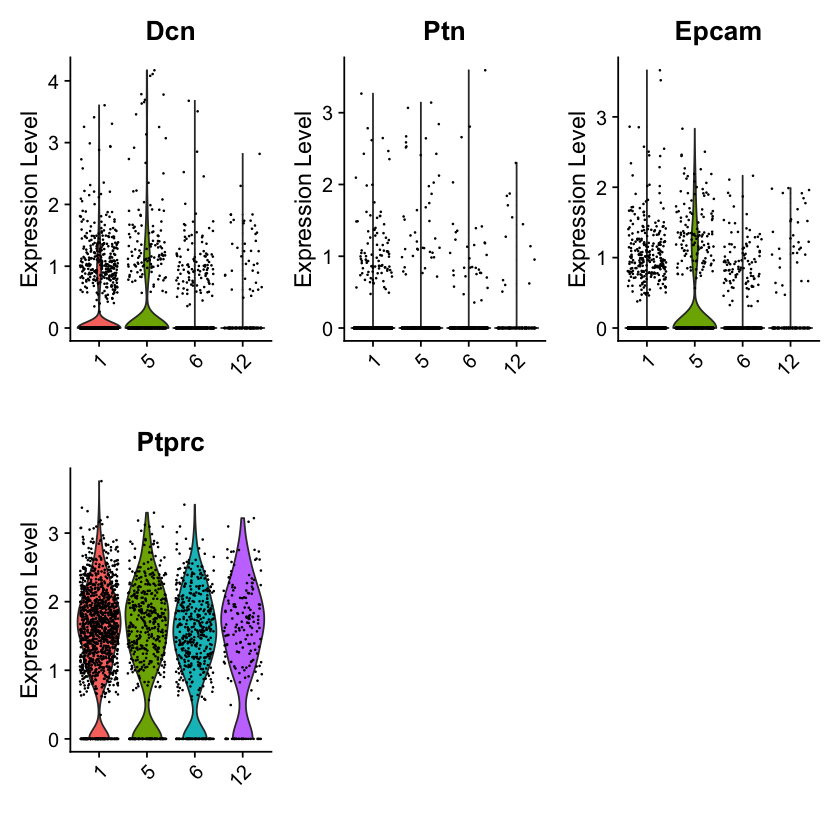

[1] "cocultAKMacFib"


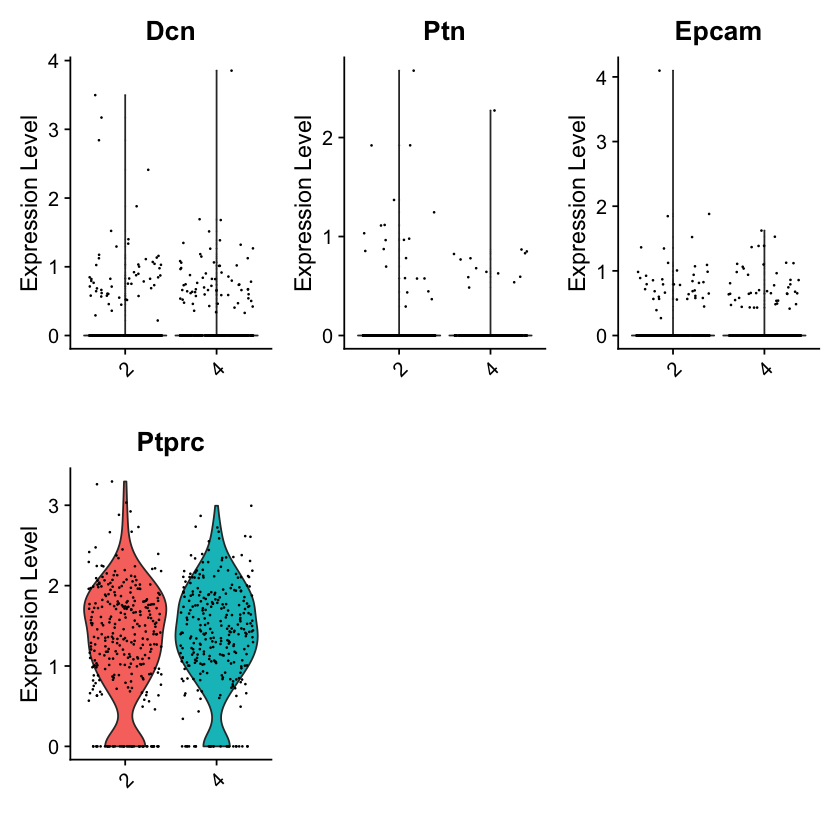

[1] "cocultAKPMacFib"
[1] "cocultMacFib"


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Epcam”


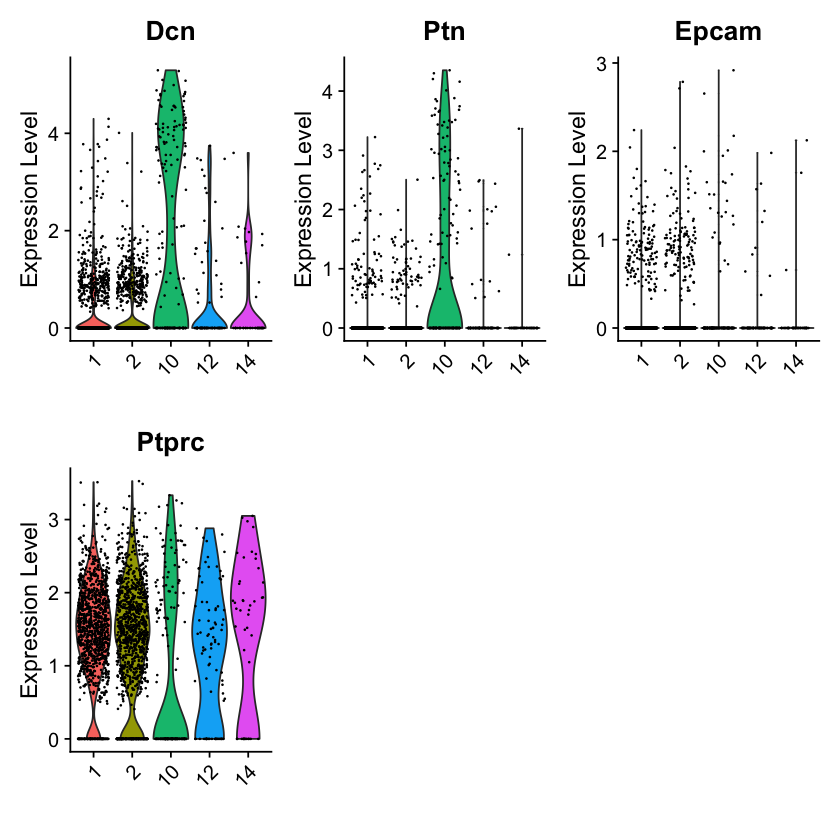

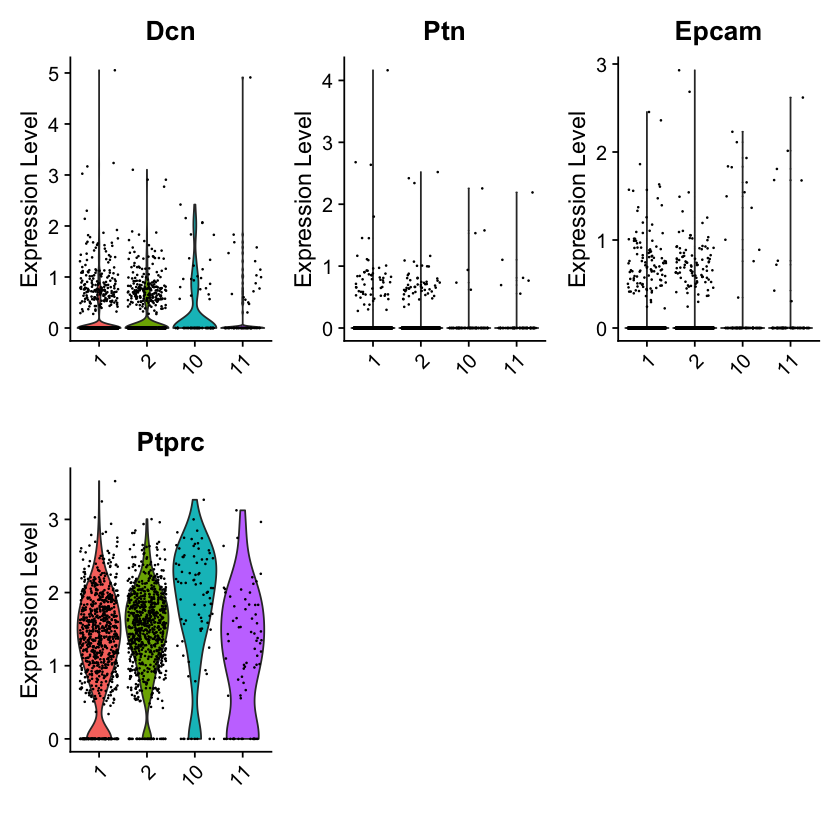

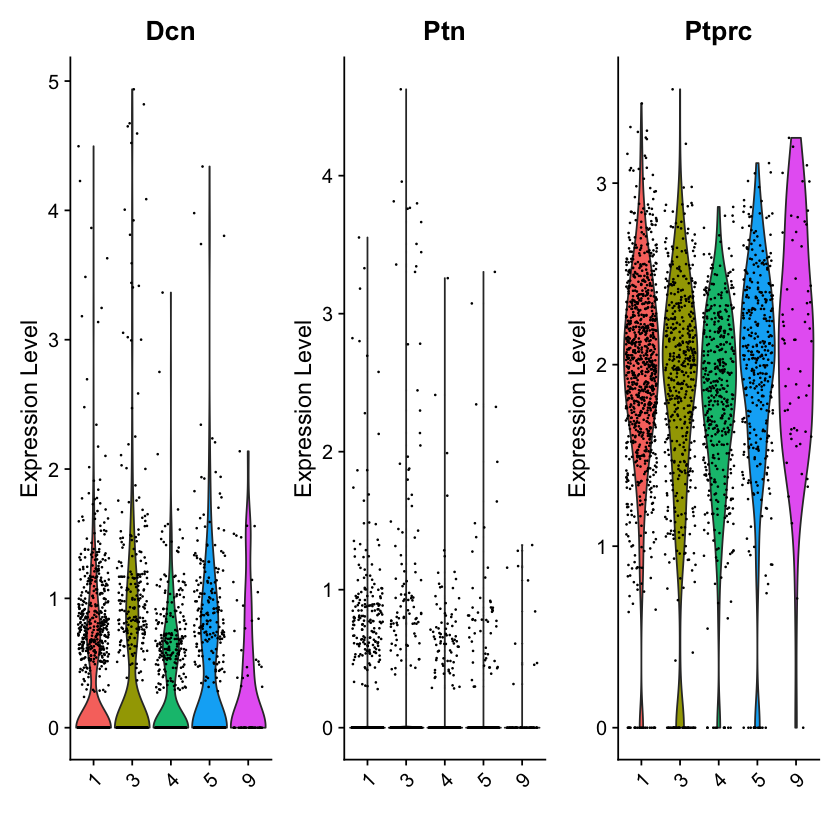

In [18]:
for (i in 1:length(INTmac_list)) {
    print(INTmac_list[[i]]@project.name)
    INTmac_list[[i]]@active.assay <- "RNA"
    print(VlnPlot(INTmac_list[[i]], 
                    features = c(fib_markers, epi_markers, mac_markers),
                    ncol = 3, assay = "RNA", group.by = "seurat_clusters", 
                    stack = FALSE) &
        xlab(""))
}

[1] "cocultWTMac"
An object of class Seurat 
35568 features across 1088 samples within 2 assays 
Active assay: RNA (18274 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn”


Error : Feature 2 (Dcn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Ptn”


Error : Feature 2 (Ptn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn, Ptn”


Error : Feature 1 (Dcn) not found.
[1] "cocultAMac"
An object of class Seurat 
36612 features across 1638 samples within 2 assays 
Active assay: RNA (18819 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn”


Error : Feature 2 (Dcn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Ptn”


Error : Feature 2 (Ptn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn, Ptn”


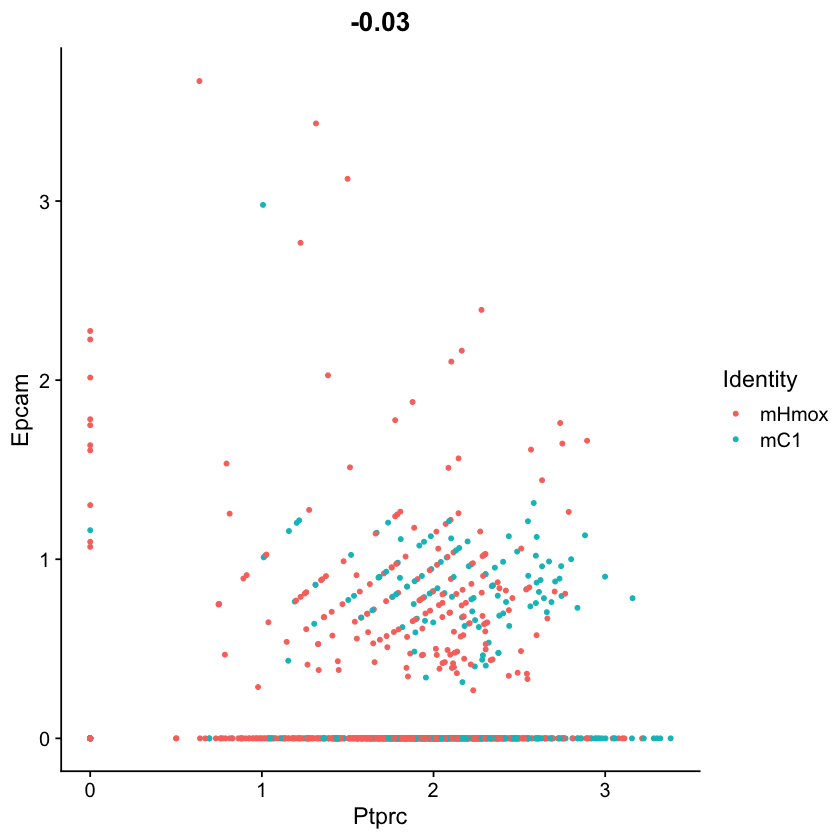

Error : Feature 1 (Dcn) not found.
[1] "cocultAKMac"
An object of class Seurat 
35874 features across 1528 samples within 2 assays 
Active assay: RNA (18565 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn”


Error : Feature 2 (Dcn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Ptn”


Error : Feature 2 (Ptn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn, Ptn”


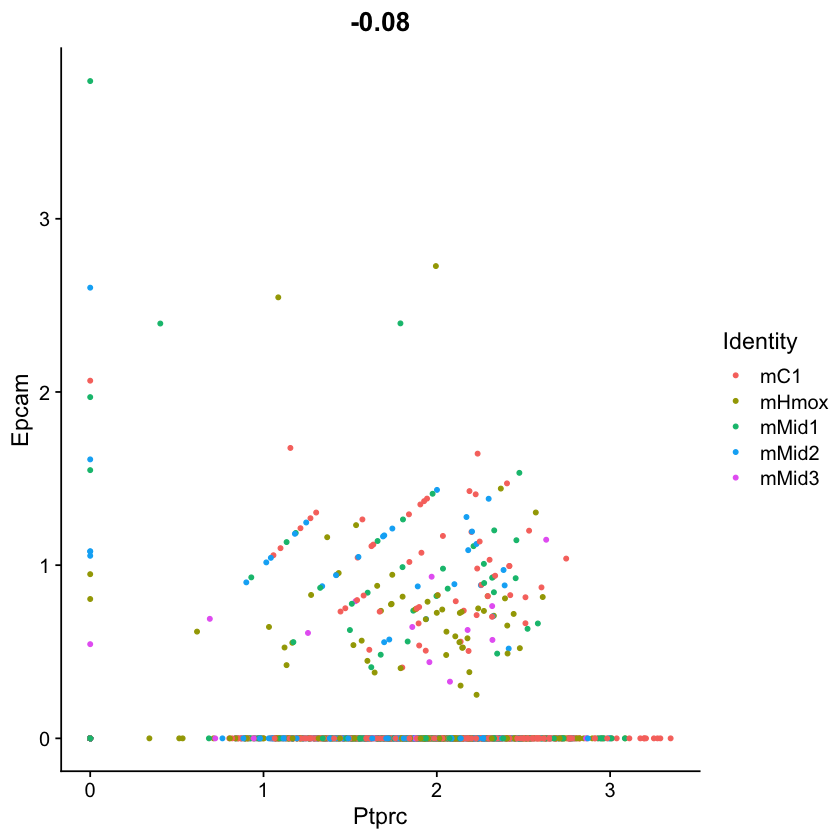

Error : Feature 1 (Dcn) not found.
[1] "cocultAKPMac_REPLICATE"
An object of class Seurat 
38819 features across 1613 samples within 2 assays 
Active assay: RNA (20601 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn”


Error : Feature 2 (Dcn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Ptn”


Error : Feature 2 (Ptn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn, Ptn”


Error : Feature 1 (Dcn) not found.
[1] "monoMac"
An object of class Seurat 
29693 features across 2665 samples within 2 assays 
Active assay: RNA (15155 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Epcam”


Error : Feature 2 (Epcam) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn”


Error : Feature 2 (Dcn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Ptn”


Error : Feature 2 (Ptn) not found.


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Dcn, Ptn”


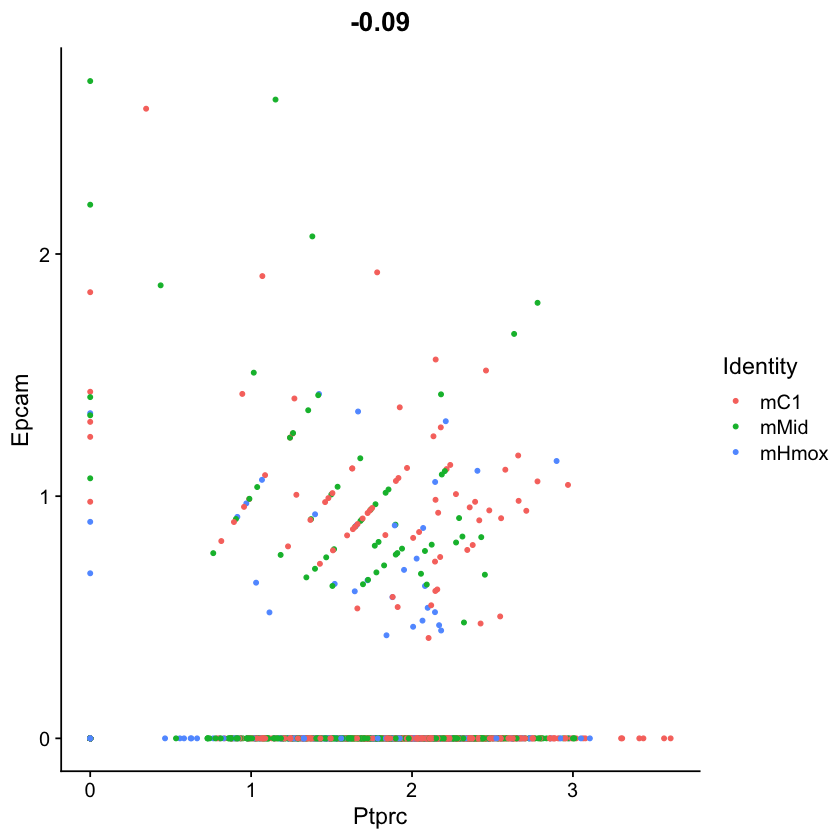

Error : Feature 1 (Dcn) not found.
[1] "cocultWTMacFib"
An object of class Seurat 
43836 features across 2345 samples within 2 assays 
Active assay: RNA (22372 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


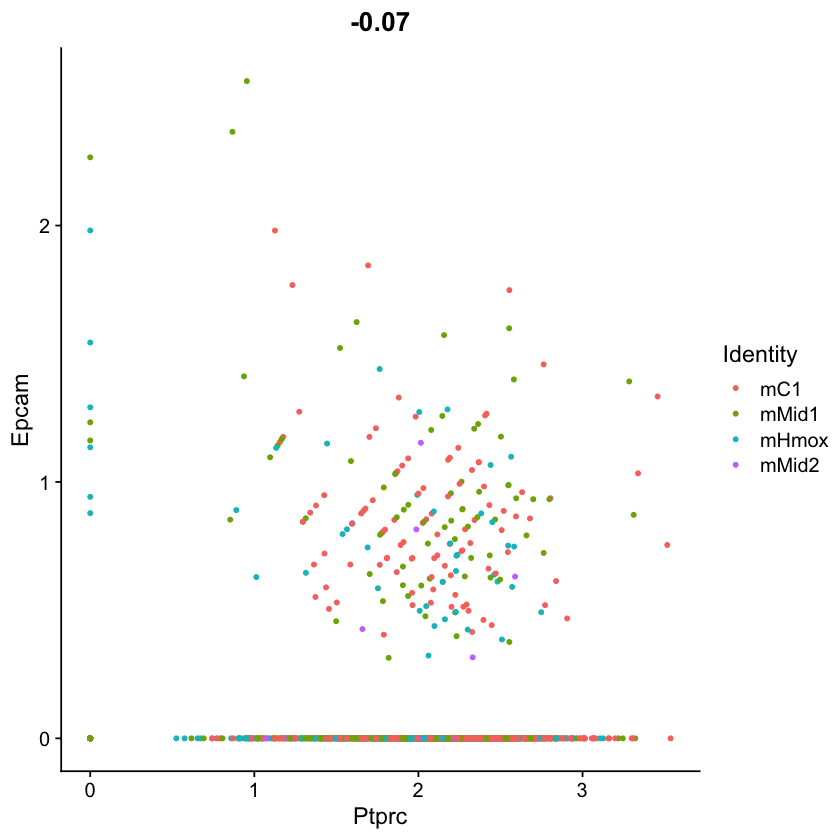

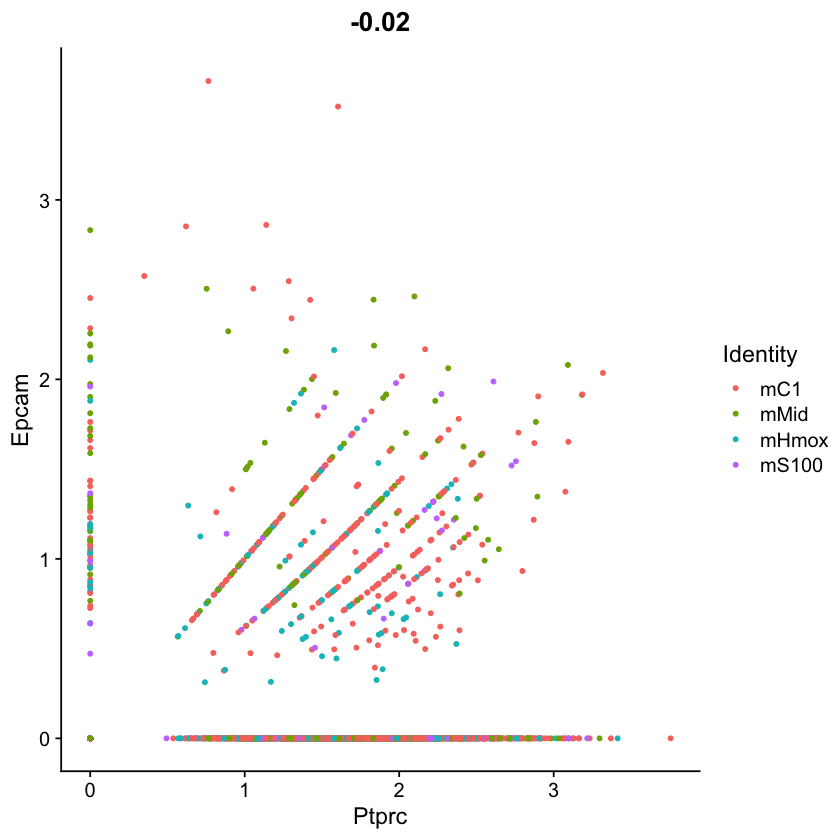

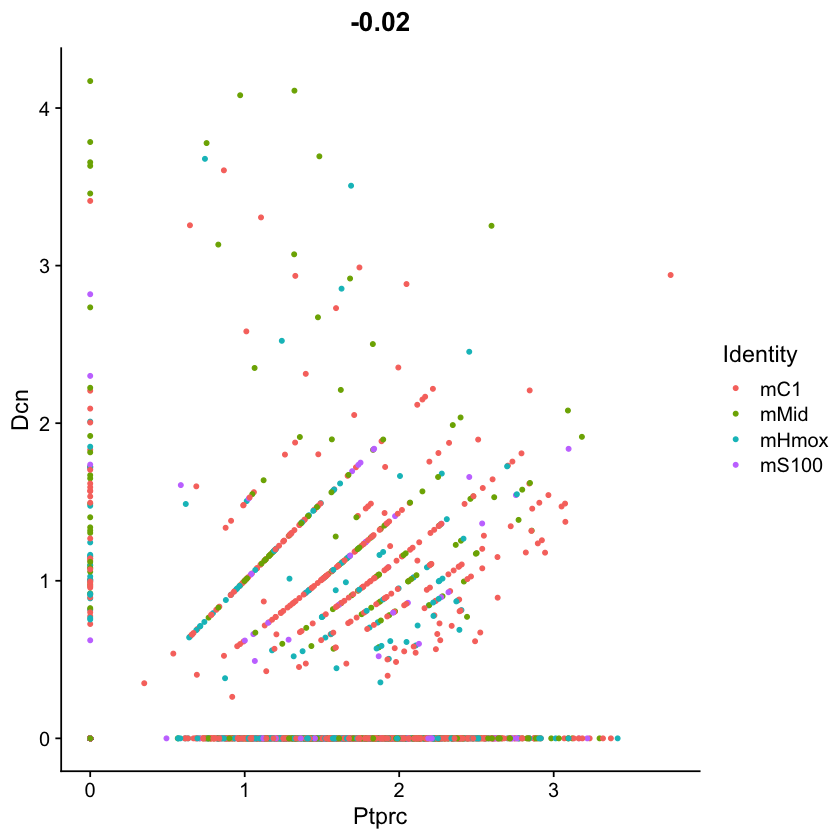

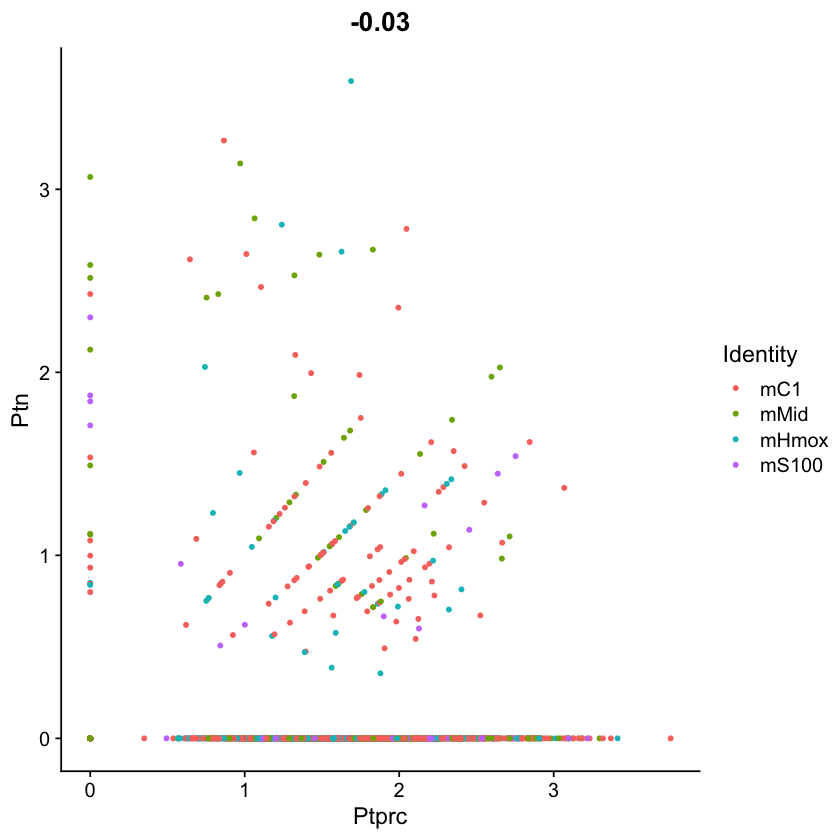

[1] "cocultAMacFib"
An object of class Seurat 
38368 features across 617 samples within 2 assays 
Active assay: RNA (19651 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


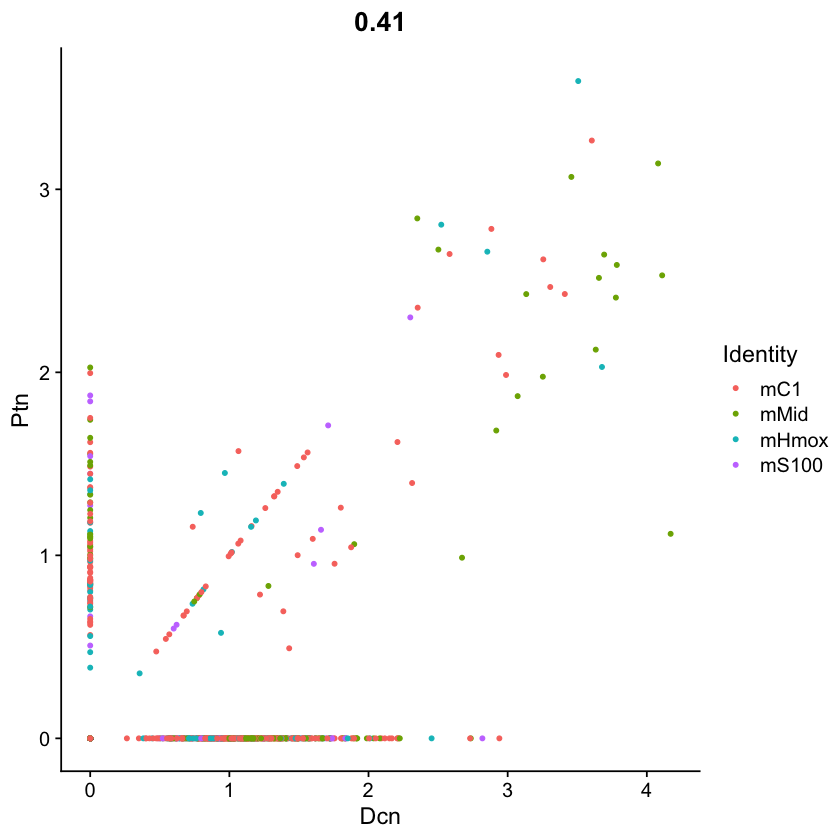

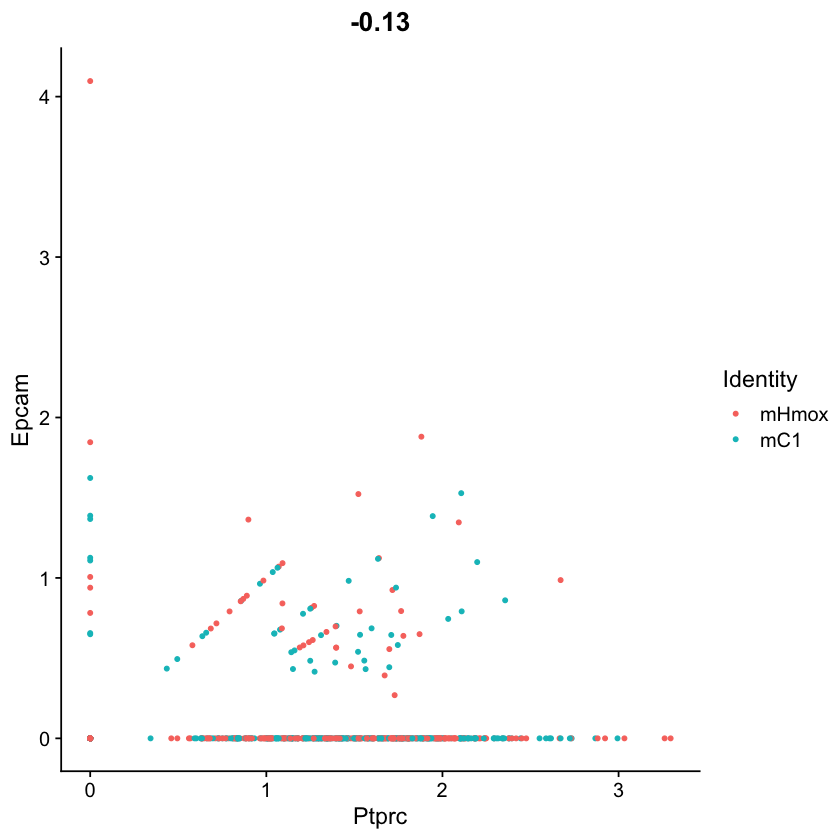

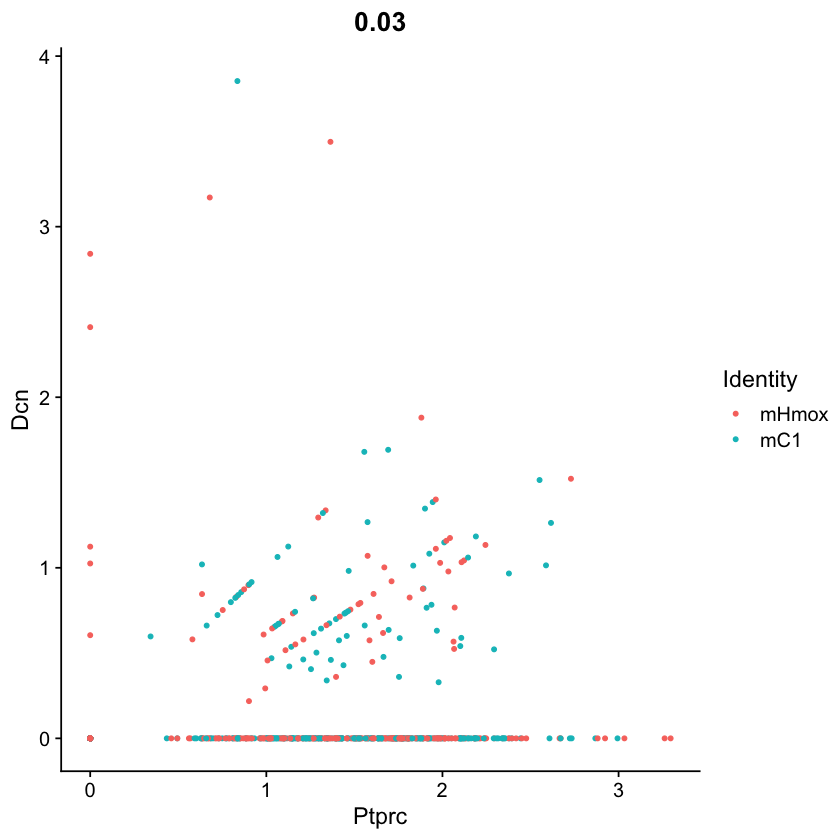

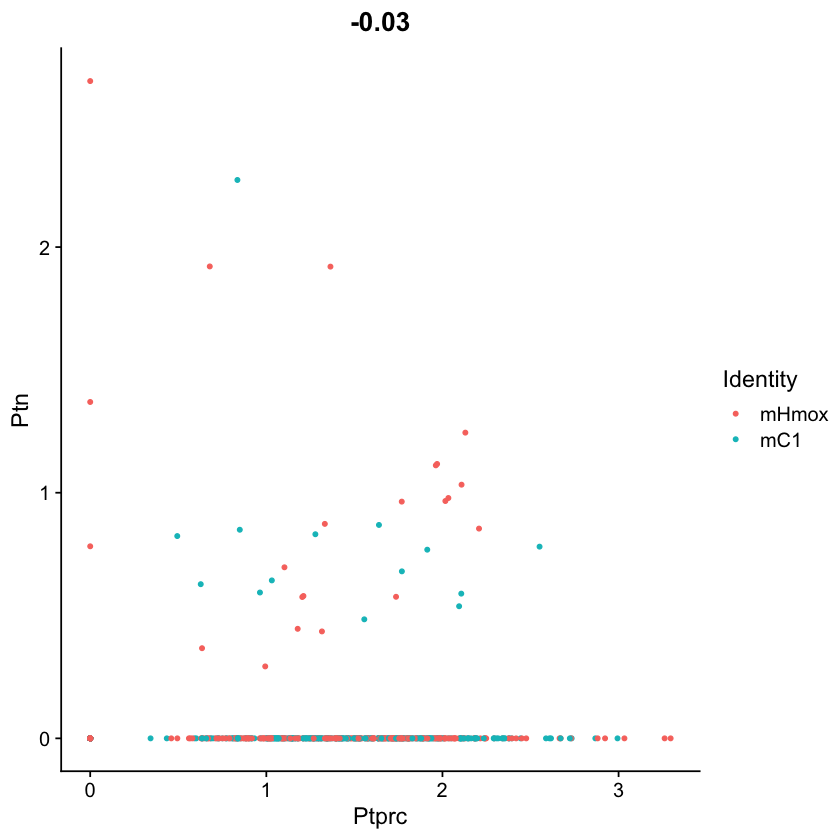

[1] "cocultAKMacFib"
An object of class Seurat 
43731 features across 2399 samples within 2 assays 
Active assay: RNA (22285 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


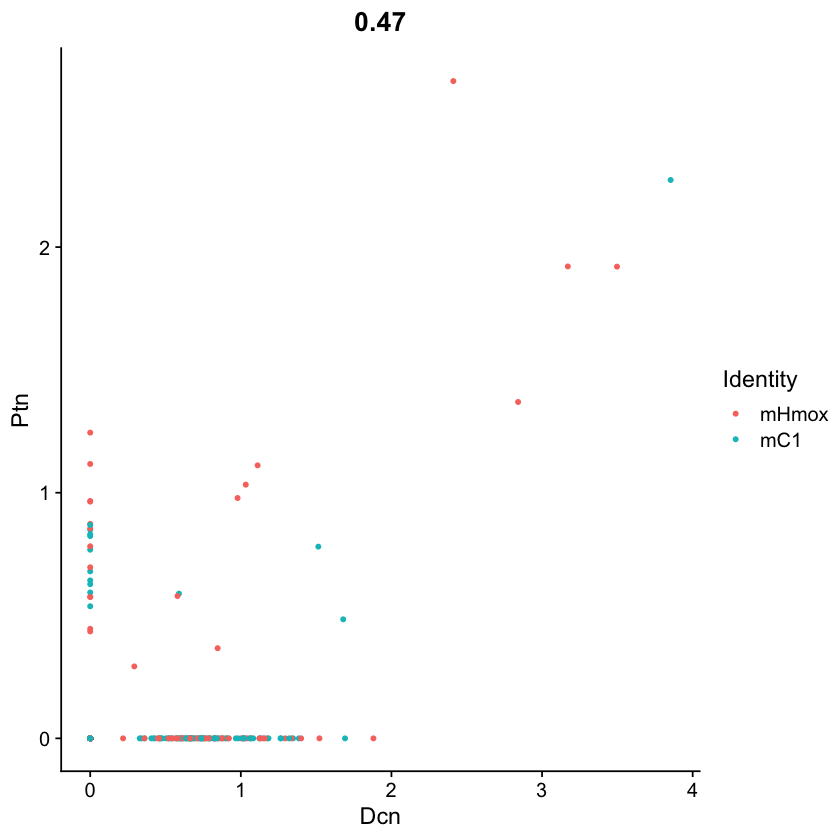

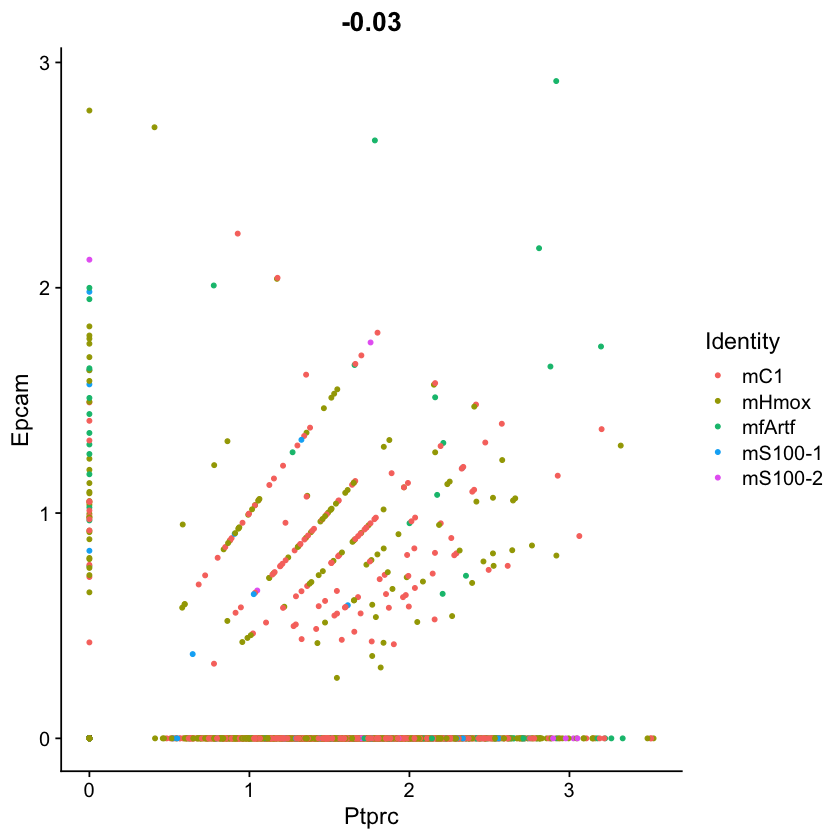

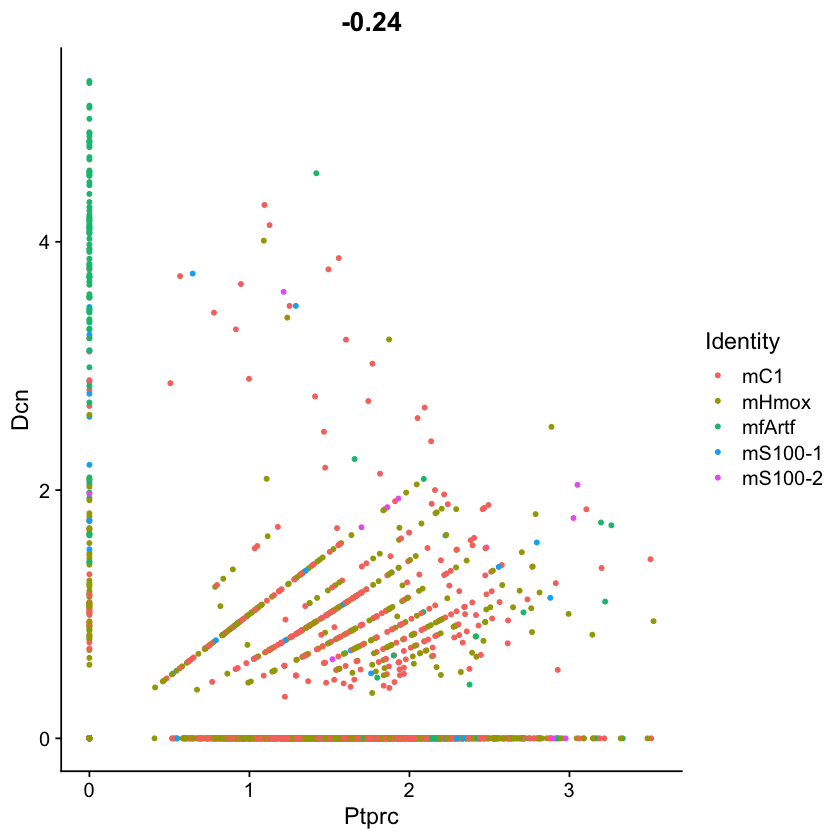

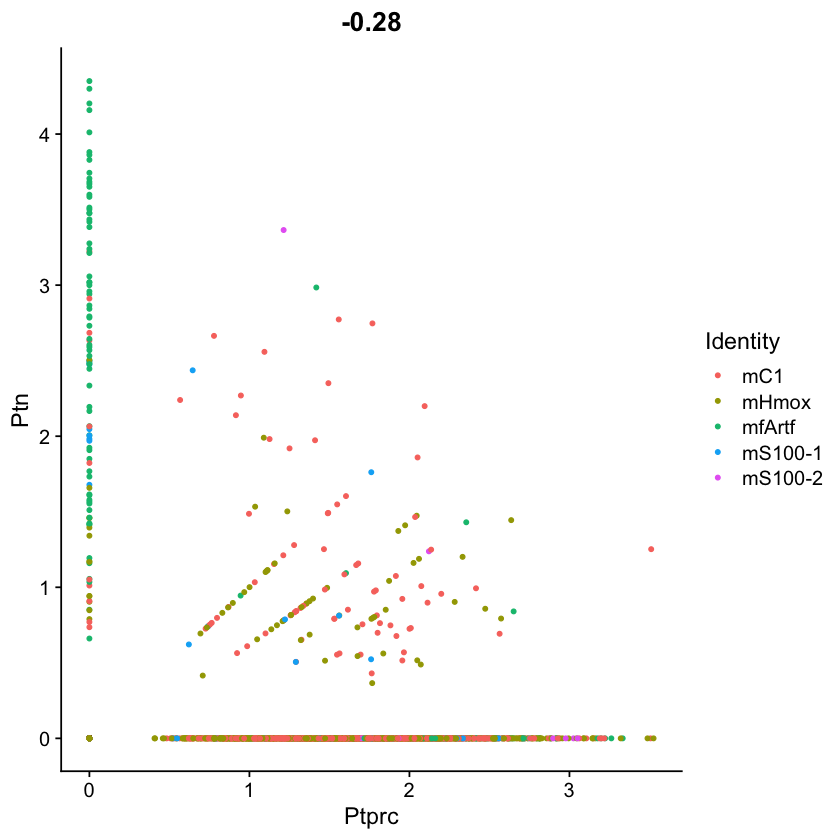

[1] "cocultAKPMacFib"
An object of class Seurat 
43917 features across 1731 samples within 2 assays 
Active assay: RNA (22475 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


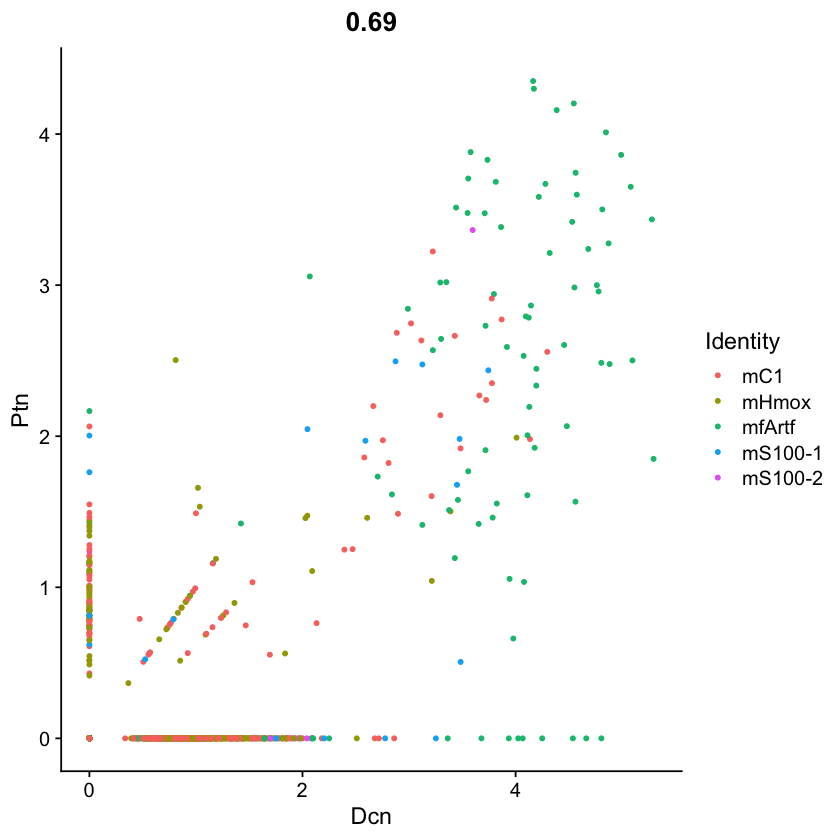

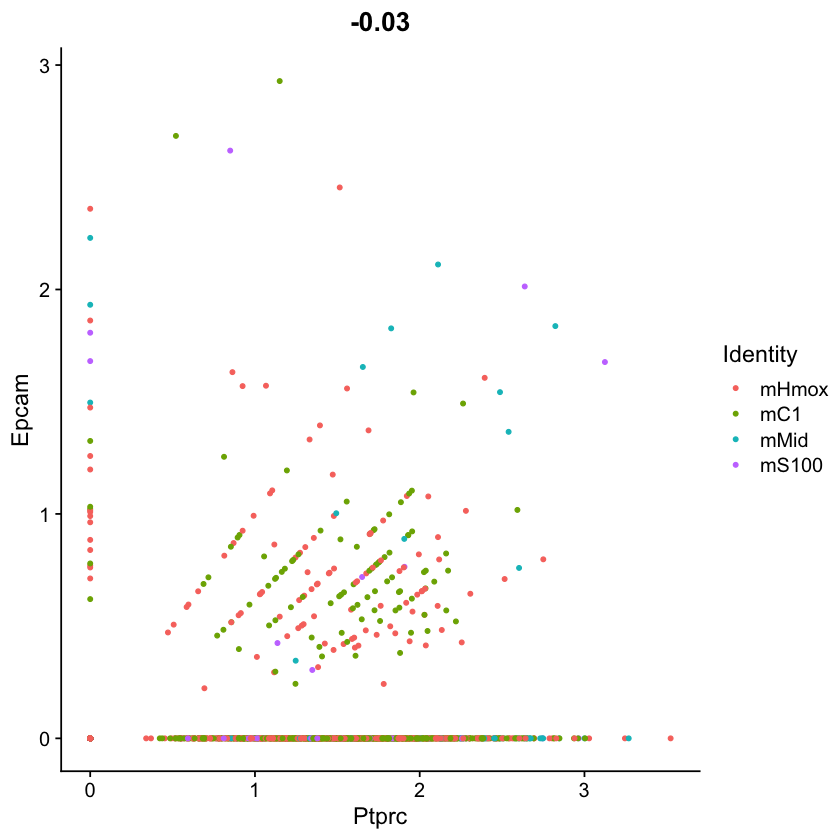

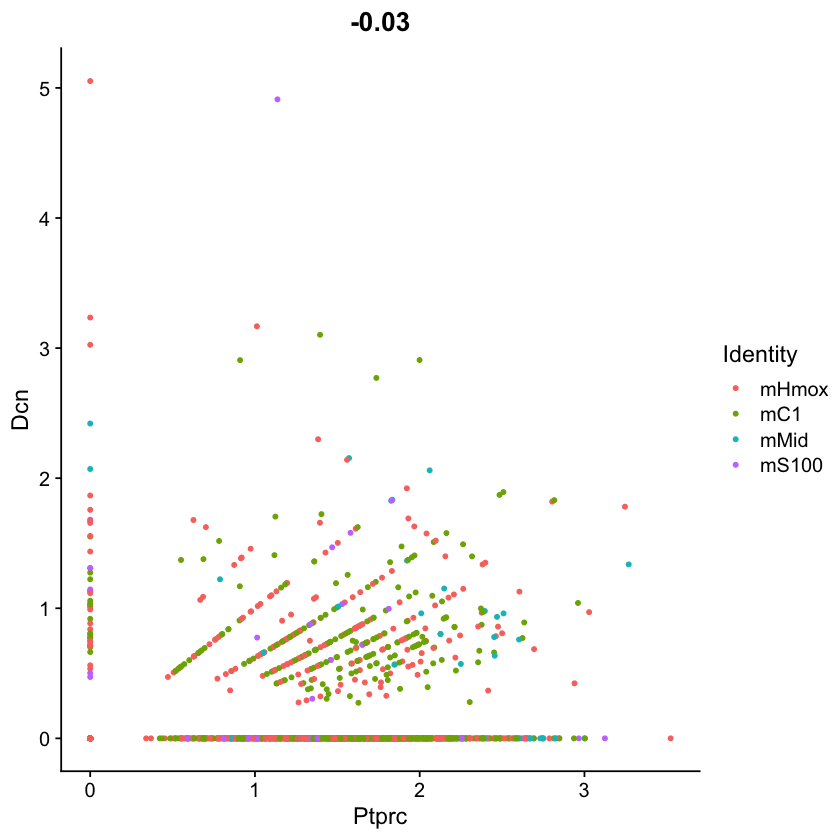

[1] "cocultMacFib"
An object of class Seurat 
39571 features across 2226 samples within 2 assays 
Active assay: RNA (20293 features, 10000 variable features)
 1 other assay present: SCT
 3 dimensional reductions calculated: pca, umap, phate


Warning message in FetchData.Seurat(object = object, vars = c(feature1, feature2, :
“The following requested variables were not found: Epcam”


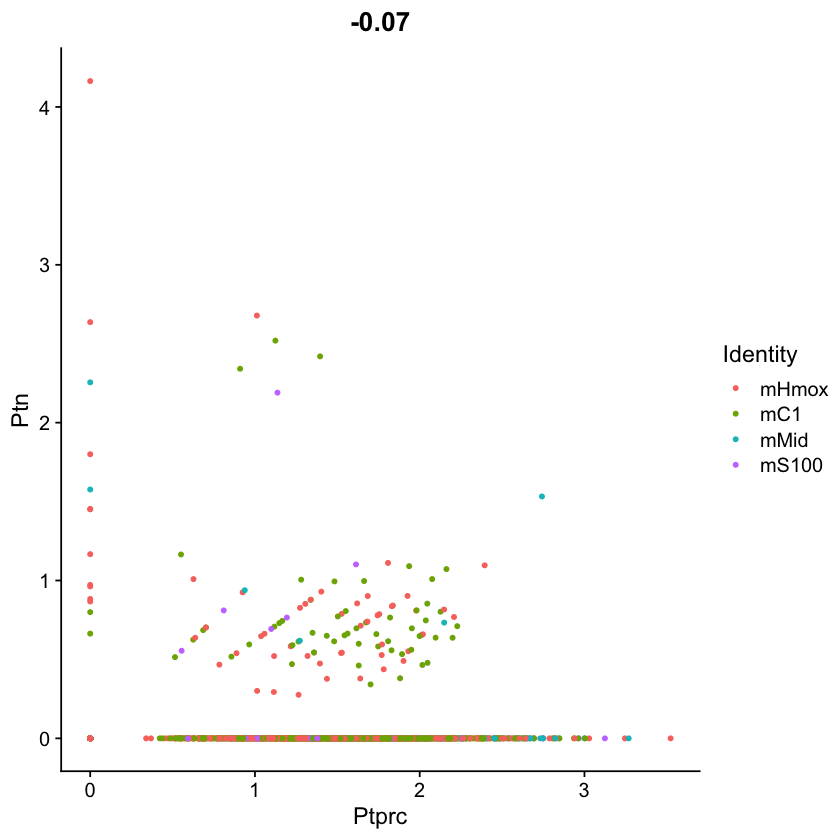

Error : Feature 2 (Epcam) not found.


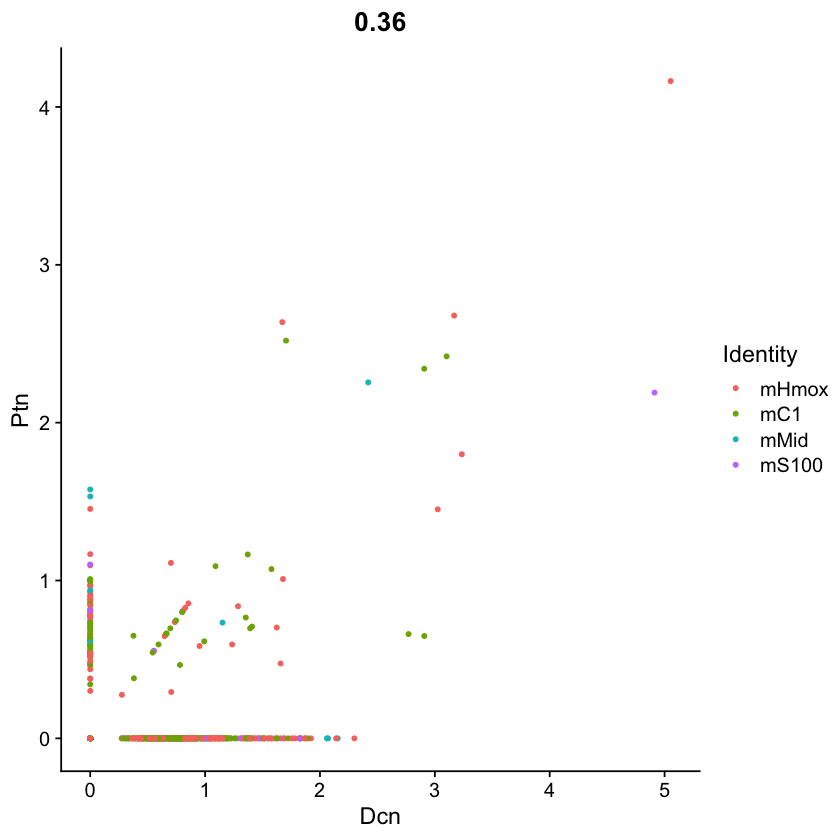

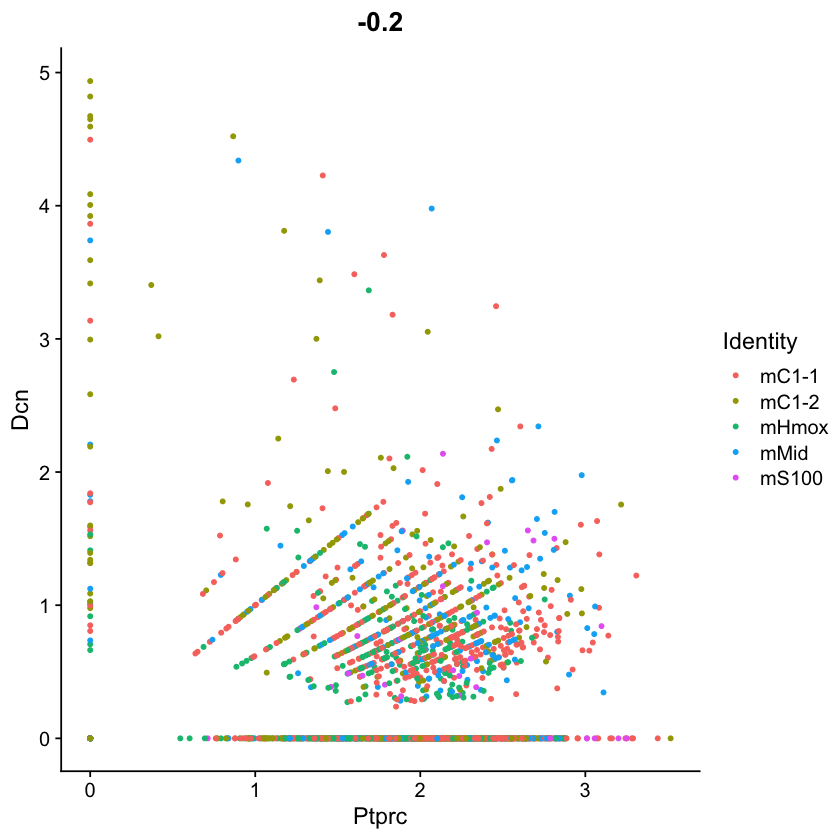

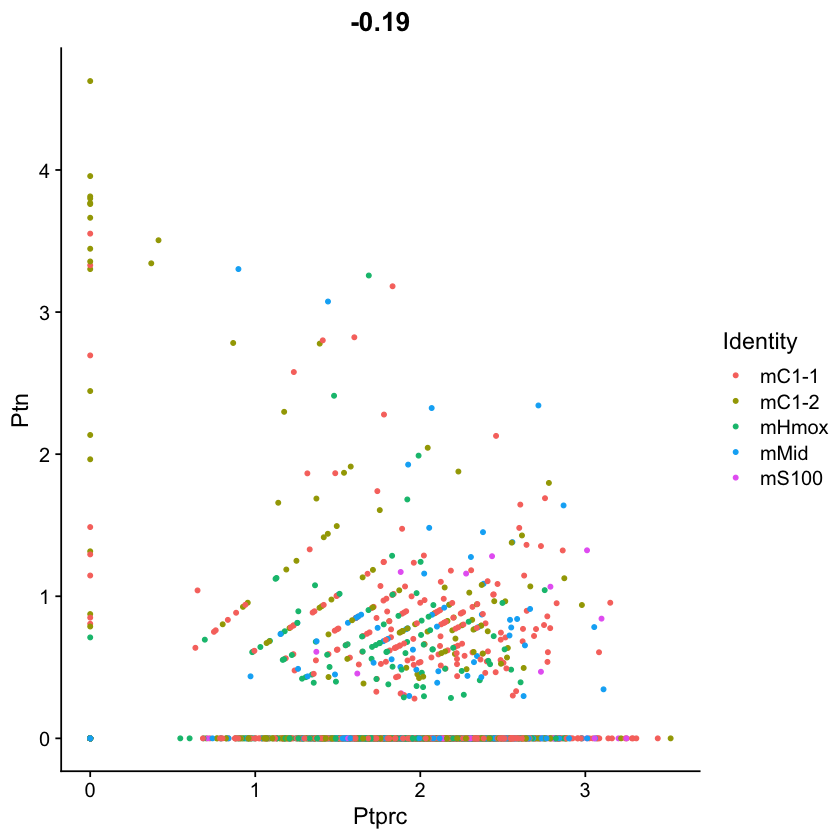

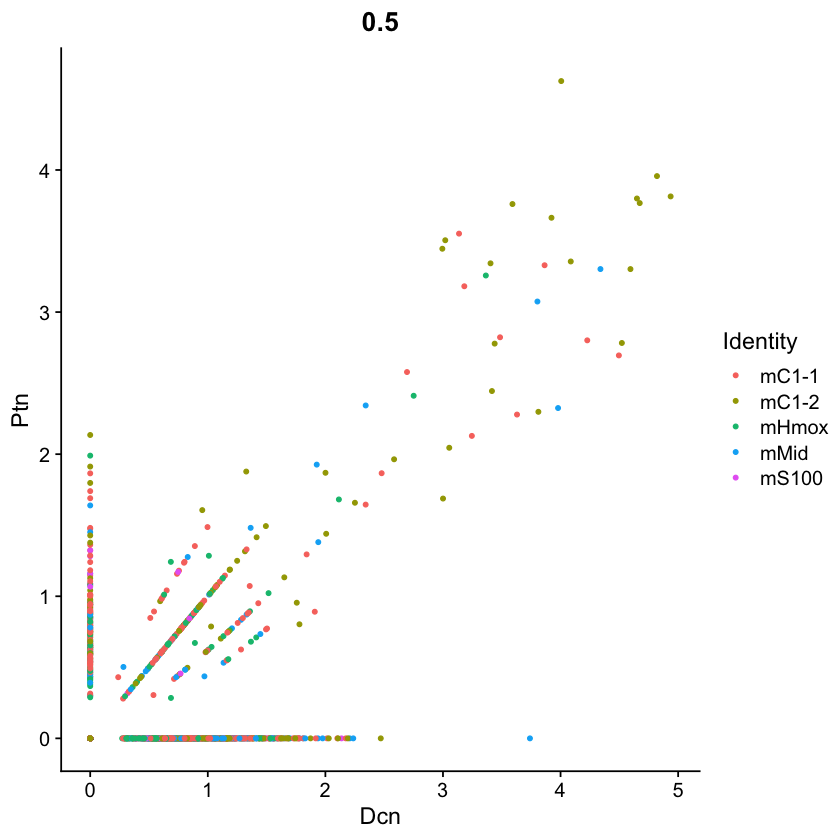

In [28]:
for (i in 1:length(INTmac_list)) {
    print(INTmac_list[[i]]@project.name)
    print(INTmac_list[[i]])
    try(print(FeatureScatter(INTmac_list[[i]], feature1 = "Ptprc", feature2 = "Epcam")))
    try(print(FeatureScatter(INTmac_list[[i]], feature1 = "Ptprc", feature2 = "Dcn")))
    try(print(FeatureScatter(INTmac_list[[i]], feature1 = "Ptprc", feature2 = "Ptn")))
    try(print(FeatureScatter(INTmac_list[[i]], feature1 = "Dcn", feature2 = "Ptn")))
}

In [35]:
for (i in 1:length(INTmac_list)) {
    print(INTmac_list[[i]]@project.name)
    print(dim(INTmac_list[[i]]))
    print(dim(subset(INTmac_list[[i]],
                    Ptprc>0
                    )))
    # try(print(dim(subset(INTmac_list[[i]],
    #                 Ptprc>0 & Epcam<0.2 & Ptn<0.2 & Dcn<0.2
    #                 ))))
    # print(dim(subset(INTmac_list[[i]],
    #                 Ptprc>0 & Epcam==0 & Ptn==0
    #                 )))
    # print(dim(subset(INTmac_list[[i]],
    #                 Ptprc>0 & Epcam==0 & Dcn==0
    #                 )))
}

[1] "cocultWTMac"
[1] 18274  1088
[1] 18274  1039
[1] "cocultAMac"
[1] 18819  1638
[1] 18819  1560
[1] "cocultAKMac"
[1] 18565  1528
[1] 18565  1412
[1] "cocultAKPMac_REPLICATE"
[1] 20601  1613
[1] 20601  1565
[1] "monoMac"
[1] 15155  2665
[1] 15155  2568
[1] "cocultWTMacFib"
[1] 22372  2345
[1] 22372  2036
[1] "cocultAMacFib"
[1] 19651   617
[1] 19651   547
[1] "cocultAKMacFib"
[1] 22285  2399
[1] 22285  2006
[1] "cocultAKPMacFib"
[1] 22475  1731
[1] 22475  1558
[1] "cocultMacFib"
[1] 20293  2226
[1] 20293  2148


To try and handle missing gene expression in certain conditions, let's have multiple step with try()

Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Epcam' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Ptn' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Epcam' not found
Error in eval_tidy(expr = expr, data = data.subset) : 
  object 'Epcam' not found
Error in eval_tidy(expr = expr, da

Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


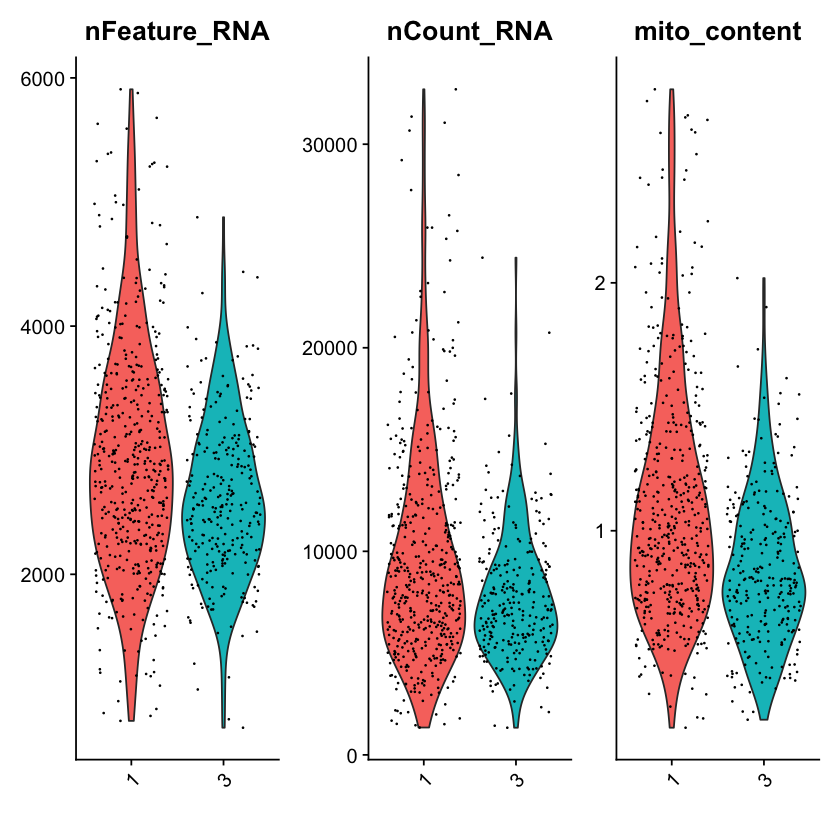

[1] "cocultAMac"
[1] 18819  1379


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


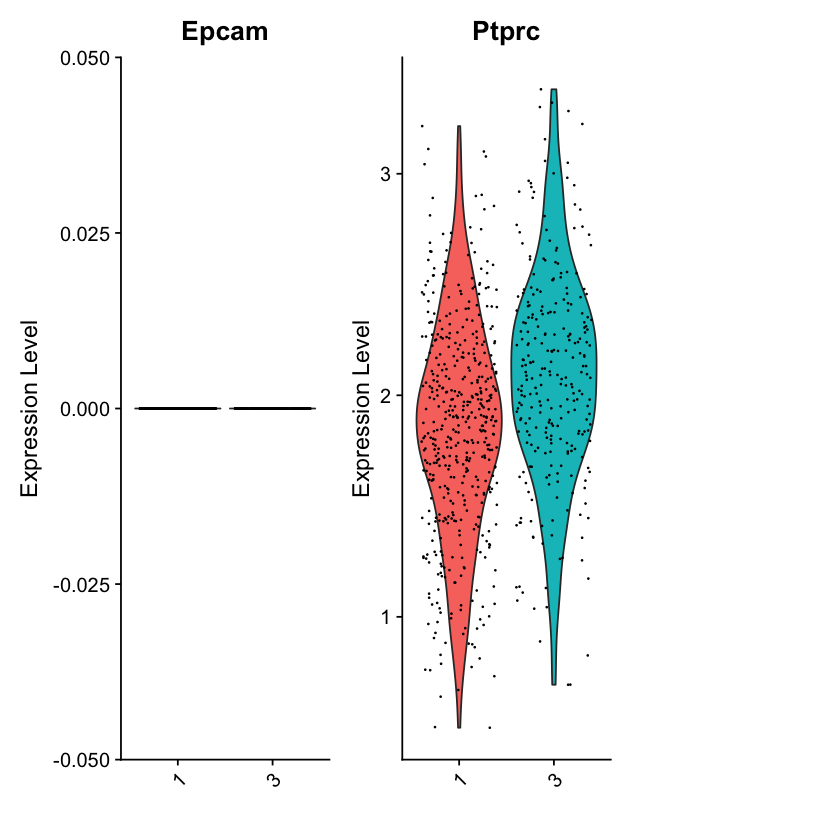

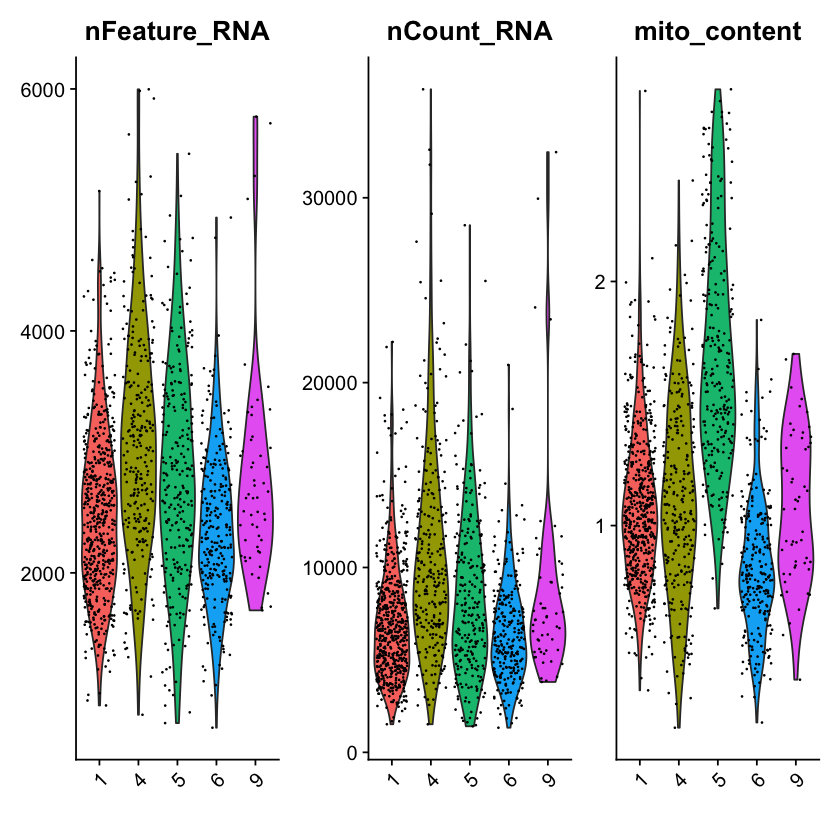

[1] "cocultAKMac"
[1] 18565  1259


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


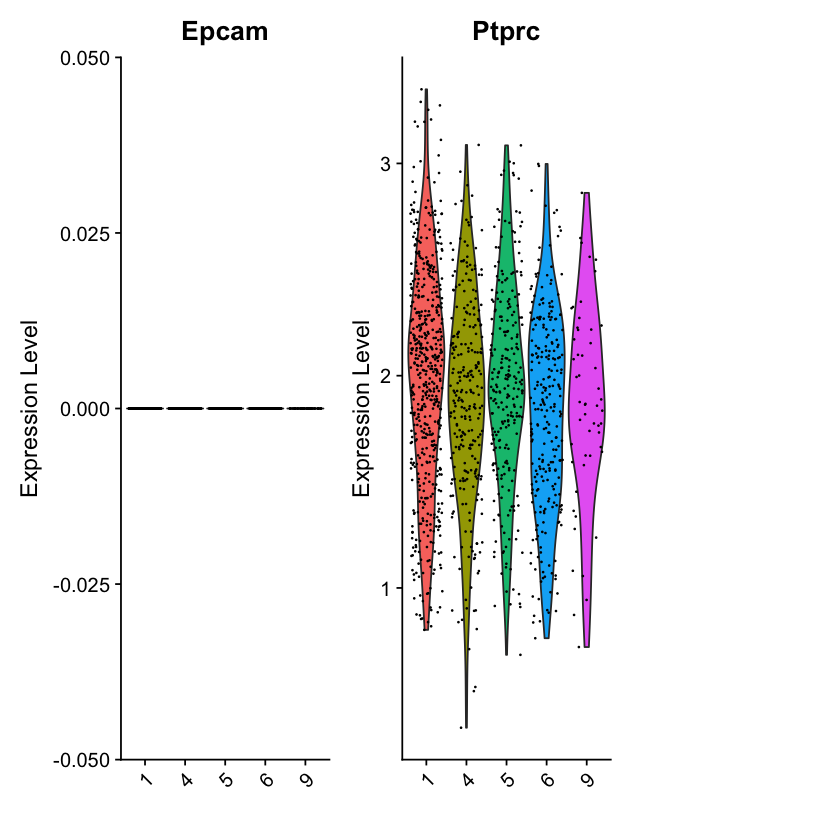

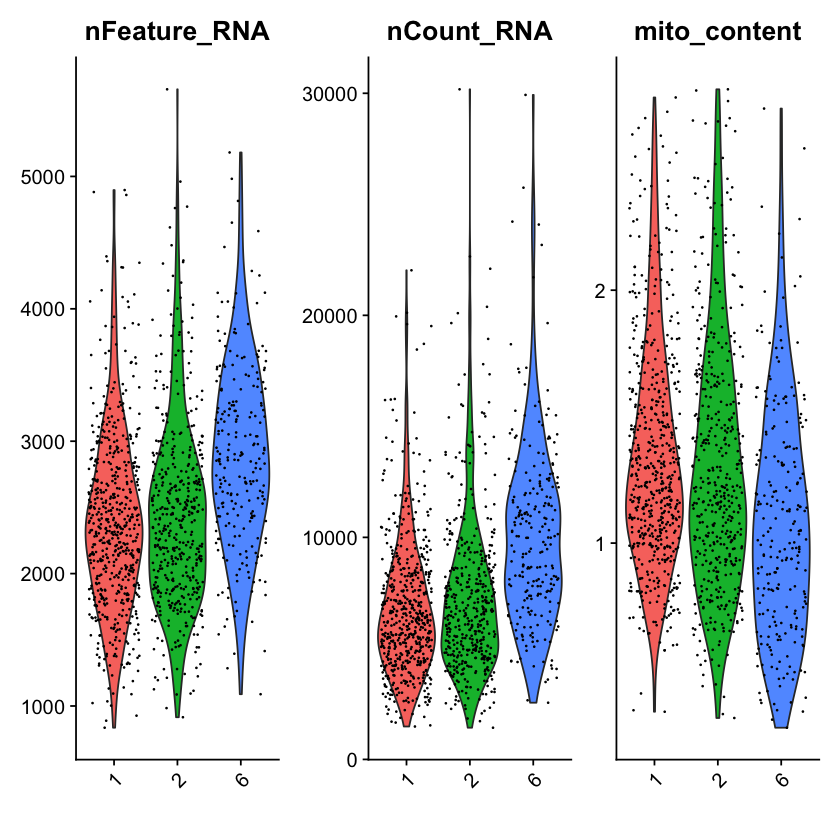

[1] "cocultAKPMac_REPLICATE"
[1] 20601  1352


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


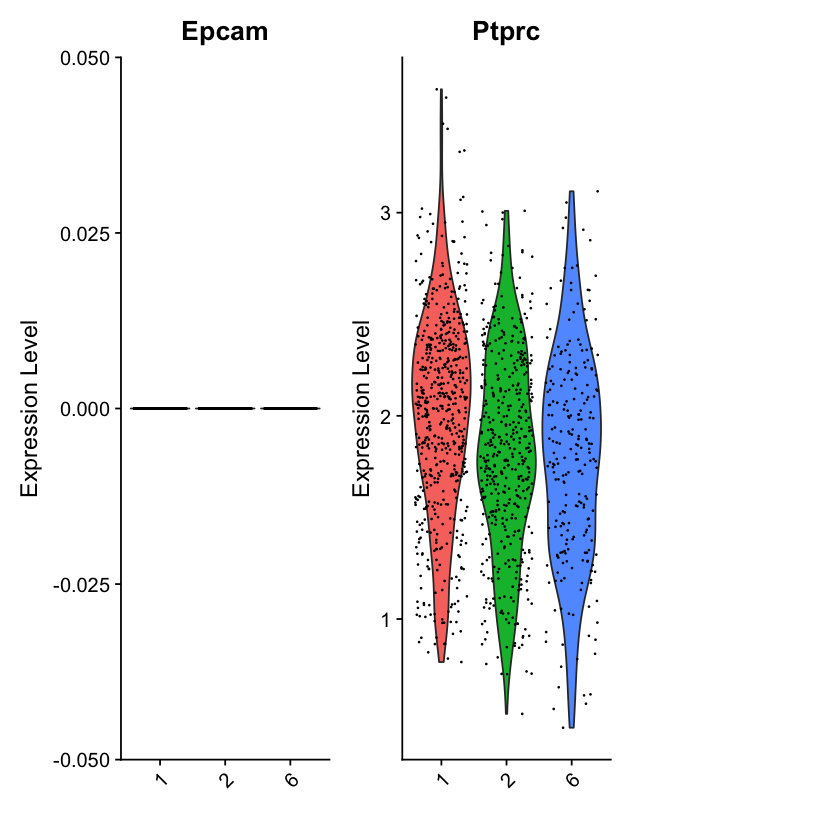

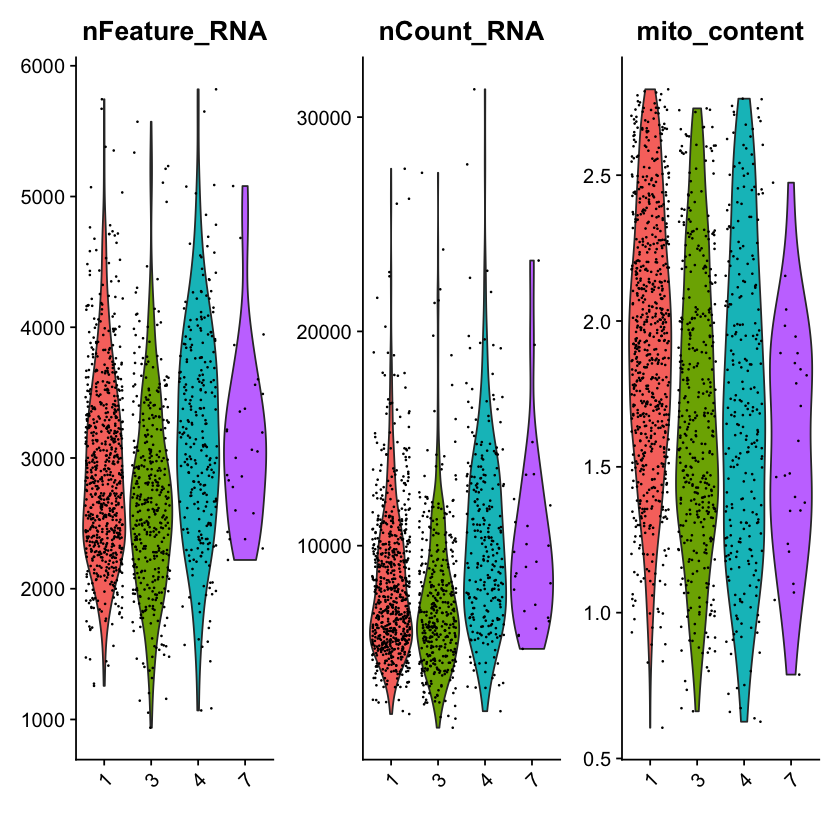

[1] "monoMac"
[1] 15155  2568


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Dcn, Ptn, Epcam”


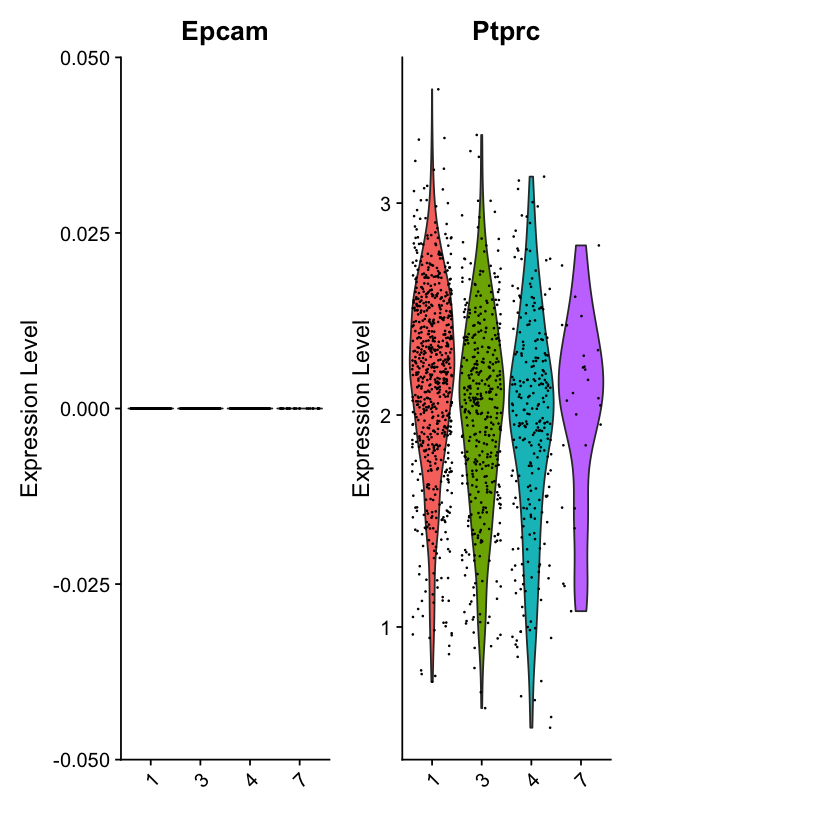

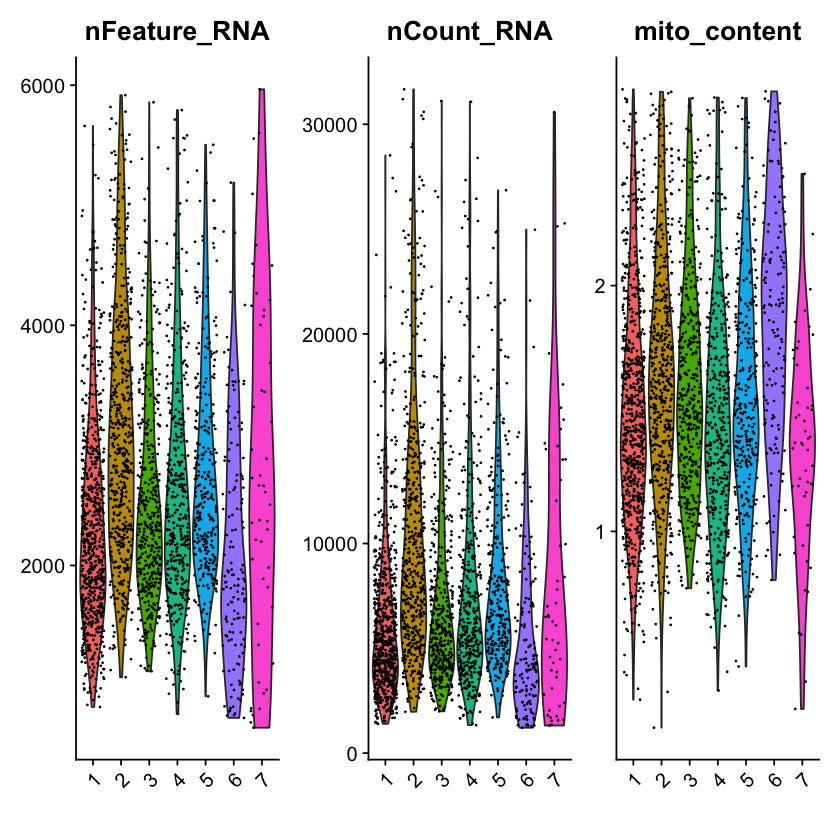

[1] "cocultWTMacFib"
[1] 22372  1092


Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Dcn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Ptn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


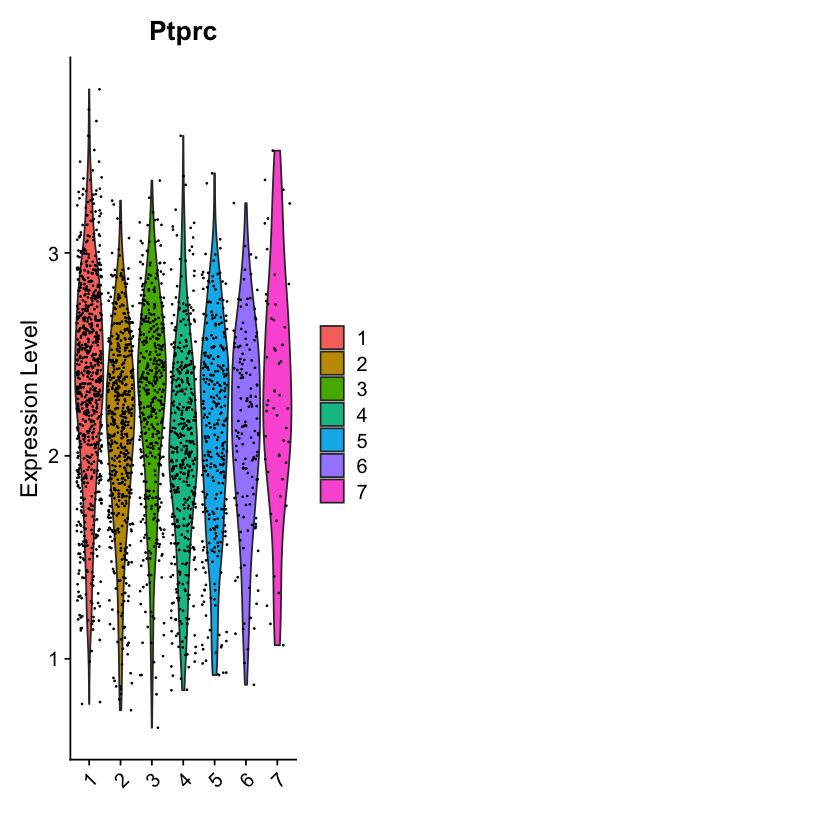

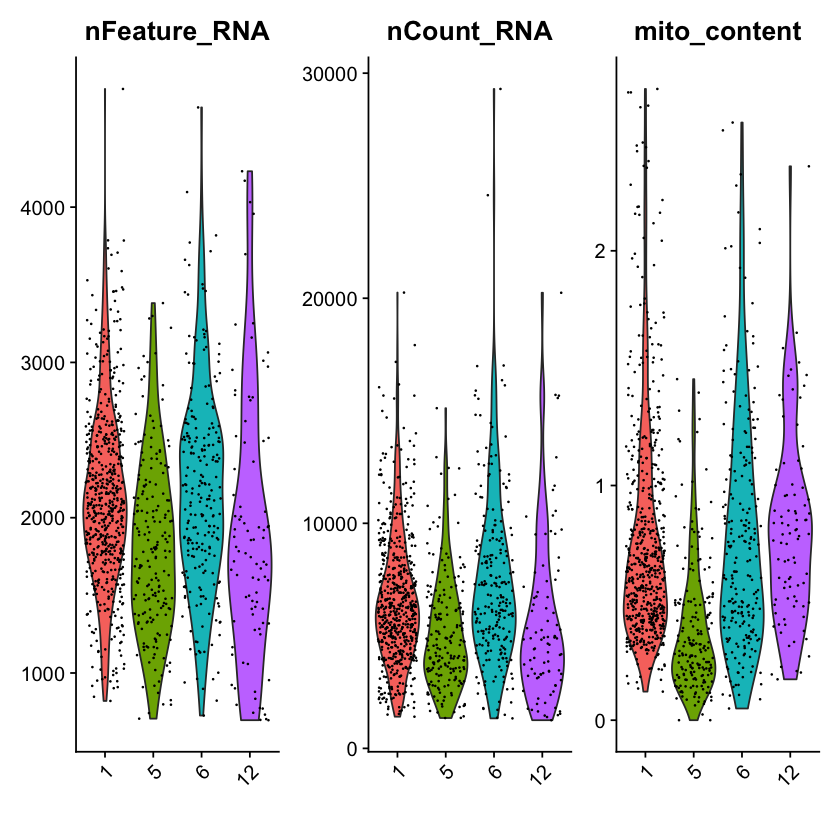

[1] "cocultAMacFib"
[1] 19651   351


Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Dcn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Ptn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


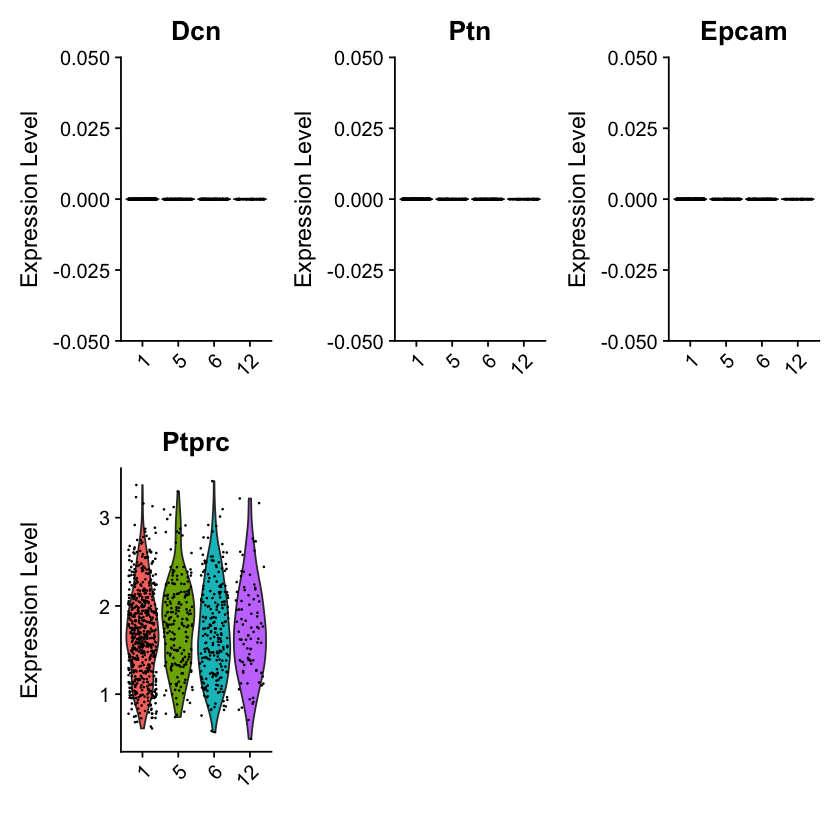

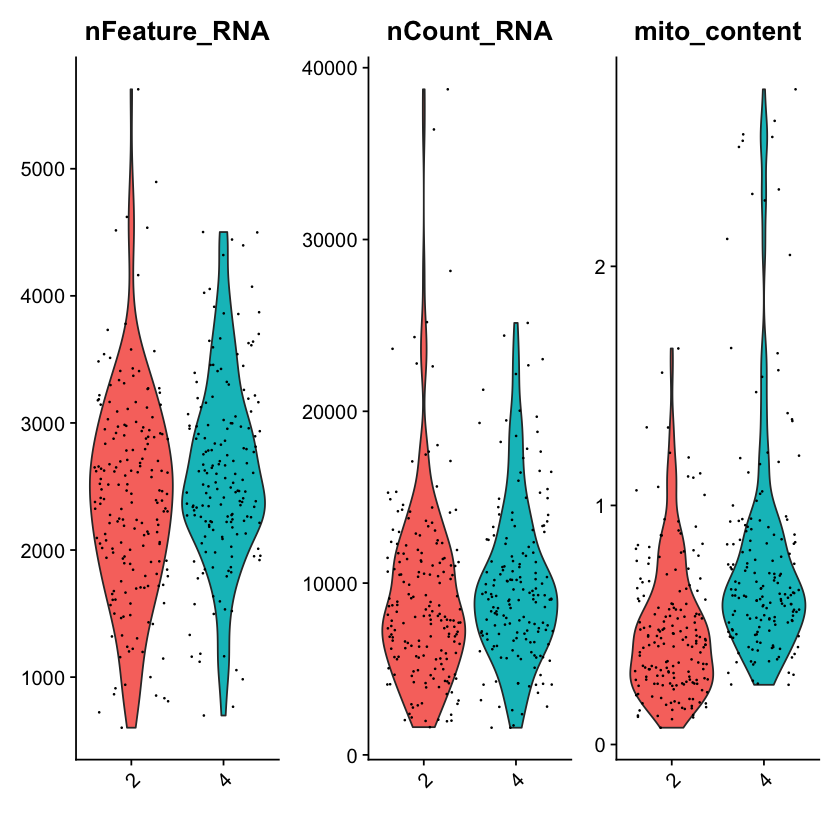

[1] "cocultAKMacFib"
[1] 22285  1189


Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Dcn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Ptn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


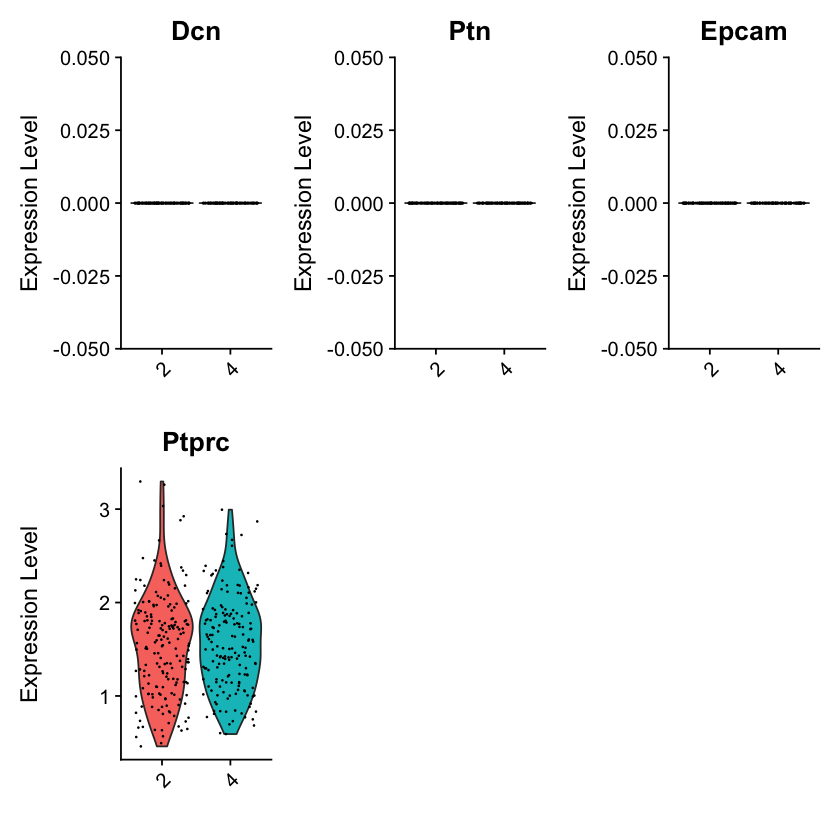

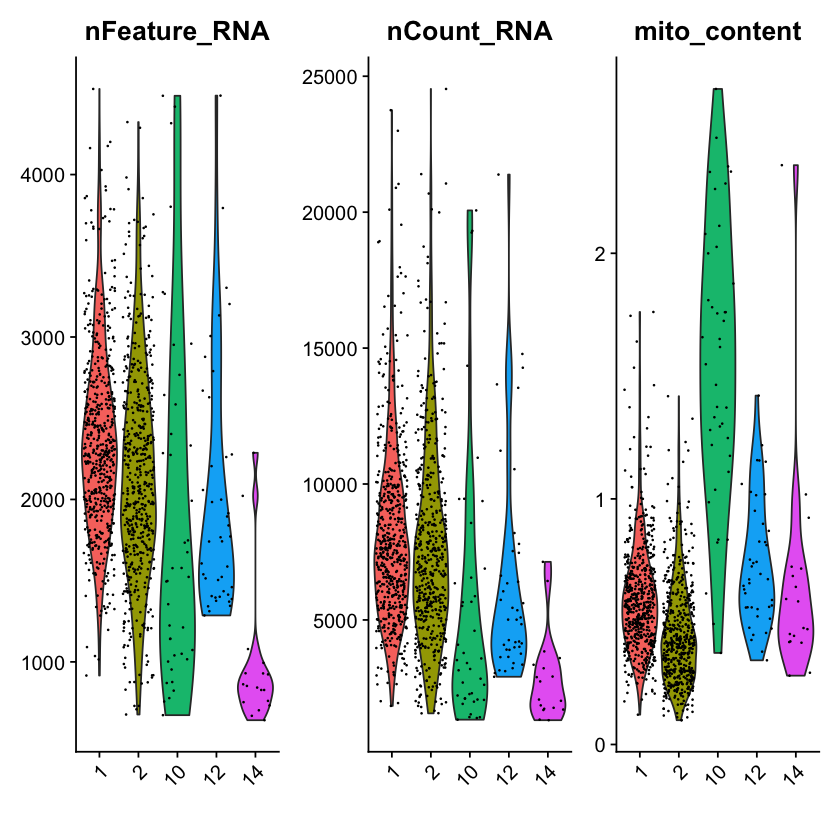

[1] "cocultAKPMacFib"
[1] 22475   926


Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Dcn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Ptn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Epcam.”


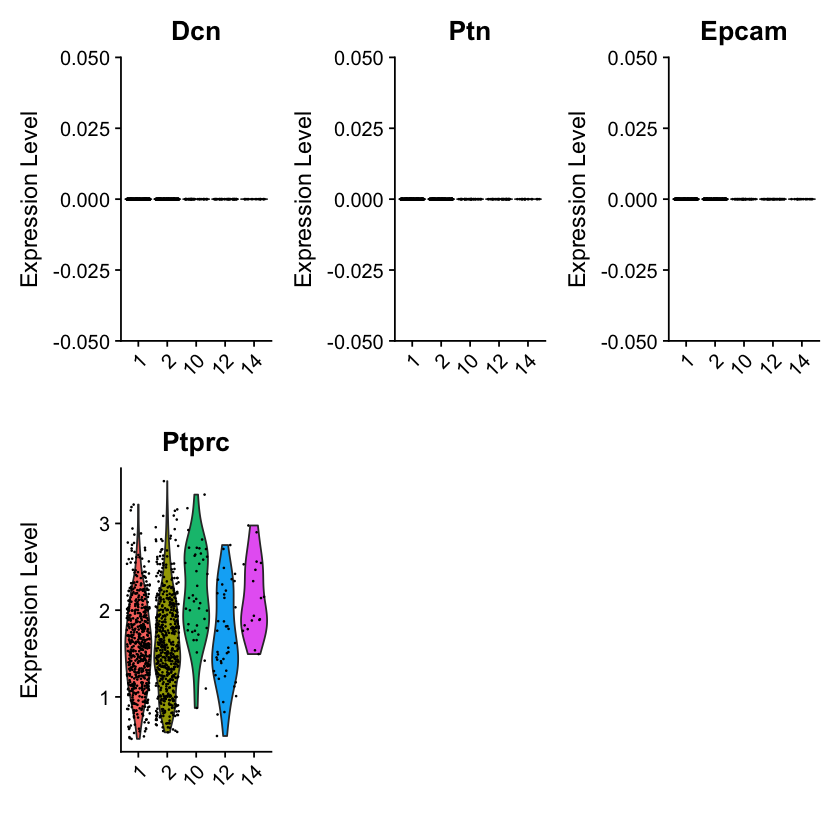

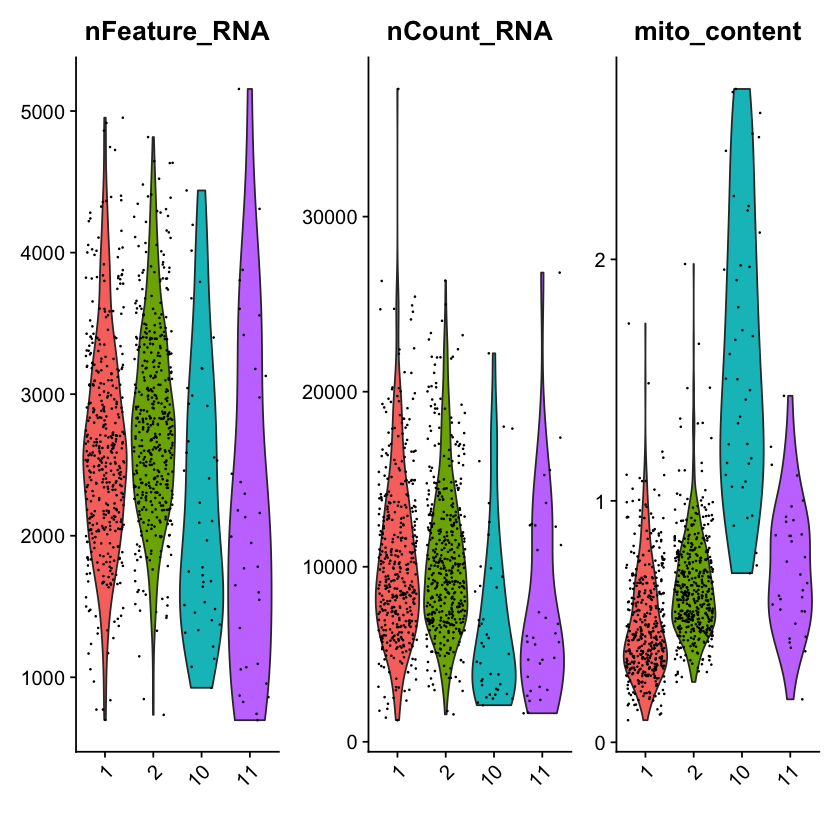

[1] "cocultMacFib"
[1] 20293   944


Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Epcam”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Dcn.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of Ptn.”


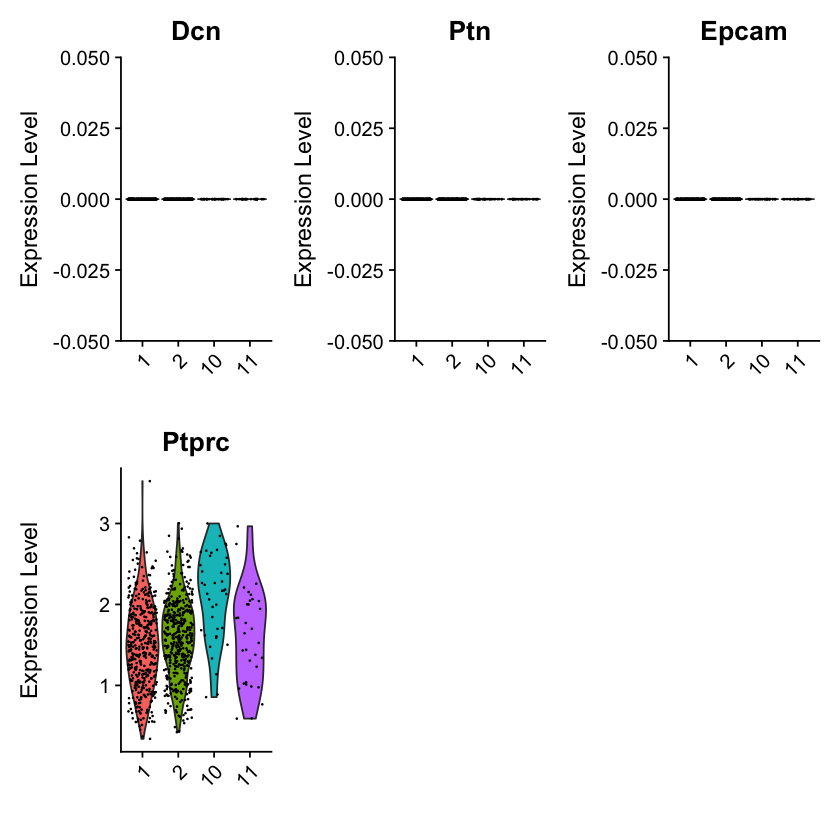

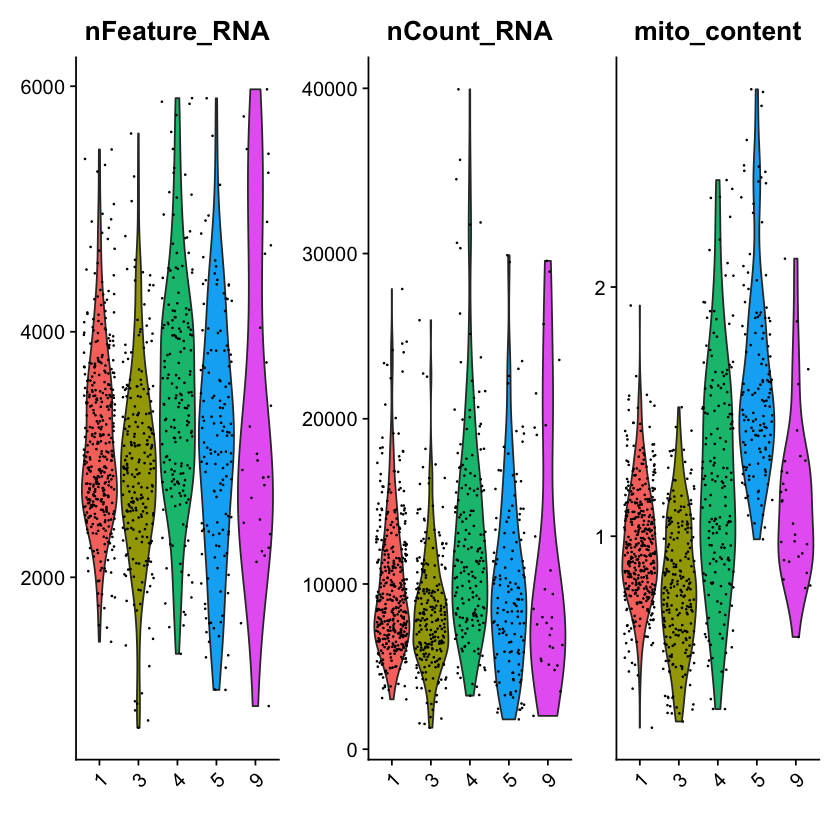

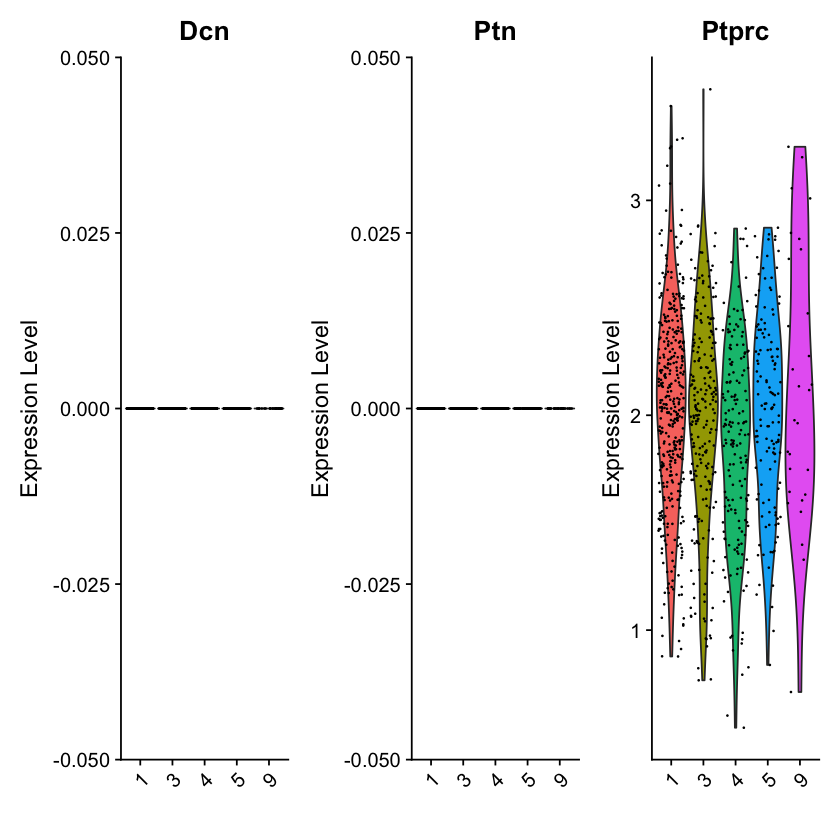

In [38]:
copy_Seuratlist <- c()
for (i in 1:length(INTmac_list)) {
    attempt <- subset(INTmac_list[[i]],
                                    Ptprc>0
                                    )
    try(    attempt <- subset(INTmac_list[[i]],
                                    Ptprc>0 & Epcam<0.2
                                    ))
    try(    attempt <- subset(INTmac_list[[i]], #Cif one present other also is
                                    Ptprc>0 & Ptn<0.2 & Dcn<0.2
                                    ))
    try(    attempt <- subset(INTmac_list[[i]],
                                    Ptprc>0 & Epcam<0.2 & Ptn<0.2 & Dcn<0.2
                                    ))
    copy_Seuratlist <- append(copy_Seuratlist, attempt)
}
for (i in 1:length(copy_Seuratlist)) {
    print(copy_Seuratlist[[i]]@project.name)
    print(dim(copy_Seuratlist[[i]]))
    print(VlnPlot(copy_Seuratlist[[i]], 
                    features = c("nFeature_RNA", "nCount_RNA",
                                "mito_content"),
                    ncol = 3, assay = "RNA", group.by = "seurat_clusters", 
                    stack = FALSE) &
        xlab(""))
    print(VlnPlot(copy_Seuratlist[[i]], 
                features = c(fib_markers, epi_markers, mac_markers),
                ncol = 3, assay = "RNA", group.by = "seurat_clusters", 
                stack = FALSE) &
        xlab(""))
}

In [39]:
#Save object list before integration:
saveRDS(copy_Seuratlist,"../RData/INTmac_list.rds")

In [2]:
#Load object list before integration:
INTmac_list <- readRDS("../RData/INTmac_list.rds")

scDblFind (deprecated)

In [ ]:
# library(scDblFinder)

In [ ]:
# SCE_INTfibF1_list <- c()
# for (i in 1:length(INTfibF1_list)) {
#     SCE_INTfibF1_list <- append(SCE_INTfibF1_list,
#                                 as.SingleCellExperiment(INTfibF1_list[[i]], 
#                                     assay="RNA")
#                                 )
# }

# for (i in 1:length(SCE_INTfibF1_list)) {
#     scDblFinder(SCE_INTfibF1_list[[i]], 
#                 clusters=NULL, 
#                 nfeatures=2400#, 
#                 # samples=""
#                 )
# }


# INTfibF1_list <- c()
# for (i in c(1,3)) { #Obejcts with macs are first and third entries
#   INTfibF1_list <- append(INTfibF1_list, 
#                         c(
#                         subset(crctmeWT[[i]], idents = levels(
#                           crctmeWT[[i]]@active.ident)[startsWith(
#                                 levels(crctmeWT[[i]]@active.ident), "f")]),
#                         subset(crctmeA[[i]], idents = levels(
#                           crctmeA[[i]]@active.ident)[startsWith(
#                                 levels(crctmeA[[i]]@active.ident), "f")]),
#                         subset(crctmeAK[[i]], idents = levels(
#                           crctmeAK[[i]]@active.ident)[startsWith(
#                                 levels(crctmeAK[[i]]@active.ident), "f")]),
#                         subset(crctmeAKP[[i]], idents = levels(
#                           crctmeAKP[[i]]@active.ident)[startsWith(
#                                 levels(crctmeAKP[[i]]@active.ident), "f")]),
#                         subset(tmecontrols[[i]], idents = levels(
#                           tmecontrols[[i]]@active.ident)[startsWith(
#                                 levels(tmecontrols[[i]]@active.ident), "f")])
#                         )
#                         )
# }
# length(INTfibF1_list)

# Integration

First ensure normalisation of data makes sense (RNA assay properly normalised)

In [3]:
for (i in 1:length(INTmac_list)) {
    print(INTmac_list[[i]]@project.name)
    print(summary(as.data.frame(INTmac_list[[i]]@assays$RNA@data))[,1:3])
    #The scale.data slot is empty for the second seq run datasets!
}


[1] "cocultWTMac"
 AAAGAACAGGATACAT-1 AAAGGTATCTCTATGT-1 AAAGTCCTCGCTGTCT-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1747     Mean   :0.1811     Mean   :0.1852    
 3rd Qu.:0.0000     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :5.9777     Max.   :6.1342     Max.   :5.6168    
[1] "cocultAMac"
 AAACGCTTCCGTGTGG-1 AAAGAACAGATGAACT-1 AAAGAACGTCCAGCCA-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1539     Mean   :0.1829     Mean   :0.1171    
 3rd Qu.:0.0000     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :6.2426     Max.   :6.1281     Max.   :5.9471    
[1] "cocultAKMac"
 AAACCCACACCACTGG-1 AAACCCACAGGCGAAT-1 AAACCCAGTACAGAGC-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000    

In [4]:
for (i in 1:length(INTmac_list)) {
    INTmac_list[[i]] <- NormalizeData(
                            INTmac_list[[i]],
                            assay="RNA",
                            normalization.method = "LogNormalize",
                            scale.factor = 10000
    )
    print(summary(as.data.frame(INTmac_list[[i]]@assays$RNA@data))[,1:3])
}

 AAAGAACAGGATACAT-1 AAAGGTATCTCTATGT-1 AAAGTCCTCGCTGTCT-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1747     Mean   :0.1811     Mean   :0.1852    
 3rd Qu.:0.0000     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :5.9777     Max.   :6.1342     Max.   :5.6168    
 AAACGCTTCCGTGTGG-1 AAAGAACAGATGAACT-1 AAAGAACGTCCAGCCA-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1539     Mean   :0.1829     Mean   :0.1171    
 3rd Qu.:0.0000     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :6.2426     Max.   :6.1281     Max.   :5.9471    
 AAACCCACACCACTGG-1 AAACCCACAGGCGAAT-1 AAACCCAGTACAGAGC-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.000

Then use rPCA integration:
* SCT norm the individual datasets
    * Sanity check they have already been normalised
* Integrate data

In [10]:
for (i in 1:length(INTmac_list)) {
    print(INTmac_list[[i]]@project.name)
    print(INTmac_list[[i]]@assays$SCT)
}

[1] "cocultWTMac"
SCTAssay data with 17294 features for 749 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Apoa1, Saa3, Apoe, Apoc3, Lyz2, Apoa4, Prap1, Tff3, Pf4, Marco 
[1] "cocultAMac"
SCTAssay data with 17793 features for 1379 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Saa3, Apoe, Muc3, Prap1, Pf4, Marco, Lyz2, Krt8, Crip1, Apoa1 
[1] "cocultAKMac"
SCTAssay data with 17309 features for 1259 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Saa3, Apoe, Lyz2, Pf4, Marco, Ccl5, Ly6c2, Car1, Spp1, Slpi 
[1] "cocultAKPMac_REPLICATE"
SCTAssay data with 18218 features for 1352 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Saa3, Apoe, Pf4, Marco, Lyz2, Ccl5, Cd5l, Thbs1, C1qa, Spp1 
[1] "monoMac"
SCTAssay data with 14538 features for 2568 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Saa3, Marco, Mmp12, Cd74, Hmox1, S100a8, Cd5l, H2-Aa, Apoe, Ccl5 
[1] "cocultWTMacFib"
SCTAssay data with 21464 features for 1092 cells, and 1 SCTModel(s) 
Top 10 variable feat

### SCT Normalisation

Sadly it looks like the SCT models computed originally contain some spurrious 
genes in them due to being computed before stringent QC filtering. 
This means that we will have to recompute the SCT assay, and we will do so 
using the updated cell cycle regression.

In [ ]:
for (i in 1:length(INTmac_list)) {
    INTmac_list[[i]] <- SCTransform(INTmac_list[[i]],
                                        new.assay.name = "SCT", 
                                        vars.to.regress = "mito_content",
                                        variable.features.n = 10000)}

In [18]:
cc_genes <- read_tsv("../../../../D_CommonDatasets/CellCycle_geneSet.txt")
s.features  <- na.omit(cc_genes$s) %>% str_to_sentence()
g2m.features <- na.omit(cc_genes$g2m) %>% str_to_sentence()
g1.features <- na.omit(cc_genes$g1) %>% str_to_sentence()
g1s.features <- unique(c(s.features, g1.features))
g1s.features <- setdiff(g1s.features, g2m.features)

New names:
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
Rows: 248 Columns: 6
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): s, g2m, g1
lgl (3): ...4, ...5, ...6

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [19]:
for (i in 1:length(INTmac_list)) {
    INTmac_list[[i]] <- CellCycleScoring(INTmac_list[[i]], 
                                            s.features = g1s.features, 
                                            g2m.features = g2m.features, 
                                            assay="SCT", set.ident = TRUE)
    INTmac_list[[i]]$Phase <- recode(INTmac_list[[i]]$Phase, G1="Other", 
                                        S="Cycling", G2M="Highly cycling")
}

Warning message:
“The following features are not present in the object: Ccdc150, Cpne8, Dscc1, Exo1, Fanci, Gm13547, Lyrm7, Mlf1ip, Rad51ap1, Reep1, Rhobtb3, 1700009n14rik, 2700049a03rik, Adamts1, Amd2, Bard1, Bc048507, Gata2, Gm12666, Gm45713, Gm49369, Orc1, Osbpl6, Plcxd1, Recql4, Taf9, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cdc42ep1, Cfd, Depdc1a, Depdc1b, Fam83d, Gas1, Gm10184, Gm28635, Kif14, Mnd1, Pif1, Polq, Ptp4a1, Rbm8a2, Tfap2a, Timp1, Usp13, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ccdc150, Gm13547, Mlf1ip, Reep1, Rhobtb3, 1700009n14rik, 2700049a03rik, Adamts1, Bc048507, Gata2, Gm12666, Gm45713, Gm49369, Osbpl6, Plcxd1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cdc42ep1, Cfd, Depdc1b, Gas1, Gm28635, Kif14, Pif1, Ptp4a1, Tfap2a, Timp1, Usp13, not searching for symbol synonyms”
War

In [ ]:
for (i in 1:length(INTmac_list)) {
    INTmac_list[[i]]$CCDiff <- INTmac_list[[i]]$S.Score - INTmac_list[[i]]$G2M.Score
    INTmac_list[[i]] <- SCTransform(INTmac_list[[i]], 
                                        new.assay.name = "SCT", 
                                        vars.to.regress = c("mito_content",
                                                            "CCDiff"),
                                        variable.features.n = 10000)}

## Integrate object list

In [21]:
# for (i in 1:length(INTmac_list)) {
#     INTmac_list[[i]] <- FindVariableFeatures(INTmac_list[[i]],
#                                             selection.method = "vst",
#                                             nfeatures = 10000, assay = "RNA")
# }
INTmac_feats <- SelectIntegrationFeatures(object.list=INTmac_list, 
                                            nfeatures =3000)
INTmac_list <- PrepSCTIntegration(object.list=INTmac_list, 
                                    anchor.features=INTmac_feats)
INTmac_list <- lapply(X = INTmac_list,
                        FUN = RunPCA,
                        features = INTmac_feats,
                        assay = "SCT", reduction.name="pca")

PC_ 1 
Positive:  Prdx1, Hmox1, Cd36, Lgals3, Rnf128, Lpl, S100a4, Gclm, Esd, Mt1 
	   Pgk1, Mif, Pkm, S100a6, Cd9, Basp1, Ero1l, Sqstm1, Ftl1, Ldha 
	   Srxn1, Mt2, Hsp90aa1, Spp1, Cyb5a, Txnrd1, Gstm1, Gpnmb, Gapdh, Bst1 
Negative:  Apoe, C1qb, C1qa, Selenop, Ly6a, C1qc, Ifitm2, Tmem176b, Tmem176a, Ifi27l2a 
	   Saa3, Trf, Ly6e, Ifitm3, Pltp, Aif1, Serinc3, Cp, Zfp36l1, Cd52 
	   Cfp, Csf1r, Ifit2, Igfbp4, Ifi44, Ccl6, Ms4a6b, Ifi204, Ms4a6c, Fcgrt 
PC_ 2 
Positive:  Cybb, Sod2, Saa3, Fpr1, Fpr2, Prdx5, Clec4e, Bst1, Clec4n, Marcksl1 
	   Thbs1, Pla2g7, C3, Ifitm6, Pgk1, Mt1, Lyz2, Prdx1, Hp, Gclm 
	   Cxcl2, Slc16a3, Acod1, Vcan, Slpi, Hif1a, Cd14, Ero1l, Marco, Ifitm2 
Negative:  Spp1, Fabp5, Gpnmb, Lpl, Ctsb, Il7r, Lgals3, Lgmn, Ctsd, Fabp4 
	   Cd68, Grn, Lat2, Ctss, Hexb, Syngr1, Id2, Apoe, Pld3, Abcg1 
	   Cxcr4, Psap, Cd63, Fnip2, Ctnnb1, Timp2, Ms4a7, C1qb, Rgs1, Gatm 
PC_ 3 
Positive:  Ifi27l2a, Tmem176a, Tmem176b, Ms4a4c, Actb, Ckb, Lpl, Cd74, Coro1a, Cd72 
	   Serp1, Tmsb4

In [22]:
INTmac_anchors <- FindIntegrationAnchors(INTmac_list, normalization.method = "SCT",
                                        anchor.features = INTmac_feats,
                                        reduction = "rpca", k.anchor = 12)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 4260 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 3752 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 6006 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 3776 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 6472 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 6375 anchors

Projecting new data onto SVD

Projec

Integration dies at min10 (Merging dataset 8 9 6 7 10 into 1 2 4 3 11 12 13 5) 
with `Error: vector memory exhausted (limit reached?)` when using 4k Integration
features.
Lowering features to XXXX works.

In [23]:
INTmac <- IntegrateData(anchorset = INTmac_anchors, 
                                normalization.method = "SCT")

Merging dataset 7 into 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 9 into 8

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 5 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 3 into 5 1 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 7 into 8 9

Extracting anchors for merged samples

Finding integration vectors

Findin

In [25]:
print(INTmac)
head(INTmac@meta.data)

An object of class Seurat 
44923 features across 11809 samples within 3 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 other assays present: RNA, SCT


,orig.ident,nCount_RNA,nFeature_RNA,mito_content,rfp_content,gfp_content,nCount_SCT,nFeature_SCT,S.Score,G2M.Score,Phase,old.ident,CCDiff,SCT_snn_res.0.6,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>
AAAGAACAGGATACAT-1_1,cocultWTMac,9631,2963,0.8618004,0,0,8464,2945,0.03315700,-0.04057864,Cycling,mHmox,0.07373563,1,1
AAAGGTATCTCTATGT-1_1,cocultWTMac,7559,2830,0.7276095,0,0,7671,2819,0.05505916,-0.02382916,Cycling,mHmox,0.07888832,1,1
AAAGTCCTCGCTGTCT-1_1,cocultWTMac,8978,3063,1.1583872,0,0,8388,3052,0.03232883,-0.01006120,Cycling,mC1,0.04239003,3,3
AAATGGATCGCCGAGT-1_1,cocultWTMac,11122,3442,1.3306959,0,0,8691,3421,0.04792565,-0.01596771,Cycling,mHmox,0.06389336,1,1
AACAAAGAGCTTTCCC-1_1,cocultWTMac,5337,2116,0.5059022,0,0,7212,2117,0.01045888,-0.05270888,Cycling,mHmox,0.06316776,1,1
AACAACCAGTCGGCCT-1_1,cocultWTMac,9338,3029,0.7603341,0,0,8436,3023,0.00319770,-0.02259723,Cycling,mC1,0.02579493,3,3


PC_ 1 
Positive:  Apoe, Selenop, C1qa, C1qb, C1qc, Ly6a, Ly6e, Saa3, Ifi27l2a, Ifitm2 
	   Pltp, Tmem176b, Tmem176a, Ctsc, Ifit2, Aif1, Ms4a6c, Maf, Igfbp4, Ifitm3 
	   Fcrls, Fcgrt, Grn, Clec4a3, Ifi44, Ms4a6b, Lgmn, Zfp36l1, Apobec3, Cfp 
Negative:  Prdx1, Hmox1, Cd36, Rnf128, S100a6, Ero1l, Sqstm1, Pgk1, Lpl, Lgals3 
	   Mt1, Slc7a11, Mif, S100a4, Gclm, Srxn1, Procr, Esd, Ddit3, Pkm 
	   Bst1, Mt2, Ifrd1, Slc16a3, Ldha, Hspa9, Tpi1, Mmp12, Txnrd1, Basp1 
PC_ 2 
Positive:  Saa3, Cybb, Fpr2, Hp, Ly6c2, Clec4e, Mmp8, Thbs1, F13a1, Sod2 
	   Gda, Vcan, Plac8, Prdx5, Bst1, S100a8, Gpr141, Marcksl1, Fpr1, C3 
	   Slc16a3, Acod1, Ccr2, Marco, Ifitm6, Sell, Lcn2, Fbxl5, Lyz2, Chil3 
Negative:  Spp1, Fabp5, Lgals3, Ctsb, Gpnmb, Lpl, Lgmn, Ctsd, Cd5l, Gas6 
	   Cd63, Fabp4, Apoe, Selenop, Timp2, Il7r, Lat2, Serpinb6a, Psap, Tceal9 
	   Pmp22, Pld3, Vat1, Creg1, Anpep, Trem2, Abcg1, Grn, Cstb, Tfrc 
PC_ 3 
Positive:  Lpl, Actb, Ckb, Siglece, Ccr2, Cd72, Cd74, Ms4a4c, Ifi27l2a, Tmsb4x 
	   Ighm

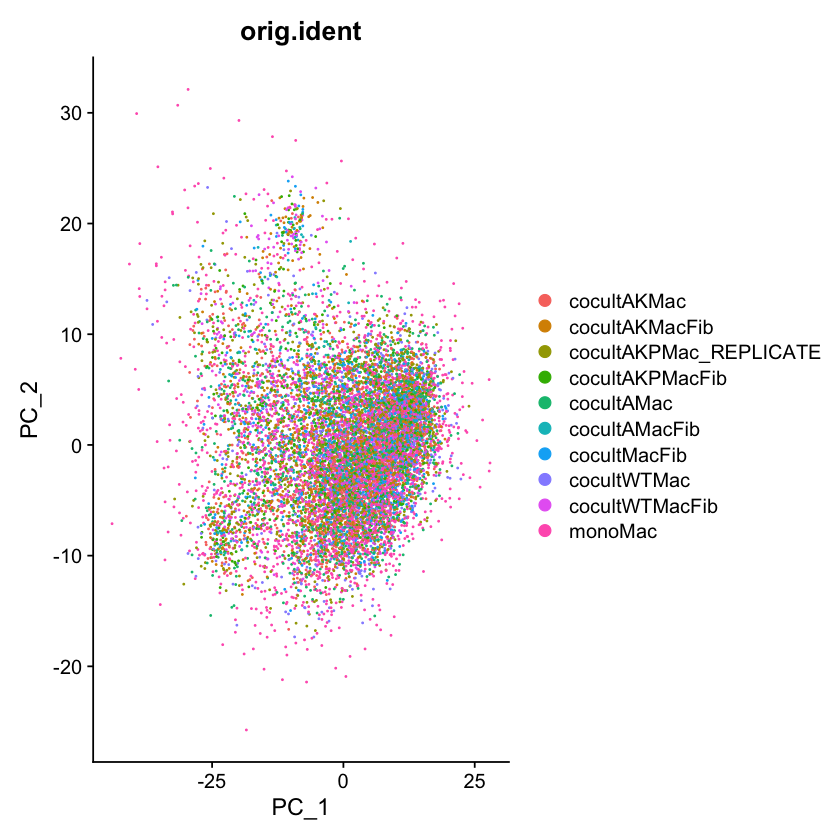

In [26]:
INTmac <- RunPCA(INTmac, assay="integrated", reduction.name="pcaMAC")
DimPlot(INTmac, reduction = "pcaMAC", group.by = "orig.ident", shuffle = TRUE)

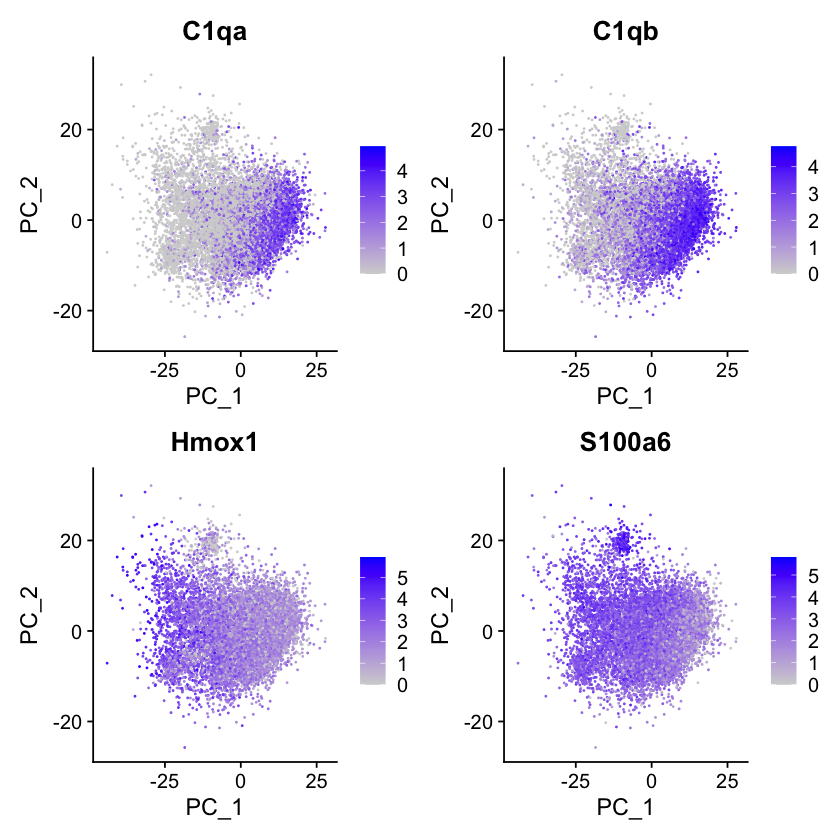

In [27]:
INTmac@active.assay <- "RNA"
FeaturePlot(INTmac, features = c("C1qa","C1qb", "Hmox1", "S100a6"))
INTmac@active.assay <- "integrated"

In [28]:
#Popoulate scale.data slot on  RNA assay from the normalised values in @data
INTmac <- ScaleData(INTmac, features=rownames(INTmac@assays$SCT), assay="RNA")

Centering and scaling data matrix



# Condition DE

In [30]:
INTmac <- SetIdent(INTmac, value="orig.ident")
levels(INTmac@active.ident)

[1] "cocultWTMac"            "cocultAMac"             "cocultAKMac"           
 [4] "cocultAKPMac_REPLICATE" "monoMac"                "cocultWTMacFib"        
 [7] "cocultAMacFib"          "cocultAKMacFib"         "cocultAKPMacFib"       
[10] "cocultMacFib"

In [31]:
gDE_INTmac_orig <- FindAllMarkers(
                    INTmac, assay = "RNA",
                    min.pct = 0.1, only.pos = FALSE, test.use = "wilcox", 
                    random.seed = 12)
gDE_INTmac_orig

Calculating cluster cocultWTMac

Calculating cluster cocultAMac

Calculating cluster cocultAKMac

Calculating cluster cocultAKPMac_REPLICATE

Calculating cluster monoMac

Calculating cluster cocultWTMacFib

Calculating cluster cocultAMacFib

Calculating cluster cocultAKMacFib

Calculating cluster cocultAKPMacFib

Calculating cluster cocultMacFib



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Apoa1,0.000000e+00,0.9069458,0.494,0.010,0.000000e+00,cocultWTMac,Apoa1
Gsta1,0.000000e+00,0.7583652,0.409,0.023,0.000000e+00,cocultWTMac,Gsta1
Fabp2,0.000000e+00,0.6284658,0.339,0.009,0.000000e+00,cocultWTMac,Fabp2
Muc3,0.000000e+00,0.6037298,0.355,0.018,0.000000e+00,cocultWTMac,Muc3
Prap1,0.000000e+00,0.5618110,0.324,0.021,0.000000e+00,cocultWTMac,Prap1
Rbp2,0.000000e+00,0.3768437,0.214,0.008,0.000000e+00,cocultWTMac,Rbp2
Lypd8,3.672272e-272,0.4523675,0.271,0.021,9.369435e-268,cocultWTMac,Lypd8
Krt8,1.627551e-253,1.1152112,0.802,0.259,4.152534e-249,cocultWTMac,Krt8
Zg16,2.970745e-248,0.5308211,0.283,0.026,7.579560e-244,cocultWTMac,Zg16


In [32]:
gDE_INTmac_orig_n6 <- gDE_INTmac_orig %>% group_by(cluster) %>% slice_max(n=6, order_by = c(abs(avg_log2FC)))
gDE_INTmac_orig_n6

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.051635e-15,-2.0285541,0.017,0.111,2.683142e-11,cocultWTMac,S100a9
2.871445e-03,-1.5478447,0.175,0.218,1.000000e+00,cocultWTMac,S100a8
4.198717e-24,-1.4871847,0.088,0.243,1.071261e-19,cocultWTMac,Ifitm1
9.940693e-98,-1.3475476,1.000,1.000,2.536269e-93,cocultWTMac,CT010467.1
7.213520e-12,-1.1704285,0.796,0.822,1.840458e-07,cocultWTMac,Pf4
1.627551e-253,1.1152112,0.802,0.259,4.152534e-249,cocultWTMac,Krt8
7.134373e-33,-2.4729642,0.012,0.118,1.820264e-28,cocultAMac,S100a9
4.992432e-14,-2.2287315,0.138,0.226,1.273769e-09,cocultAMac,S100a8
1.420480e-190,-1.6168148,1.000,1.000,3.624213e-186,cocultAMac,CT010467.1


In [33]:
unique(gDE_INTmac_orig_n6$gene)
print(length(unique(gDE_INTmac_orig_n6$gene)))

[1] "S100a9"     "S100a8"     "Ifitm1"     "CT010467.1" "Pf4"       
 [6] "Krt8"       "Ccl8"       "Nupr1"      "Mrc1"       "Egr1"      
[11] "mt-Rnr1"    "Wfdc17"     "Ccl6"       "Gapdh"      "Lpl"       
[16] "Arg1"       "Cxcl2"      "Ccl7"       "Ubb"        "Mt1"       
[21] "Cd5l"       "Mir6236"    "Psap"       "Grn"        "F13a1"     
[26] "Dab2"       "Gm10076"    "Uba52"

[1] 28


# ComplexHeatmap

In [34]:
print(INTmac@assays$RNA@data)

25514 x 11809 sparse Matrix of class "dgCMatrix"


   [[ suppressing 32 column names ‘AAAGAACAGGATACAT-1_1’, ‘AAAGGTATCTCTATGT-1_1’, ‘AAAGTCCTCGCTGTCT-1_1’ ... ]]

   [[ suppressing 32 column names ‘AAAGAACAGGATACAT-1_1’, ‘AAAGGTATCTCTATGT-1_1’, ‘AAAGTCCTCGCTGTCT-1_1’ ... ]]



                                                                                
Rp1           .         .         .         .        .        .        .        
Gm6085        .         .         .         .        .        .        .        
Gm6119        .         .         .         .        .        .        .        
Mrpl15        .         .         .         0.641390 .        .        .        
Gm37144       .         .         .         .        .        .        .        
Lypla1        0.7121229 0.8428277 .         .        .        0.727980 0.6781424
Gm37988       .         .         .         .        .        .        .        
Tcea1         0.7121229 0.8428277 0.7485033 .        .        1.144792 .        
Rgs20         .         .         .         .        .        .        .        
Atp6v1h       .         0.8428277 0.7485033 .        .        .        .        
Gm37567       .         .         .         .        .        .        .        
Rb1cc1        1.1238340 .   

   [[ suppressing 32 column names ‘AAAGAACAGGATACAT-1_1’, ‘AAAGGTATCTCTATGT-1_1’, ‘AAAGTCCTCGCTGTCT-1_1’ ... ]]



                                                                                    
Gm19331       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Egflam        . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gdnf          . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm24144       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Slc1a3        . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm37310       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Ranbp3l       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm8174        . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm10389       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
C1qtnf3       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Adamts12      . . . . . . . . . . . . . . . . . . . . . . . . . .

In [35]:
mat_DEorig <- INTmac[["RNA"]]@scale.data[unique(gDE_INTmac_orig_n6$gene),] %>% 
                as.matrix()
mat_DEorig

,AAAGAACAGGATACAT-1_1,AAAGGTATCTCTATGT-1_1,AAAGTCCTCGCTGTCT-1_1,AAATGGATCGCCGAGT-1_1,AACAAAGAGCTTTCCC-1_1,AACAACCAGTCGGCCT-1_1,AACAACCCAAAGAGTT-1_1,AACAAGATCCTGGTCT-1_1,AACACACAGACTGAGC-1_1,AACACACTCGGACGTC-1_1,⋯,TTTAGTCCAACGATCT-1_10,TTTATGCCAGTAGGAC-1_10,TTTCACACACGACTAT-1_10,TTTCACAGTAGGAGTC-1_10,TTTCAGTGTTGCATAC-1_10,TTTCGATAGTTGGAAT-1_10,TTTGATCCAATCCTAG-1_10,TTTGGAGTCACCATCC-1_10,TTTGTTGAGGTGCTAG-1_10,TTTGTTGCAGCGGATA-1_10
S100a9,-0.2249502,-0.22495021,-0.22495021,-0.22495021,-0.2249502,-0.22495021,-0.22495021,-0.22495021,-0.224950215,-0.22495021,⋯,-0.22495021,-0.22495021,-0.2249502,-0.224950215,-0.22495021,-0.2249502,-0.22495021,-0.224950215,-0.22495021,-0.22495021
S100a8,-0.3552605,-0.35526048,-0.35526048,-0.35526048,-0.3552605,-0.35526048,-0.35526048,-0.35526048,-0.355260482,0.17483946,⋯,-0.35526048,-0.35526048,-0.3552605,0.658491975,-0.35526048,0.6115779,-0.35526048,0.387386750,-0.35526048,-0.35526048
Ifitm1,-0.4429863,-0.44298630,-0.44298630,-0.44298630,-0.4429863,1.26417300,-0.44298630,-0.44298630,-0.442986300,-0.44298630,⋯,-0.44298630,-0.44298630,-0.4429863,0.610126992,-0.44298630,-0.4429863,-0.44298630,0.328495599,1.74326685,-0.44298630
CT010467.1,-0.2120492,-0.48482396,-0.47512730,-1.22176695,-1.0964164,-1.06097793,-0.77594976,-0.86740800,-1.104448652,-0.82078936,⋯,-0.48951016,-0.27449428,0.3618967,0.072308653,-0.07502898,-0.4185404,-0.20299731,0.443091274,-0.28385458,-1.07374151
Pf4,0.9225076,-0.05360418,0.97820364,0.40373569,1.1656516,-0.01227354,0.90985853,-0.02321343,-1.383436380,-0.64741844,⋯,1.01782540,-0.62647939,-0.2660584,-1.383436380,1.15185340,0.5696832,1.58110160,0.566014834,-0.87069951,0.77170324
Krt8,-0.5836574,-0.58365738,-0.58365738,-0.58365738,3.7216306,0.75642849,1.92668312,1.66853103,1.405201991,2.20198679,⋯,-0.58365738,-0.58365738,-0.5836574,-0.583657381,-0.58365738,-0.5836574,-0.58365738,-0.583657381,-0.58365738,-0.58365738
Ccl8,-0.3894146,-0.38941456,0.49821519,0.37119249,-0.3894146,-0.38941456,-0.38941456,-0.38941456,-0.389414556,-0.38941456,⋯,2.31426629,-0.38941456,-0.3894146,0.662614989,0.67635084,2.2139684,-0.38941456,-0.389414556,-0.38941456,-0.38941456
Nupr1,-0.8119837,-0.81198367,-0.81198367,-0.81198367,-0.8119837,-0.81198367,-0.81198367,0.13427504,0.003796301,0.83754674,⋯,-0.81198367,0.68471492,-0.8119837,-0.811983668,-0.81198367,-0.8119837,-0.81198367,-0.031786646,0.20182896,0.79589425
Mrc1,-0.9351905,0.95511273,0.99946626,-0.93519046,-0.9351905,-0.18699623,-0.93519046,-0.93519046,-0.935190457,-0.45841867,⋯,1.55132597,2.49933978,1.6948049,-0.935190457,2.70404506,1.1563465,1.32524126,0.422169236,0.71489338,1.75295219
Egr1,-0.7087950,1.85885347,1.49793102,1.28874476,0.5286920,-0.70879505,1.83555903,-0.70879505,1.364961694,0.71231310,⋯,-0.70879505,1.38342492,-0.7087950,0.331195091,-0.70879505,1.6768732,0.28610424,-0.708795049,-0.70879505,0.32154255


Order of orig.idents

In [37]:
print(unique(INTmac@meta.data$orig.ident))
INTmac@meta.data$orig.ident <- factor(
                                INTmac@meta.data$orig.ident,
                                levels= c(
                                    "monoMac", 
                                    "cocultWTMac", 
                                    "cocultAMac",
                                    "cocultAKMac",
                                    "cocultAKPMac_REPLICATE",
                                    "cocultMacFib",
                                    "cocultWTMacFib","cocultAMacFib",
                                    "cocultAKMacFib", "cocultAKPMacFib"
                                )
)
levels(INTmac@meta.data$orig.ident)

 [1] "cocultWTMac"            "cocultAMac"             "cocultAKMac"           
 [4] "cocultAKPMac_REPLICATE" "monoMac"                "cocultWTMacFib"        
 [7] "cocultAMacFib"          "cocultAKMacFib"         "cocultAKPMacFib"       
[10] "cocultMacFib"          


[1] "monoMac"                "cocultWTMac"            "cocultAMac"            
 [4] "cocultAKMac"            "cocultAKPMac_REPLICATE" "cocultMacFib"          
 [7] "cocultWTMacFib"         "cocultAMacFib"          "cocultAKMacFib"        
[10] "cocultAKPMacFib"

The automatically generated colors map from the minus and plus 99^th of
the absolute values in the matrix. There are outliers in the matrix
whose patterns might be hidden by this color mapping. You can manually
set the color to `col` argument.

Use `suppressMessages()` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



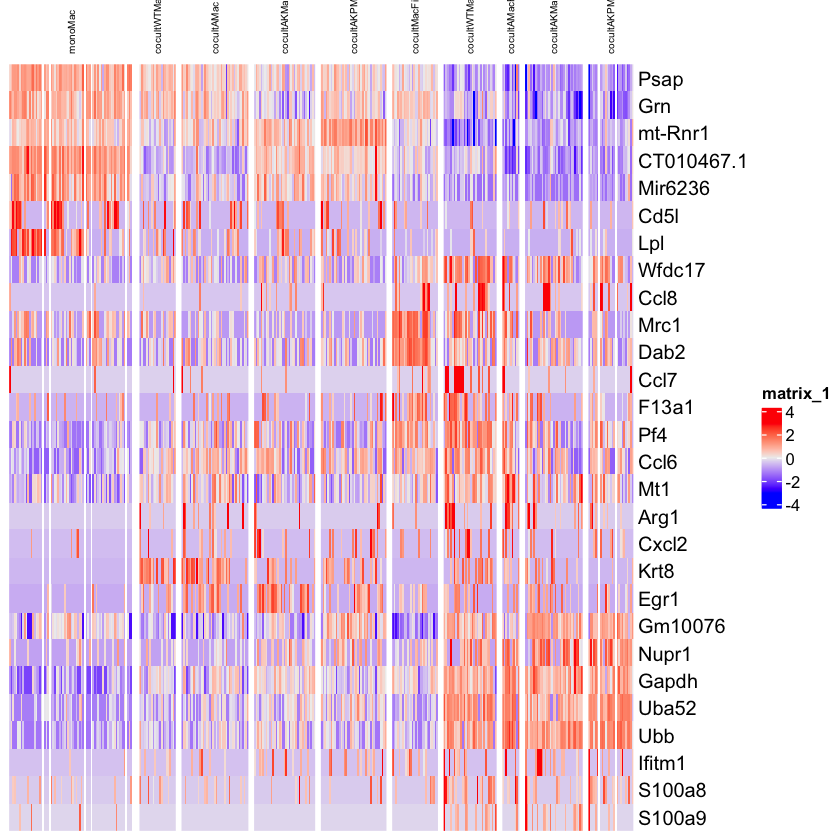

In [38]:
Heatmap(mat_DEorig,
        column_split = INTmac@meta.data$orig.ident,
        cluster_columns = TRUE, show_column_dend = FALSE, cluster_column_slices = FALSE,
        cluster_rows = TRUE, cluster_row_slices = TRUE, show_row_dend = FALSE,
        column_title_rot = 90, column_title_gp = gpar(fontsize=6),
        column_gap = unit(1.2, "mm"), show_column_names = FALSE
        )

## Figure

Fancy Heatmap with metadata annotations:


In [40]:
palette_epigenotype <- c(
                    "WT"="#669966", 
                    "A"="#666633",
                    "AK"="#336699", 
                    "AKP"="#3366CC"
                    )
palette_fibro <- c(
                    "0"="#FFFFFF",
                    "1"="#FF6666"
                    )

In [41]:
mdEPIgeno <- INTmac@meta.data %>%
                transmute(EPIgeno = case_when(
                    as.character.factor(orig.ident) %in% c(
                        "cocultWTMac","cocultWTMacFib"
                    ) ~ "WT",
                    as.character.factor(orig.ident) %in% c(
                        "cocultAMac", "cocultAMacFib"
                    ) ~ "A",
                    as.character.factor(orig.ident) %in% c(
                        "cocultAKMac", "cocultAKMacFib"
                    ) ~ "AK",
                    as.character.factor(orig.ident) %in% c(
                        "cocultAKPMac_REPLICATE", "cocultAKPMacFib"
                    ) ~ "AKP",
                    #TRUE ~ as.character.factor(orig.ident)
                ))
mdEPIgeno %>% group_by(EPIgeno) %>% summarise(n())

EPIgeno,n()
<chr>,<int>
A,1730
AK,2448
AKP,2278
WT,1841
NA,3512


In [42]:
mdFIB <- INTmac@meta.data %>%
                transmute(FIB = case_when(
                    as.character.factor(orig.ident) %in% c(
                        "cocultMacFib",
                        "cocultWTMacFib","cocultAMacFib",
                        "cocultAKMacFib", "cocultAKPMacFib"
                    ) ~ "1",
                    TRUE ~ "0"
                ))
mdFIB %>% group_by(FIB) %>% summarise(n())

FIB,n()
<chr>,<int>
0,7307
1,4502


In [43]:
INTmac <- AddMetaData(INTmac, metadata = c(mdEPIgeno, mdFIB))
head(INTmac@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,mito_content,rfp_content,gfp_content,nCount_SCT,nFeature_SCT,S.Score,G2M.Score,Phase,old.ident,CCDiff,SCT_snn_res.0.6,seurat_clusters,EPIgeno,FIB
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
AAAGAACAGGATACAT-1_1,cocultWTMac,9631,2963,0.8618004,0,0,8464,2945,0.03315700,-0.04057864,Cycling,mHmox,0.07373563,1,1,WT,0
AAAGGTATCTCTATGT-1_1,cocultWTMac,7559,2830,0.7276095,0,0,7671,2819,0.05505916,-0.02382916,Cycling,mHmox,0.07888832,1,1,WT,0
AAAGTCCTCGCTGTCT-1_1,cocultWTMac,8978,3063,1.1583872,0,0,8388,3052,0.03232883,-0.01006120,Cycling,mC1,0.04239003,3,3,WT,0
AAATGGATCGCCGAGT-1_1,cocultWTMac,11122,3442,1.3306959,0,0,8691,3421,0.04792565,-0.01596771,Cycling,mHmox,0.06389336,1,1,WT,0
AACAAAGAGCTTTCCC-1_1,cocultWTMac,5337,2116,0.5059022,0,0,7212,2117,0.01045888,-0.05270888,Cycling,mHmox,0.06316776,1,1,WT,0
AACAACCAGTCGGCCT-1_1,cocultWTMac,9338,3029,0.7603341,0,0,8436,3023,0.00319770,-0.02259723,Cycling,mC1,0.02579493,3,3,WT,0


In [45]:
htmp_anno <- HeatmapAnnotation(
                EPIgeno = INTmac@meta.data$EPIgeno,
                FIB = INTmac@meta.data$FIB,
                col=list(
                    EPIgeno = palette_epigenotype,
                    FIB = palette_fibro
                ),
                na_col = "#FFFFFF"
)
htmp_anno

A HeatmapAnnotation object with 2 annotations
  name: heatmap_annotation_0 
  position: column 
  items: 11809 
  width: 1npc 
  height: 10.3514598035146mm 
  this object is subsettable
  17.2390666666667mm extension on the right 

    name annotation_type color_mapping height
 EPIgeno discrete vector  user-defined    5mm
     FIB discrete vector  user-defined    5mm

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



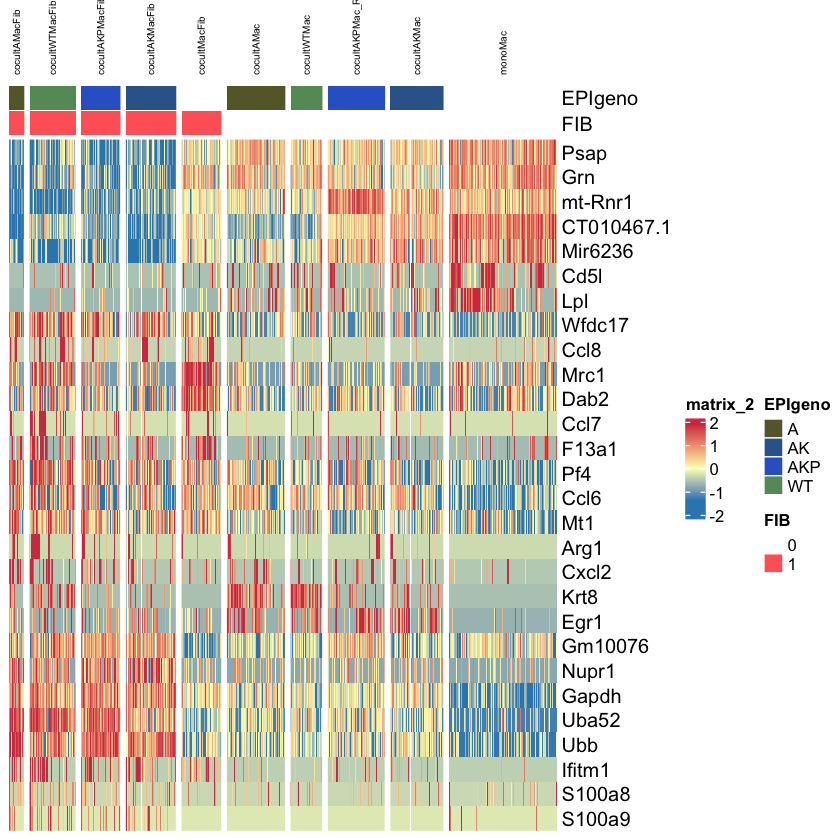

In [46]:
Heatmap(mat_DEorig,
        column_split = INTmac@meta.data$orig.ident,
        cluster_columns = TRUE, show_column_dend = FALSE, cluster_column_slices = TRUE,
        cluster_rows = TRUE, cluster_row_slices = TRUE, show_row_dend = FALSE,
        column_title_rot = 90, column_title_gp = gpar(fontsize=6),
        column_gap = unit(1.2, "mm"), show_column_names = FALSE,
        top_annotation = htmp_anno,
        use_raster = TRUE, raster_quality = 2,
        col=circlize::colorRamp2(
                c(round(quantile(mat_DEorig, c(0.04,0.96))[1], digits = 1),
                0, 
                round(quantile(mat_DEorig, c(0.04,0.96))[2], digits = 1)), 
                c("#3288BD", "#FEFEBD", "#D53E4F"))
        )

# Save key objects

In [29]:
#INTfib
saveRDS(INTmac,"../RData/INTmac.rds")

In [47]:
#DEgenes
saveRDS(gDE_INTmac_orig,"../RData/gDE_INTmac_orig.rds")

In [48]:
#Heatmap
pHtmp_MACconDE <- Heatmap(mat_DEorig,
                    column_split = INTmac@meta.data$orig.ident,
                    cluster_columns = TRUE, show_column_dend = FALSE, cluster_column_slices = TRUE,
                    cluster_rows = TRUE, cluster_row_slices = TRUE, show_row_dend = FALSE,
                    column_title_rot = 90, column_title_gp = gpar(fontsize=6),
                    column_gap = unit(1.2, "mm"), show_column_names = FALSE,
                    top_annotation = htmp_anno,
                    use_raster = TRUE, raster_quality = 2,
                    col=circlize::colorRamp2(
                            c(round(quantile(mat_DEorig, c(0.04,0.96))[1], digits = 1),
                            0, 
                            round(quantile(mat_DEorig, c(0.04,0.96))[2], digits = 1)), 
                            c("#3288BD", "#FEFEBD", "#D53E4F"))
                    )
saveRDS(pHtmp_MACconDE, "../RData/pHtmp_MACconDE.rds")

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

